In [1]:
#import
import pandas as pd
import numpy as np
import scipy.io as sio
import os
import h5py
from datetime import *
%matplotlib inline
import matplotlib
from mpl_toolkits.mplot3d import Axes3D
import matplotlib.pyplot as plt
from matplotlib import cm
from matplotlib.ticker import LinearLocator, FormatStrFormatter
import seaborn as sns
import matplotlib.gridspec as gridspec
from matplotlib.font_manager import FontProperties
plt.rcParams['font.sans-serif'] = ['SimHei']
plt.rcParams['axes.unicode_minus'] = False
myfont = FontProperties(fname=r'C:\Windows\Fonts\simhei.ttf', size=10)
sns.set(font=myfont.get_name(),style="whitegrid",palette="muted",color_codes=True)
import warnings
warnings.filterwarnings("ignore")
from statsmodels.regression.linear_model import OLS
import random
from scipy import stats
from scipy.optimize import least_squares
import copy
import math
from sklearn.neighbors import KernelDensity
import scipy.stats
import statsmodels as sm
import QuantLib as ql

In [2]:
#full_data
os.chdir(r'C:/Users/bj/Desktop/刘泽丹/Code/')
full = pd.read_csv('full_data_for_generator_from_db.csv')
full.columns = [int(i) for i in full.columns]
full[4] = [int(str(date.fromordinal(i-366)).replace('-','')) for i in full[4]]
full.set_index([0,4],inplace=True)
full_nonright = pd.read_csv('full_data_for_mission.csv')
full_nonright.columns = [int(i) for i in full_nonright.columns]
full_nonright[4] = [int(str(date.fromordinal(int(i)-366)).replace('-','')) for i in full_nonright[4]]
full_nonright.set_index([0,4],inplace = True)
return_info = pd.read_csv('full_data.csv')
return_info.set_index(['S_INFO_WINDCODE','TRADE_DT'],inplace=True)

In [3]:
def how_many_week_date_between(now_date,future_date):
    flag = 0
    if now_date > future_date:
        flag = 1
        now_date,future_date = future_date,now_date
    year = int(now_date[:4])
    month = int(now_date[4:6])
    day = int(now_date[6:])
    now = date(year,month,day)
    year = int(future_date[:4])
    month = int(future_date[4:6])
    day = int(future_date[6:])
    future = date(year,month,day)
    days = 0
    while(now<future):
        now = now + timedelta(days=1)
        if now.isoweekday() == 6 or now.isoweekday() == 7:
            pass
        elif now == date(2018,1,1) or now == date(2018,2,15) or now == date(2018,2,16) or now == date(2018,2,19)\
            or now == date(2018,2,20) or now == date(2018,2,21) or now == date(2018,4,5) or now == date(2018,4,6)\
            or now == date(2018,4,30) or now == date(2018,5,1) or now == date(2018,6,18) or now == date(2018,9,24)\
            or now == date(2018,10,1) or now == date(2018,10,2) or now == date(2018,10,3) or now == date(2018,10,4)\
            or now == date(2018,10,5) or now == date(2018,12,31) or now == date(2019,1,1) or now == date(2019,2,4)\
            or now == date(2019,2,5) or now == date(2019,2,6) or now == date(2019,2,7) or now == date(2019,2,8)\
            or now == date(2019,2,9) or now == date(2019,2,10) or now == date(2019,4,5) or now == date(2019,5,1)\
            or now == date(2019,6,7) or now == date(2019,9,13) or now == date(2019,10,1) or now == date(2019,10,2)\
            or now == date(2019,10,3) or now == date(2019,10,4) or now == date(2019,10,5) or now == date(2019,10,6)\
            or now == date(2019,10,7):
            pass
        else:
            days += 1
    if flag == 1:
        days = -days
    return days
def get_n_week_date_before(now_date,days=1):
    year = int(now_date[:4])
    month = int(now_date[4:6])
    day = int(now_date[6:])
    today = date(year,month,day)
    while(days>0):
        today = today - timedelta(days=1)
        if today.isoweekday() == 6 or today.isoweekday() == 7:
            pass
        elif today == date(2018,1,1) or today == date(2018,2,15) or today == date(2018,2,16) or today == date(2018,2,19)\
            or today == date(2018,2,20) or today == date(2018,2,21) or today == date(2018,4,5) or today == date(2018,4,6)\
            or today == date(2018,4,30) or today == date(2018,5,1) or today == date(2018,6,18) or today == date(2018,9,24)\
            or today == date(2018,10,1) or today == date(2018,10,2) or today == date(2018,10,3) or today == date(2018,10,4)\
            or today == date(2018,10,5) or today == date(2018,12,31) or today == date(2019,1,1) or today == date(2019,2,4)\
            or today == date(2019,2,5) or today == date(2019,2,6) or today == date(2019,2,7) or today == date(2019,2,8)\
            or today == date(2019,2,9) or today == date(2019,2,10) or today == date(2019,4,5) or today == date(2019,5,1)\
            or today == date(2019,6,7) or today == date(2019,9,13) or today == date(2019,10,1) or today == date(2019,10,2)\
            or today == date(2019,10,3) or today == date(2019,10,4) or today == date(2019,10,5) or today == date(2019,10,6)\
            or today == date(2019,10,7):
            pass
        else:
            days -= 1
    year = str(today.year)
    if today.month < 10:
        month = '0' + str(today.month)
    else:
        month = str(today.month)
    if today.day < 10:
        day = '0' + str(today.day)
    else:
        day = str(today.day)
    return year + month + day
def get_n_week_date_after(now_date,days=1):
    year = int(now_date[:4])
    month = int(now_date[4:6])
    day = int(now_date[6:])
    today = date(year,month,day)
    while(days>0):
        today = today + timedelta(days=1)
        if today.isoweekday() == 6 or today.isoweekday() == 7:
            pass
        elif today == date(2018,1,1) or today == date(2018,2,15) or today == date(2018,2,16) or today == date(2018,2,19)\
            or today == date(2018,2,20) or today == date(2018,2,21) or today == date(2018,4,5) or today == date(2018,4,6)\
            or today == date(2018,4,30) or today == date(2018,5,1) or today == date(2018,6,18) or today == date(2018,9,24)\
            or today == date(2018,10,1) or today == date(2018,10,2) or today == date(2018,10,3) or today == date(2018,10,4)\
            or today == date(2018,10,5) or today == date(2018,12,31) or today == date(2019,1,1) or today == date(2019,2,4)\
            or today == date(2019,2,5) or today == date(2019,2,6) or today == date(2019,2,7) or today == date(2019,2,8)\
            or today == date(2019,2,9) or today == date(2019,2,10) or today == date(2019,4,5) or today == date(2019,5,1)\
            or today == date(2019,6,7) or today == date(2019,9,13) or today == date(2019,10,1) or today == date(2019,10,2)\
            or today == date(2019,10,3) or today == date(2019,10,4) or today == date(2019,10,5) or today == date(2019,10,6)\
            or today == date(2019,10,7):
            pass
        else:
            days -= 1
    year = str(today.year)
    if today.month < 10:
        month = '0' + str(today.month)
    else:
        month = str(today.month)
    if today.day < 10:
        day = '0' + str(today.day)
    else:
        day = str(today.day)
    return year + month + day

In [4]:
dividendyield = pd.read_csv('dividendyield2.csv',index_col = 0)
dividendyield.columns = [int(i) for i in dividendyield.columns]

In [5]:
from WindPy import *
w.start()

Welcome to use Wind Quant API for Python (WindPy)!

COPYRIGHT (C) 2017 WIND INFORMATION CO., LTD. ALL RIGHTS RESERVED.
IN NO CIRCUMSTANCE SHALL WIND BE RESPONSIBLE FOR ANY DAMAGES OR LOSSES CAUSED BY USING WIND QUANT API FOR Python.


.ErrorCode=0
.Data=[OK!]

In [7]:
first_date = '2017-01-02'
last_date = '2019-01-30'
todate = 20190130
annualize_factor = 250
profitreturn_factor = 0.4

In [8]:
Rdata = w.edb("M0017138", first_date, last_date, "Fill=Previous")
R = pd.DataFrame(Rdata.Data[0], index=Rdata.Times, columns=['R'])['R']
R.index = [int(str(i).replace('-', '')) for i in R.index]
R.to_csv('Shibor_overnight.csv')

In [9]:
data = w.wsd("000905.SH", "pct_chg", first_date, last_date, "PriceAdj=B")
zz500 = pd.DataFrame(data.Data[0], index=data.Times, columns=['zz500'])['zz500']
zz500.index = [int(str(i).replace('-', '')) for i in zz500.index]
zz500.to_csv('zz500.csv')

In [10]:
R = pd.read_csv('Shibor_overnight.csv',header=None,index_col=0)[1]
zz500 = pd.read_csv('zz500.csv', index_col=0, header=None)[1]

In [11]:
R = R[R.index<=todate]
zz500 = zz500[zz500.index<=todate]

In [12]:
os.chdir(r'C:\Users\bj\Desktop\刘泽丹\Code')
zzIcData = pd.read_csv('zz500_from_db.csv')
zzIcData.columns = [int(i) for i in zzIcData.columns]
zzIcData[1] = [int(str(date.fromordinal(int(i)-366)).replace('-','')) for i in zzIcData[1]]
zzIcData.set_index(1,inplace=True)

In [14]:
expired = pd.read_excel('1_已到期账户0128.xlsx')
not_expired = pd.read_excel('1_暂未到期账户0128.xlsx')
expired['完成净利润'] = [i if i <=0 else 0.6 * i for i in expired['净利润']]

In [15]:
date_start = expired['收款日期'].min()
options_record_date = zz500[zz500.index>=date_start].index.tolist()
weighted_sum = []
deposite = []
premium = []
today_realized_deposite = []
today_realized_premium = []
today_realized_profit = []

for record_date in options_record_date:
    sub_expired = expired[(expired['收款日期']<=record_date) & (expired['出金日期']>=record_date)].\
        loc[:,['股票代码','收款日期','出金日期','保证金','南华虚值','完成净利润']]
    sub_expired.columns = ['股票代码','下单日期','到期日期','保证金','虚值权利金','完成净利润']
    sub_not_expired = not_expired[(not_expired['下单日期']<=record_date) & (not_expired['到期日期']>=record_date)].\
        loc[:,['股票代码','下单日期','到期日期','保证金','虚值权利金']]
    sub_together = pd.concat([sub_expired,sub_not_expired])
    together_weight = sub_together.groupby('股票代码').sum()['保证金']/sub_together.groupby('股票代码').sum()['保证金'].sum()
    together_return = return_info.xs(record_date,level='TRADE_DT').loc[together_weight.index]['cc']
    
    weighted_sum.append((together_return *together_weight).sum())
    deposite.append(sub_together['保证金'].sum())
    premium.append(sub_together['虚值权利金'].sum())
    today_realized_deposite.append(sub_expired[sub_expired['到期日期']==record_date]['保证金'].sum())
    today_realized_premium.append(sub_expired[sub_expired['到期日期']==record_date]['虚值权利金'].sum())
    today_realized_profit.append(sub_expired[sub_expired['到期日期']==record_date]['完成净利润'].sum())
weighted_sum = pd.Series(weighted_sum, index = options_record_date)
deposite = pd.Series(deposite, index = options_record_date)
premium = pd.Series(premium, index = options_record_date)
today_realized_deposite = pd.Series(today_realized_deposite, index = options_record_date)
today_realized_premium = pd.Series(today_realized_premium, index = options_record_date)
today_realized_profit = pd.Series(today_realized_profit, index = options_record_date)
sub_zz500 = zz500[zz500.index.isin(options_record_date)]

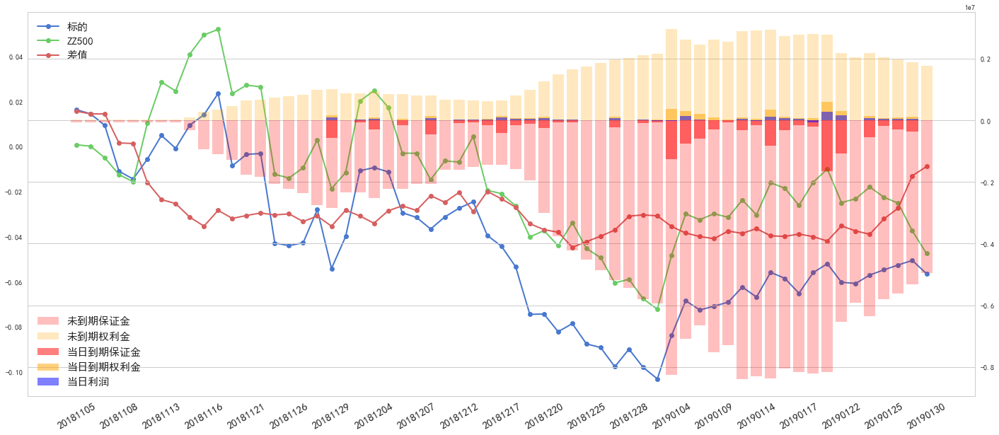

In [16]:
n = len(options_record_date)
X = np.arange(n)
Xlabel = [index for index,value in enumerate(options_record_date) if index%3 == 0]
fig = plt.figure(figsize = (24,10))
ax1 = fig.add_subplot(111)
ax1.plot((weighted_sum/100).cumsum().tolist(), marker = 'o',label = '标的',linewidth = 2)
ax1.plot((sub_zz500/100).cumsum().tolist(), marker = 'o',label = 'ZZ500',linewidth = 2)
ax1.plot(((weighted_sum - sub_zz500)/100).cumsum().tolist(), marker = 'o',label = '差值',linewidth = 2)
ax1.set_xticks(Xlabel)
ax1.set_xticklabels([value for index,value in enumerate(options_record_date) if index%3 == 0],fontsize=15)
plt.setp(plt.gca().get_xticklabels(),rotation=30)
ax1.grid(False)
plt.legend(fontsize = 15,loc=2)
ax2 = ax1.twinx()
ax2.bar(range(len(deposite)),(-deposite).tolist(),color = 'red',alpha = .25, label = '未到期保证金')
ax2.bar(range(len(premium)),(premium).tolist(),color = 'orange',alpha = 0.25, label = '未到期权利金')
ax2.bar(range(len(today_realized_deposite)),(-today_realized_deposite).tolist(),color = 'red',alpha = .5, label = '当日到期保证金')
ax2.bar(range(len(today_realized_premium)),(today_realized_premium).tolist(),color = 'orange',alpha = .5, label = '当日到期权利金')
ax2.bar(range(len(today_realized_profit)),(today_realized_profit).tolist(),color = 'blue',alpha = .5, label = '当日利润')
plt.legend(fontsize = 15,loc=3)
plt.show()

In [17]:
expired = pd.read_excel('1_已到期账户0128.xlsx')
expired['完成净利润'] = [i if i <=0 else 0.6 * i for i in expired['净利润']]
expired['持有时间'] = [1+how_many_week_date_between(str(expired.xs(i).xs('收款日期')), str(expired.xs(i).xs('出金日期'))) for i in expired.index]
((expired['完成净利润']/expired['保证金'])/expired['持有时间']).mean()*250

2.258553161188648

In [18]:
#全是美式看涨！！！！

In [19]:
def implied_volatility(spot_price, strike_price, real_price, dividend_rate, risk_free_rate, start_date, end_date):
    calculation_date = ql.Date(start_date%100, start_date%10000//100, start_date%100000000//10000)
    maturity_date = ql.Date(end_date%100, end_date%10000//100, end_date%100000000//10000)
    option_type = ql.Option.Call
    day_count = ql.Business252()
    calendar = ql.China()
    ql.Settings.instance().evaluationDate = calculation_date
    payoff = ql.PlainVanillaPayoff(option_type, strike_price)
    settlement = calculation_date
    am_exercise = ql.AmericanExercise(settlement, maturity_date)
    american_option = ql.VanillaOption(payoff, am_exercise)
    spot_handle = ql.QuoteHandle(ql.SimpleQuote(spot_price))
    flat_ts = ql.YieldTermStructureHandle(ql.FlatForward(calculation_date, risk_free_rate, day_count))
    dividend_yield = ql.YieldTermStructureHandle(ql.FlatForward(calculation_date, dividend_rate, day_count))
    flat_vol_ts = ql.BlackVolTermStructureHandle(ql.BlackConstantVol(calculation_date, calendar, 0.4, day_count))
    bsm_process = ql.BlackScholesMertonProcess(spot_handle, dividend_yield, flat_ts, flat_vol_ts)
    binomial_engine = ql.BaroneAdesiWhaleyEngine(bsm_process)
    american_option.setPricingEngine(binomial_engine)
    return american_option.impliedVolatility(real_price,bsm_process)

In [20]:
def option_result(spot_price, strike_price, dividend_rate, risk_free_rate, start_date, end_date, origin_price_info = None, volatility = None):
    calculation_date = ql.Date(start_date%100, start_date%10000//100, start_date%100000000//10000)
    maturity_date = ql.Date(end_date%100, end_date%10000//100, end_date%100000000//10000)
    option_type = ql.Option.Call
    day_count = ql.Business252()
    calendar = ql.China()
    ql.Settings.instance().evaluationDate = calculation_date
    payoff = ql.PlainVanillaPayoff(option_type, strike_price)
    settlement = calculation_date
    am_exercise = ql.AmericanExercise(settlement, maturity_date)
    american_option = ql.VanillaOption(payoff, am_exercise)
    spot_handle = ql.QuoteHandle(ql.SimpleQuote(spot_price))
    flat_ts = ql.YieldTermStructureHandle(ql.FlatForward(calculation_date, risk_free_rate, day_count))
    dividend_yield = ql.YieldTermStructureHandle(ql.FlatForward(calculation_date, dividend_rate, day_count))
    if volatility == None and origin_price_info != None:
        flat_vol_ts = ql.BlackVolTermStructureHandle(ql.BlackConstantVol(calculation_date, calendar, \
            implied_volatility(origin_price_info[1], strike_price, origin_price_info[0], dividend_rate, risk_free_rate, origin_price_info[2], end_date), day_count))
    elif volatility != None and origin_price_info == None:
        flat_vol_ts = ql.BlackVolTermStructureHandle(ql.BlackConstantVol(calculation_date, calendar, volatility, day_count))
    else:
        print("supply one and only one of volatility and origin_spot_price.")
        raise ValueError
        return
    bsm_process = ql.BlackScholesMertonProcess(spot_handle, dividend_yield, flat_ts, flat_vol_ts)
    binomial_engine = ql.BaroneAdesiWhaleyEngine(bsm_process)
    american_option.setPricingEngine(binomial_engine)
    
    return american_option

In [21]:
def backward_spot_price(needed_delta, strike_price, dividend_rate, risk_free_rate, start_date, end_date, origin_price_info = None, volatility = None):
    ori_low = 0.01
    ori_high = strike_price * 3
    while(True):
        spot_price_cycle = np.linspace(ori_low,ori_high,10)
        step = spot_price_cycle[1] - spot_price_cycle[0]
        best_diff = np.inf
        for spot_price in spot_price_cycle:
            if volatility == None:
                current_delta = option_result(spot_price, strike_price, dividend_rate, risk_free_rate, start_date, end_date, origin_price_info = origin_price_info).delta()
            elif origin_price_info == None:
                current_delta = option_result(spot_price, strike_price, dividend_rate, risk_free_rate, start_date, end_date, volatility = volatility).delta()
            else:
                raise ValueError
                return
            price_diff = np.abs(current_delta - needed_delta)
            if price_diff < best_diff:
                best_diff = price_diff
                new_low = max(ori_low,spot_price - step)
                new_high = min(ori_high,spot_price + step)
            if np.isclose(0,price_diff) or (np.isclose(new_low,ori_low) and np.isclose(new_high,ori_high)):
                return (new_low+new_high)/2
        ori_low = new_low
        ori_high = new_high

In [22]:
def option_portfolio_calculator(portfolio):
    if len(pd.DataFrame(portfolio['option'])[1].unique()) != 1:
        print('spot prices are not the same.')
        raise ValueError
    if len(pd.DataFrame(portfolio['option'])[6].unique()) != 1:
        print('start dates are not the same.')
        raise ValueError
    if len(pd.DataFrame(portfolio['option'])[7].unique()) != 1:
        print('end dates are not the same.')
        raise ValueError
    spot_price = pd.DataFrame(portfolio['option'])[1].unique()[0]
    plot_range = list(np.linspace(spot_price*1/2, spot_price*3/2, 100))
    
    fig = plt.figure(figsize = (14,6))
    
    ax1 = fig.add_subplot(231)
    ax1_value = []
    for test_price in plot_range + [spot_price]:
        plot_value = 0
        plot_value += ((test_price - portfolio['stock'][0]) * portfolio['stock'][1])
        for option_info in portfolio['option']:
            plot_value += ((max((test_price - option_info[2]), 0) - option_info[3]) * option_info[0])
        ax1_value.append(plot_value)
    ax1.plot(plot_range,ax1_value[:-1])
    ax1.vlines(spot_price,np.min(ax1_value),np.max(ax1_value))
    ax1.hlines(0,plot_range[0],plot_range[-1])
    plt.title('profit&loss')
    print('profit&loss:',round(ax1_value[-1],4))
    
    ax2 = fig.add_subplot(232)
    ax2_value = []
    for test_price in plot_range + [spot_price]:
        plot_value = 0
        plot_value += portfolio['stock'][1]
        for option_info in portfolio['option']:
            if type(option_info[-1]) == tuple:
                plot_value += (option_result(test_price,option_info[2],option_info[4],option_info[5],\
                                        option_info[6],option_info[7],origin_price_info=option_info[8]).delta() * option_info[0])
            elif type(option_info[-1]) == float:
                plot_value += (option_result(test_price,option_info[2],option_info[4],option_info[5],\
                                        option_info[6],option_info[7],volatility=option_info[8]).delta() * option_info[0])
        ax2_value.append(plot_value)
    ax2.plot(plot_range,ax2_value[:-1])
    ax2.vlines(spot_price,np.min(ax2_value),np.max(ax2_value))
    plt.title('delta')
    print('delta:',round(ax2_value[-1],4))
    
    ax3 = fig.add_subplot(233)
    ax3_value = []
    for test_price in plot_range + [spot_price]:
        plot_value = 0
        for option_info in portfolio['option']:
            if type(option_info[-1]) == tuple:
                plot_value += (option_result(test_price,option_info[2],option_info[4],option_info[5],\
                                        option_info[6],option_info[7],origin_price_info=option_info[8]).gamma() * option_info[0])
            elif type(option_info[-1]) == float:
                plot_value += (option_result(test_price,option_info[2],option_info[4],option_info[5],\
                                        option_info[6],option_info[7],volatility=option_info[8]).gamma() * option_info[0])
        ax3_value.append(plot_value)
    ax3.plot(plot_range,ax3_value[:-1])
    ax3.vlines(spot_price,np.min(ax3_value),np.max(ax3_value))
    plt.title('gamma')
    print('gamma:',round(ax3_value[-1],4))
    
    ax4 = fig.add_subplot(234)
    ax4_value = []
    for test_price in plot_range + [spot_price]:
        plot_value = 0
        for option_info in portfolio['option']:
            if type(option_info[-1]) == tuple:
                plot_value += (option_result(test_price,option_info[2],option_info[4],option_info[5],\
                                        option_info[6],option_info[7],origin_price_info=option_info[8]).vega() * option_info[0])
            elif type(option_info[-1]) == float:
                plot_value += (option_result(test_price,option_info[2],option_info[4],option_info[5],\
                                        option_info[6],option_info[7],volatility=option_info[8]).vega() * option_info[0])
        ax4_value.append(plot_value)
    ax4.plot(plot_range,ax4_value[:-1])
    ax4.vlines(spot_price,np.min(ax4_value),np.max(ax4_value))
    plt.title('vega')
    print('vega:',round(ax4_value[-1],4))
    
    ax5 = fig.add_subplot(235)
    ax5_value = []
    for test_price in plot_range + [spot_price]:
        plot_value = 0
        for option_info in portfolio['option']:
            if type(option_info[-1]) == tuple:
                plot_value += (option_result(test_price,option_info[2],option_info[4],option_info[5],\
                                        option_info[6],option_info[7],origin_price_info=option_info[8]).theta()/365 * option_info[0])
            elif type(option_info[-1]) == float:
                plot_value += (option_result(test_price,option_info[2],option_info[4],option_info[5],\
                                        option_info[6],option_info[7],volatility=option_info[8]).theta()/365 * option_info[0])
        ax5_value.append(plot_value)
    ax5.plot(plot_range,ax5_value[:-1])
    ax5.vlines(spot_price,np.min(ax5_value),np.max(ax5_value))
    plt.title('theta')
    print('theta:',round(ax5_value[-1],4))
    
    ax6 = fig.add_subplot(236)
    ax6_value = []
    for test_price in plot_range + [spot_price]:
        plot_value = 0
        for option_info in portfolio['option']:
            if type(option_info[-1]) == tuple:
                plot_value += (option_result(test_price,option_info[2],option_info[4],option_info[5],\
                                        option_info[6],option_info[7],origin_price_info=option_info[8]).rho() * option_info[0])
            elif type(option_info[-1]) == float:
                plot_value += (option_result(test_price,option_info[2],option_info[4],option_info[5],\
                                        option_info[6],option_info[7],volatility=option_info[8]).rho() * option_info[0])
        ax6_value.append(plot_value)
    ax6.plot(plot_range,ax6_value[:-1])
    ax6.vlines(spot_price,np.min(ax6_value),np.max(ax6_value))
    plt.title('rho')
    print('rho:',round(ax6_value[-1],4))
    
    plt.show()
    return

In [23]:
portfolio = {
    'stock':(4.4,0),
    'option':[#合约数量，spot，K，价格，dividend，r，开始日期，结束日期，volatility或者计算隐含波动率用的两个价格（期权价，S-0, 开始日期）
                    (-1000, 4.4, 4.4, 0.2254, 0, 0.0332, 20190116, 20190129, 0.65),]}

profit&loss: 225.4
delta: -528.3297
gamma: -736.2515
vega: -330.8925
theta: 8.4413
rho: -75.2383


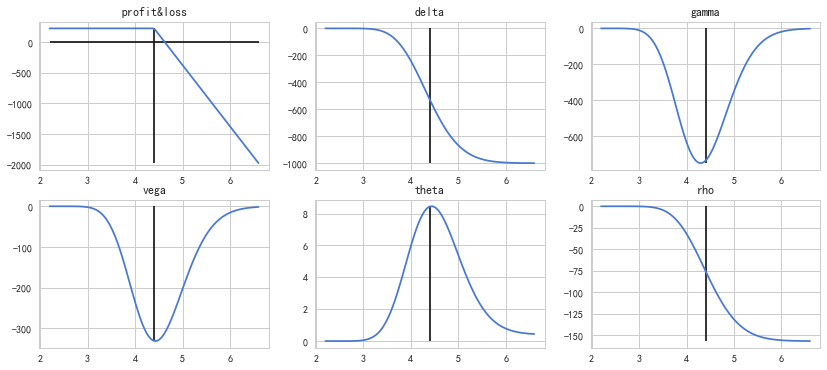

In [24]:
option_portfolio_calculator(portfolio)

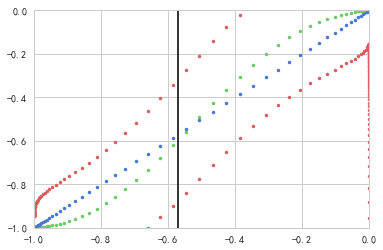

In [25]:
strike = 21.35
sigma = 0.32
r = R.xs(20181105)/100
t = 0.088
lameda = 0.02
alpha = 1
start = 20181105
end = 20181204

amount = -1

for i in np.linspace(strike * 1/10,strike * 19/10,200):
    delta = option_result(i,strike,0,r,start,end,volatility=sigma).delta()
    gamma = option_result(i,strike,0,r,start,end,volatility=sigma).gamma()
    S = i
    K = -4.76 * ((lameda**0.78)/(t**0.02)) * ((np.exp(-r*t)/sigma)**0.25) * ((alpha*(S**2)*np.abs(gamma))**0.15)
    H_0 = lameda/(alpha * S * (sigma**2) * t)
    H_1 = 1.12 * (lameda**0.31) * (t**0.05) * ((np.exp(-r*t)/sigma)**0.25) * ((np.abs(gamma)/alpha)**0.5)
    sigma_m = sigma * np.sqrt(1 + K)
    new_center = option_result(i,strike,0,r,start,end,volatility=sigma_m).delta() * amount
    plt.plot(delta * amount, new_center,'g.')
    plt.plot(delta * amount, new_center+(H_0+H_1)*amount,'r.')
    plt.plot(delta * amount, new_center-(H_0+H_1)*amount,'r.')
    plt.plot(delta * amount, delta * amount,'b.')
if amount<0:
    plt.vlines(option_result(strike*1.01,strike,0,r,start,end,volatility=sigma).delta() * amount,-1*np.abs(amount),0)
    plt.ylim(-1*np.abs(amount),0)
    plt.xlim(-1*np.abs(amount),0)
else:
    plt.vlines(option_result(strike*1.01,strike,0,r,start,end,volatility=sigma).delta() * amount,0,1*np.abs(amount),)
    plt.ylim(0,1*np.abs(amount))
    plt.xlim(0,1*np.abs(amount))
plt.show()

In [26]:
pd.set_option('display.max_rows', None)

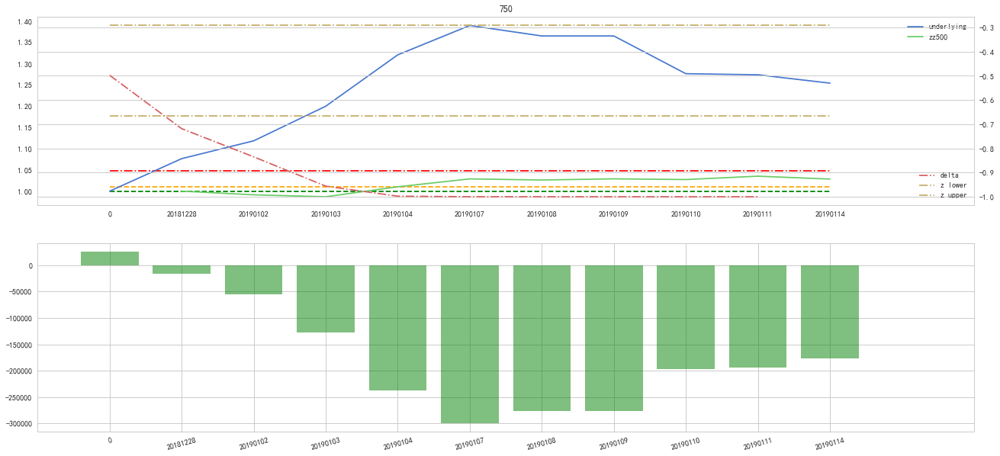

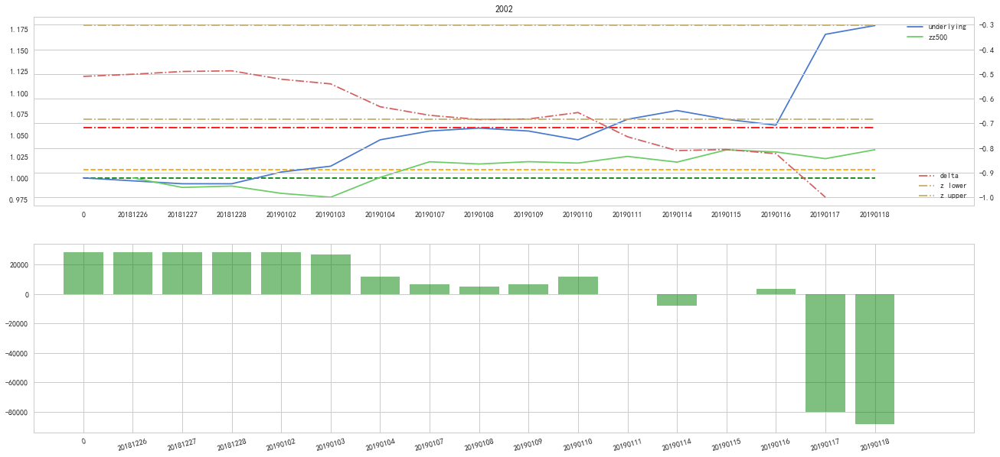

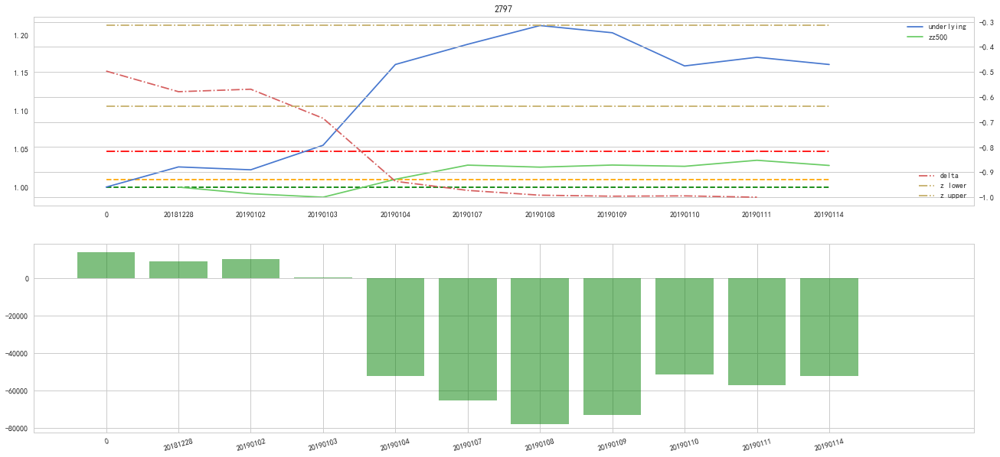

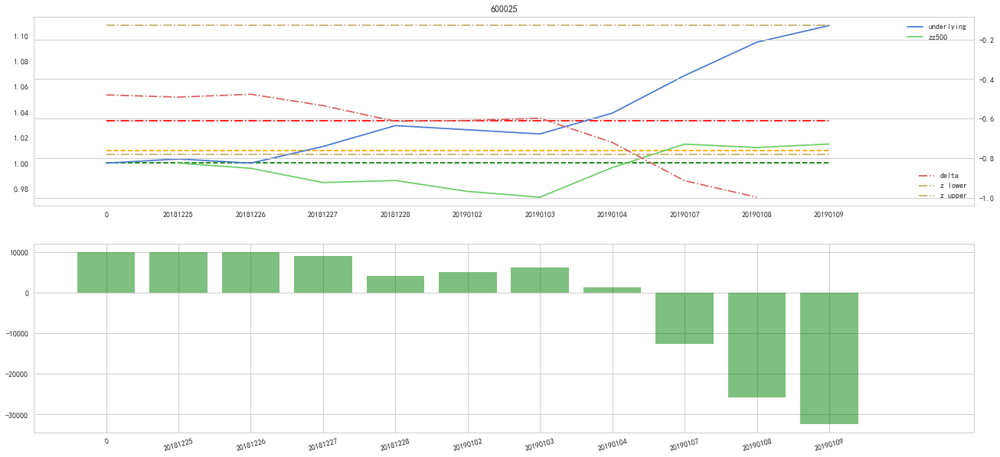

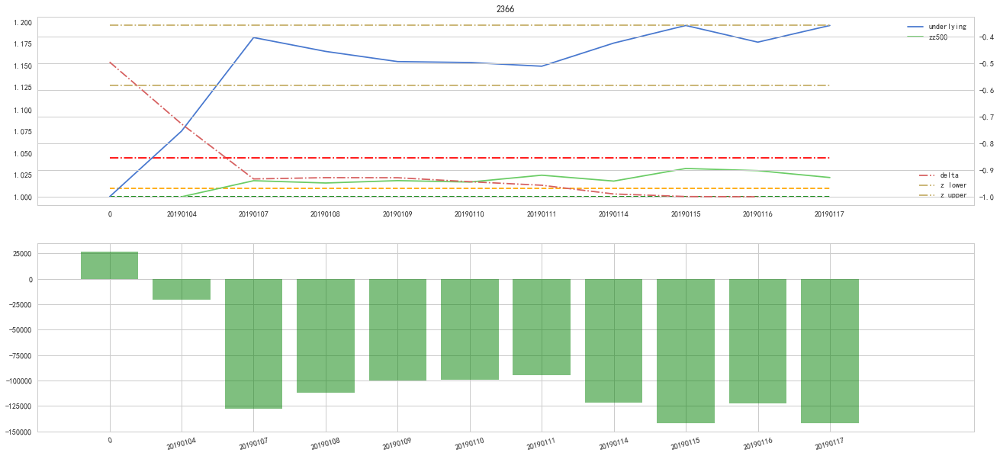

...

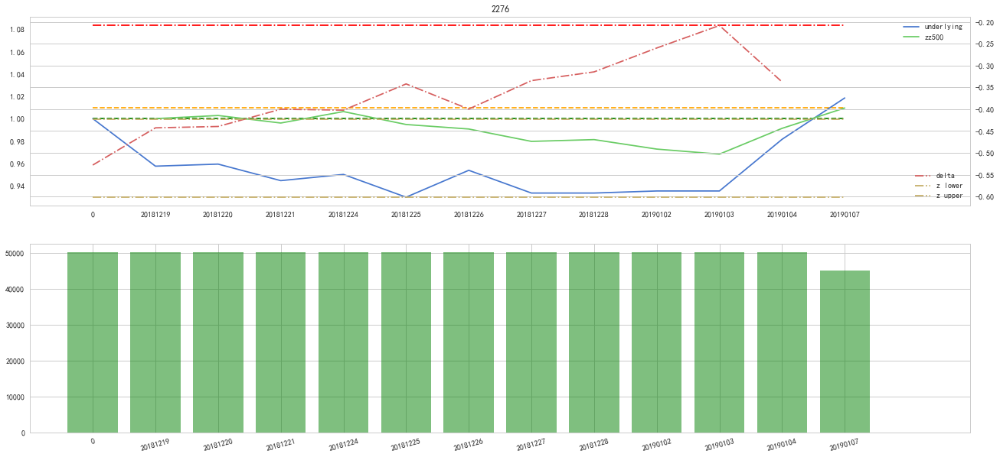

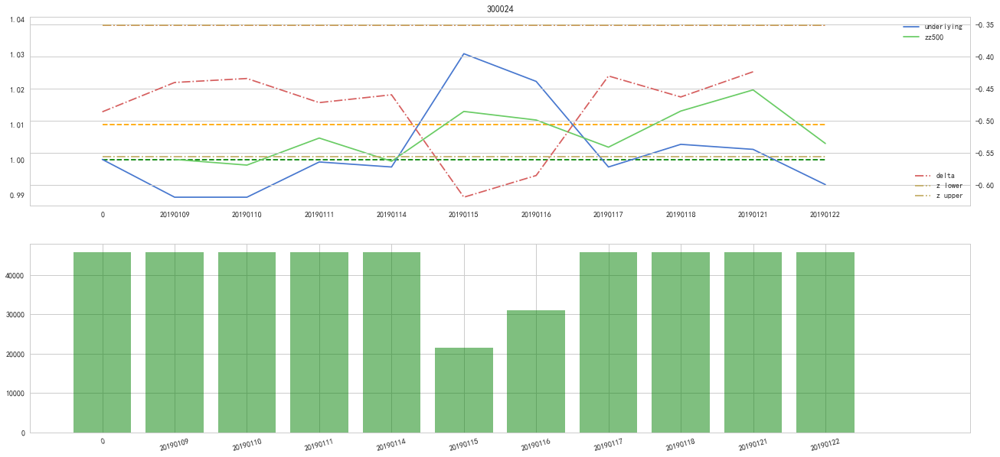

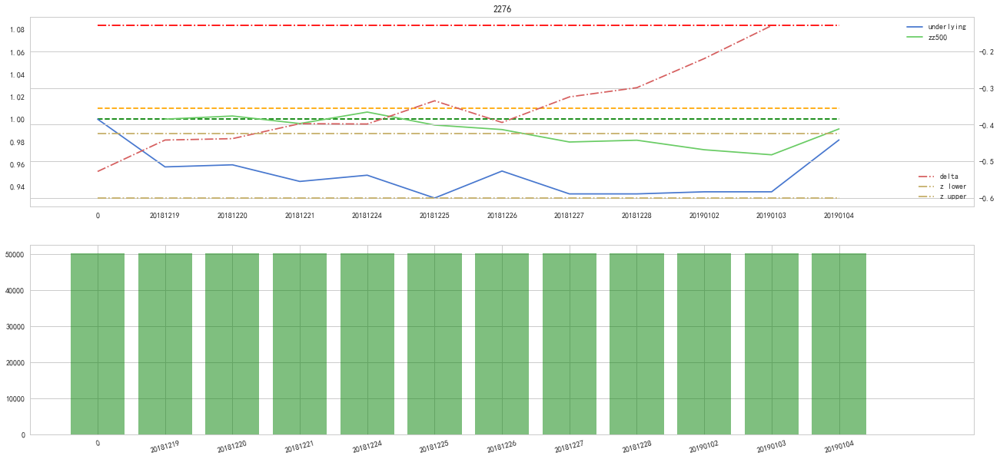

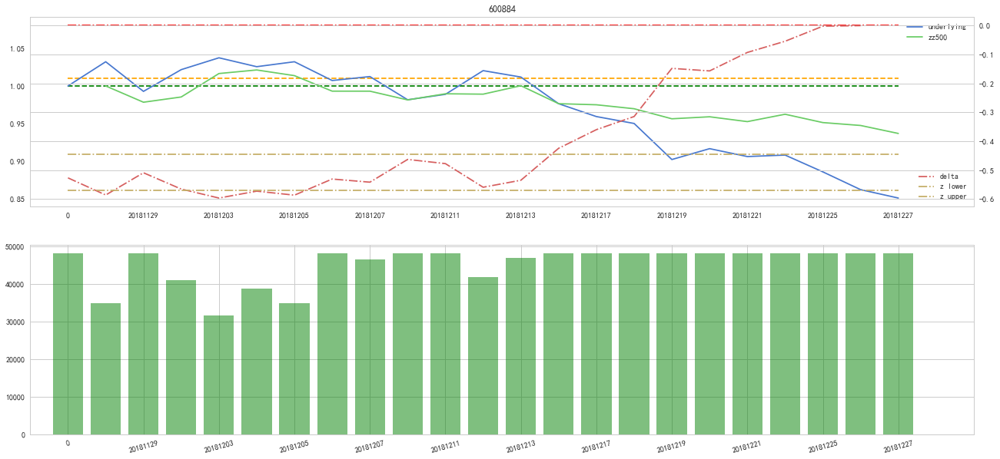

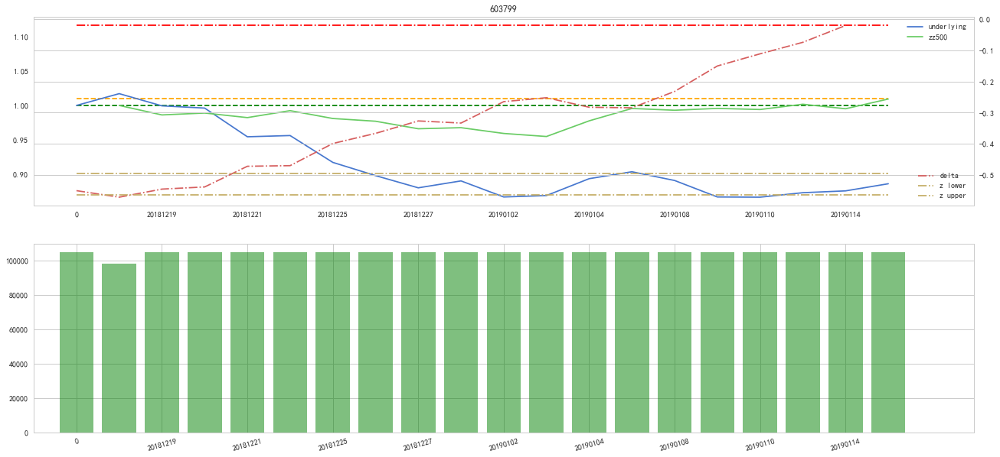

In [37]:
for i in expired.index:
    stock = expired.xs(i).xs('股票代码'); start = int(expired.xs(i).xs('收款日期')); end = max(int(expired.xs(i).xs('出金日期')),int(get_n_week_date_after(str(start),9)));
    option_fee = expired.xs(i).xs('南华虚值')/(expired.xs(i).xs('保证金')/0.15); capital = expired.xs(i).xs('保证金')/0.15;

    S_0 = full_nonright.xs((stock,start)).xs(5)
    try:
        S_1 = full_nonright.xs((stock,end)).xs(8)
        K = S_0 * (1.01)
    except:
        continue
        
    r = R.xs(start)/100
    lameda = 0.02
    if 0<S_0<=15:
        alpha = 5
    elif 15<S_0<=30:
        alpha = 4
    elif 30<S_0<=45:
        alpha = 3
    elif 45<S_0<=60:
        alpha = 2
    elif 60<S_0:
        alpha = 1
        
    sub_price_info = full_nonright.xs(stock,level=0)
    sub_price_info = sub_price_info[(sub_price_info.index>=start) & (sub_price_info.index<end)][8]
    sub_zz_info = zzIcData[(zzIcData.index>=start) & (zzIcData.index<=end)][5]
    sub_zz_info.loc[0] = np.nan
    sub_zz_info.sort_index(inplace=True)
    sub_price_info.loc[0] = S_0
    sub_price_info.loc[end] = S_1
    sub_price_info.sort_index(inplace=True)

    delta_list = []
    n_stock_hold = 0
    for holding_date in sub_price_info.index:
        if holding_date == 0:
            current_delta = option_result(S_0, K, 0, r, int(get_n_week_date_before(str(start))), end, \
                                          origin_price_info = (option_fee*S_0, S_0,int(get_n_week_date_before(str(start))))).delta() * -1
            current_gamma = option_result(S_0, K, 0, r, int(get_n_week_date_before(str(start))), end, \
                                          origin_price_info = (option_fee*S_0, S_0,int(get_n_week_date_before(str(start))))).gamma() * -1
            sigma = implied_volatility(S_0, K, option_fee*S_0, 0, r, int(get_n_week_date_before(str(start))), end)
            t = how_many_week_date_between(get_n_week_date_before(str(start)),str(end))/annualize_factor

            L = -4.76 * ((lameda**0.78)/(t**0.02)) * ((np.exp(-r*t)/sigma)**0.25) * ((alpha*(S_0**2)*np.abs(current_gamma))**0.15)
            H_0 = lameda/(alpha * S_0 * (sigma**2) * t)
            H_1 = 1.12 * (lameda**0.31) * (t**0.05) * ((np.exp(-r*t)/sigma)**0.25) * ((np.abs(current_gamma)/alpha)**0.5)
            sigma_m = sigma * np.sqrt(1 + L)
            new_center = option_result(S_0, K, 0, r, int(get_n_week_date_before(str(start))), end, volatility=sigma_m).delta() * -1
            z_band_lower_list = pd.Series([new_center - H_0 - H_1] * len(sub_price_info), index = sub_price_info.index)
            z_band_upper_list = pd.Series([new_center + H_0 + H_1] * len(sub_price_info), index = sub_price_info.index)

            delta_list.append(current_delta)
        elif holding_date == end:
            delta_list.append(np.nan)
        else:
            current_delta = (option_result(sub_price_info.xs(holding_date), K, 0, r, holding_date, end, \
                                           origin_price_info = (option_fee*S_0, S_0, int(get_n_week_date_before(str(start))))).delta() * -1)
            
            delta_list.append(current_delta)
    delta_list = pd.Series(delta_list, index = sub_price_info.index)

    quanlijin = option_fee * capital
    fankuan = ((sub_price_info - K)/S_0).round(5) * capital
    fankuan[fankuan<0] = 0
    lirun = quanlijin - fankuan
    lirun[lirun>0] *= 0.6

    n = len(sub_price_info)
    divide_factor = max(n//10,1)
    X = np.arange(n)
    Xlabel = [index for index,value in enumerate(sub_price_info.index) if index%divide_factor == 0]
    fig = plt.figure(figsize = (22,10))
    ax1 = fig.add_subplot(211)
    ax1.plot((sub_price_info/S_0).tolist(),label = 'underlying')
    ax1.plot((sub_zz_info/sub_zz_info.iloc[1]).tolist(),label = 'zz500')
    ax1.grid(False)
    plt.legend(loc=0)
    ax1_ = ax1.twinx()
    ax1_.plot(delta_list.tolist(),'r-.',label = 'delta')
    ax1_.plot(z_band_lower_list.tolist(),'y-.',label = 'z lower')
    ax1_.plot(z_band_upper_list.tolist(),'y-.',label = 'z upper')
    plt.legend(loc=4)
    ax1.hlines((1 + option_fee),0,n-1,linestyles='-.',color = 'red')
    ax1.hlines(1.01,0,n-1, linestyles='--',color = 'orange')
    ax1.hlines(1,0,n-1, linestyles='--',color = 'green')
    ax1.set_xlim(-1,n+1)
    ax1.set_xticks(Xlabel)
    ax1.set_xticklabels([value for index,value in enumerate(sub_price_info.index) if index%divide_factor == 0])
    plt.setp(plt.gca().get_xticklabels(),rotation=15)
    plt.title(stock)
    ax2 = fig.add_subplot(212)
    ax2.bar(range(len(lirun)),lirun.tolist(),color = 'green', alpha = .5)
    ax2.set_xlim(-1,n+1)
    ax2.set_xticks(Xlabel)
    ax2.set_xticklabels([value for index,value in enumerate(sub_price_info.index) if index%divide_factor == 0])
    plt.setp(plt.gca().get_xticklabels(),rotation=15)
    plt.show()

In [24]:
expired = pd.read_excel('1_已到期账户0128.xlsx')
expired['完成净利润'] = [i if i <=0 else 0.6 * i for i in expired['净利润']]
expired['持有时间'] = [1+how_many_week_date_between(str(expired.xs(i).xs('收款日期')), str(expired.xs(i).xs('出金日期'))) for i in expired.index]

In [27]:
high = pd.read_csv('high.csv', index_col = 0)
high.columns = [int(i) for i in high.columns]
low = pd.read_csv('low.csv', index_col = 0)
low.columns = [int(i) for i in low.columns]
mkt_cap_ard = pd.read_csv('mkt_cap_ard.csv', index_col = 0)
mkt_cap_ard.columns = [int(i) for i in mkt_cap_ard.columns]
amt = pd.read_csv('amt.csv', index_col = 0)
amt.columns = [int(i) for i in amt.columns]

In [28]:
rolling_amt =amt.rolling(window=5).mean()

In [26]:
expired.sort_values('完成净利润',inplace = True)

In [38]:
expired

,股票名称,股票代码,收款日期,收款账户,收款金额,付款日期,付款账户,付款金额,南华虚值,出金日期,兑付金额,净利润,保证金,合计款,完成净利润,持有时间
89,国海证券,750,20181228,宏运,48960,20181228,宏运,48060,43110,20190104,203076,-159966,135000,-24966,-159966.0,4
79,鸿达兴业,2002,20181226,宏运,52560,20181226,宏运,51760,47360,20190118,132688,-85328,120000,34672,-85328.0,16
88,第一创业,2797,20181228,宏运,26600,20181228,宏运,26100,23350,20190108,84045,-60695,75000,14305,-60695.0,6
73,华能水电,600025,20181225,宏运,19900,20181225,宏运,19400,16650,20190109,50985,-34335,75000,40665,-34335.0,10
97,台海核电,2366,20190104,宏运,51000,20190104,宏运,50000,44500,20190114,74680,-30180,150000,119820,-30180.0,7
70,老凤祥,600612,20181224,宏运,25450,20181224,宏运,24950,22100,20190108,38530,-16430,75000,58570,-16430.0,10
93,伟星新材,2372,20190102,宏运,21300,20190102,宏运,20800,18050,20190115,33030,-14980,75000,60020,-14980.0,10
92,伟星新材,2372,20190102,宏运,21300,20190102,宏运,20800,18050,20190115,33030,-14980,75000,60020,-14980.0,10
91,伟星新材,2372,20190102,宏运,21300,20190102,宏运,20800,18050,20190115,33030,-14980,75000,60020,-14980.0,10
41,罗牛山,735,20181219,宏运,28100,20181219,宏运,27600,24750,20190103,35490,-10740,75000,64260,-10740.0,10


750
20181228 high 4.34 4.44
20190103 high 4.79 4.98


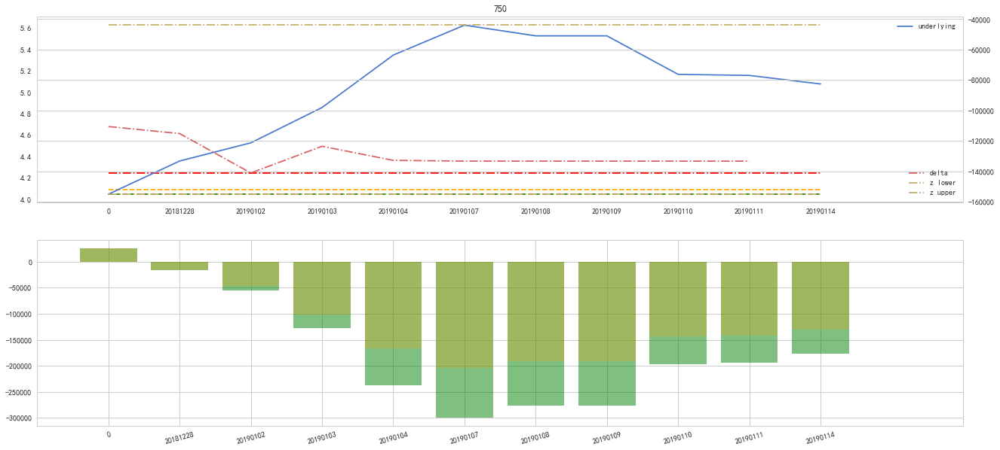

2002


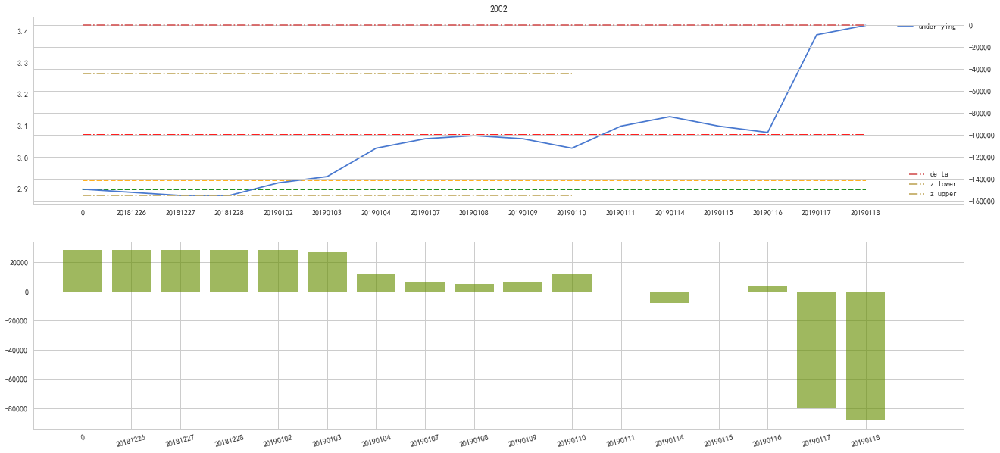

2797
20190103 high 5.65 5.76
20190107 high 6.21 6.5


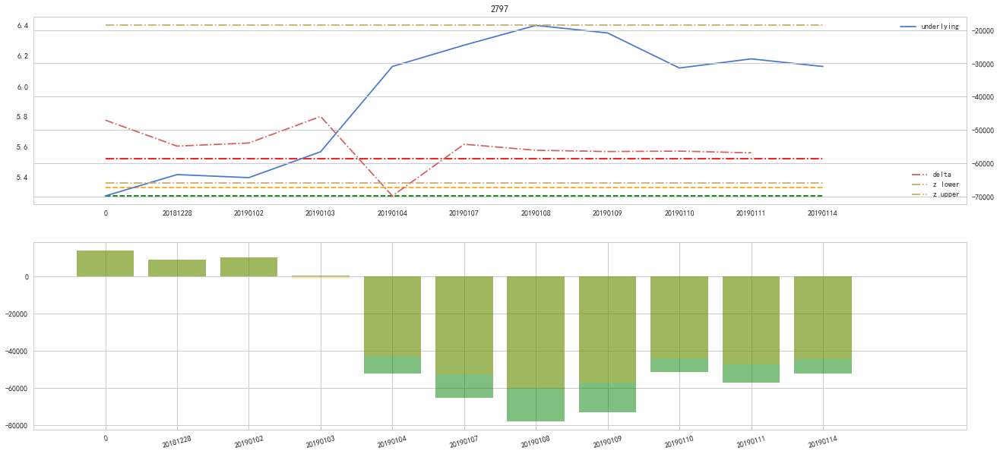

600025
20190107 high 3.21 3.28


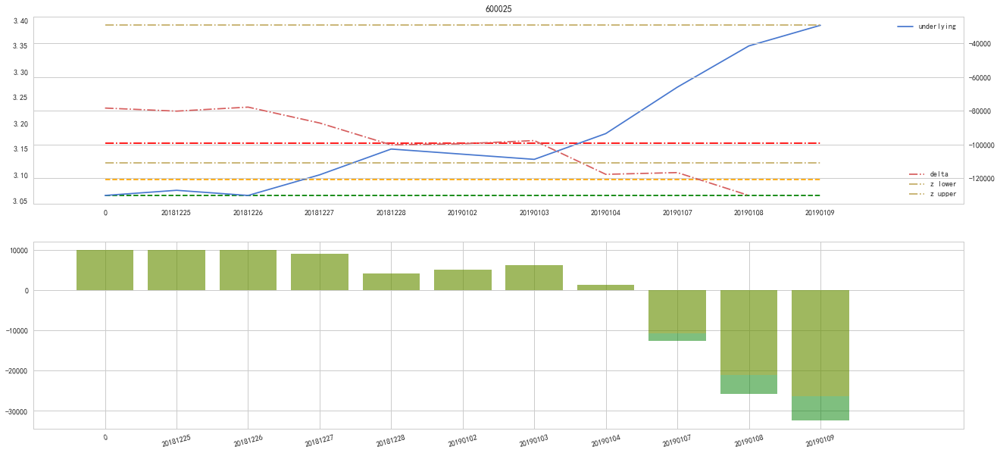

2366


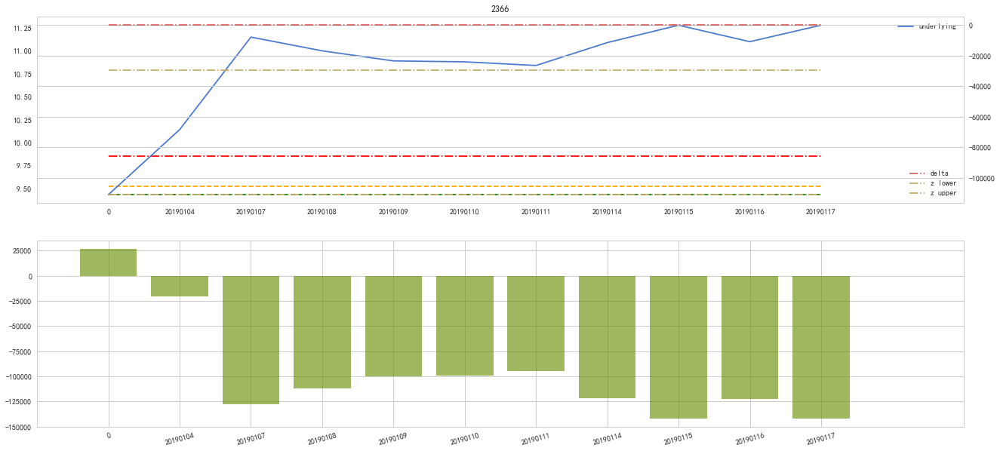

600612
20181226 high 43.5 44.18


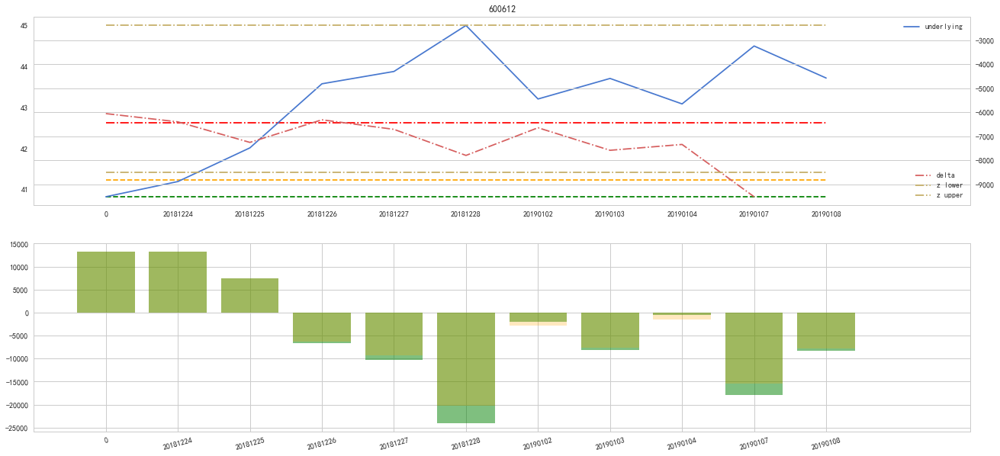

2372
20190103 low 14.26 14.23
20190104 low 14.26 13.51


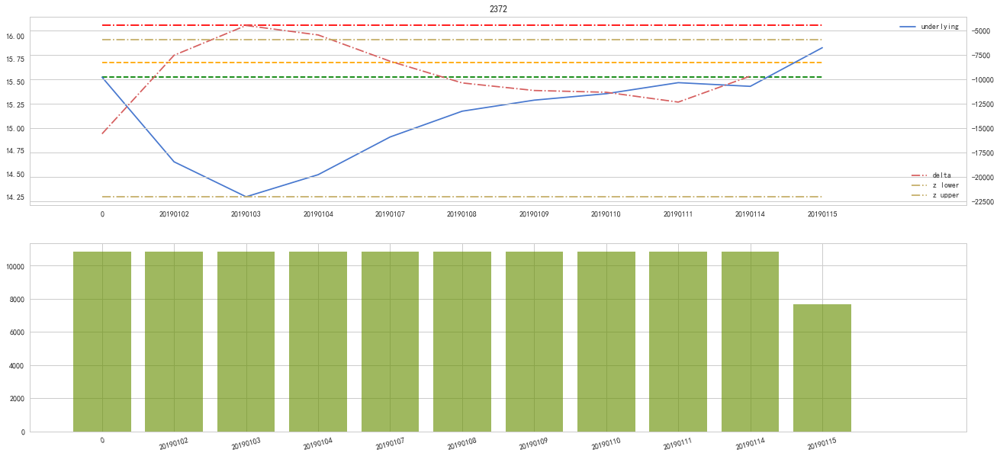

2372
20190103 low 14.26 14.23
20190104 low 14.26 13.51


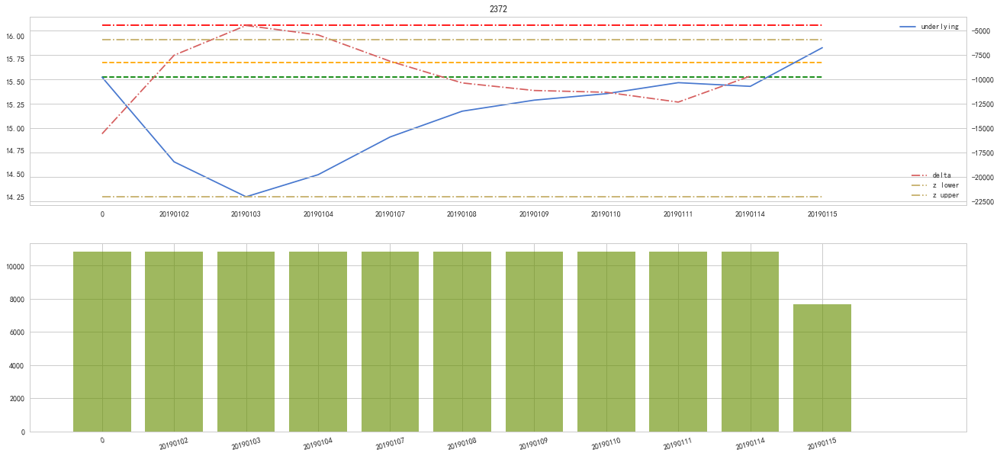

2372
20190103 low 14.26 14.23
20190104 low 14.26 13.51


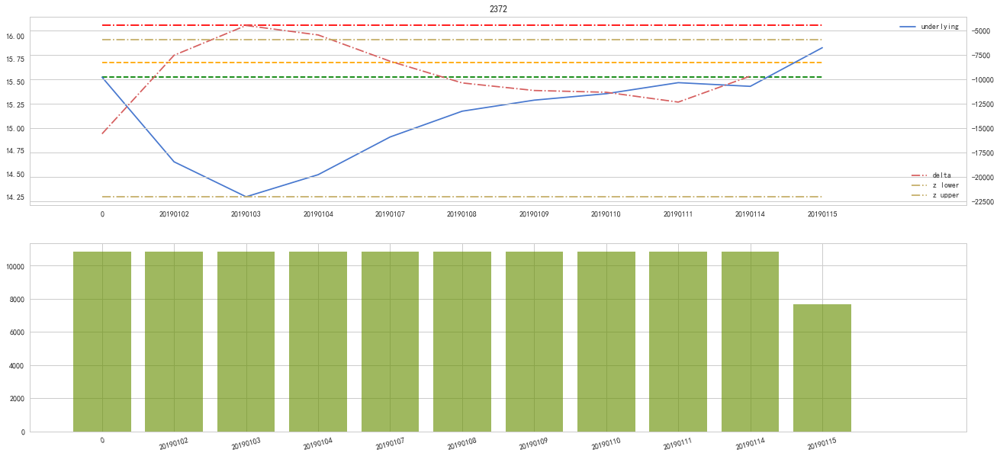

735
20190102 high 10.19 10.59


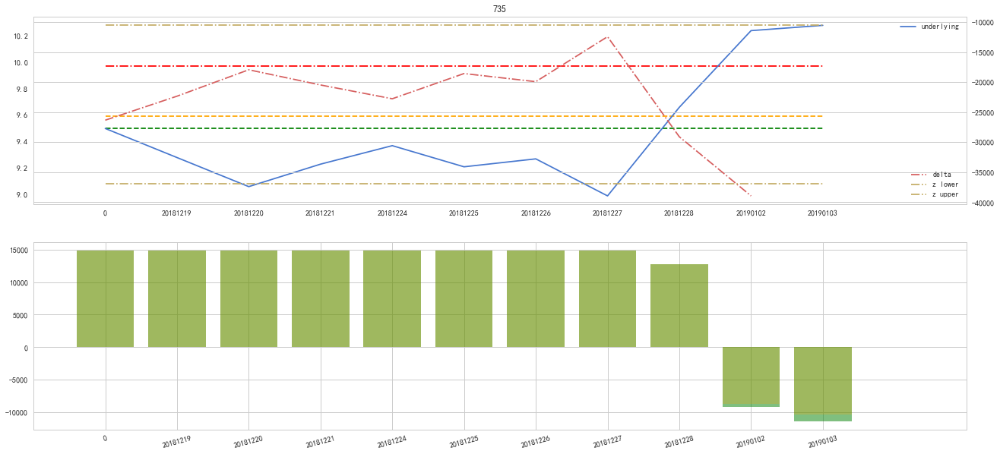

600547
20181221 high 30.21 30.48


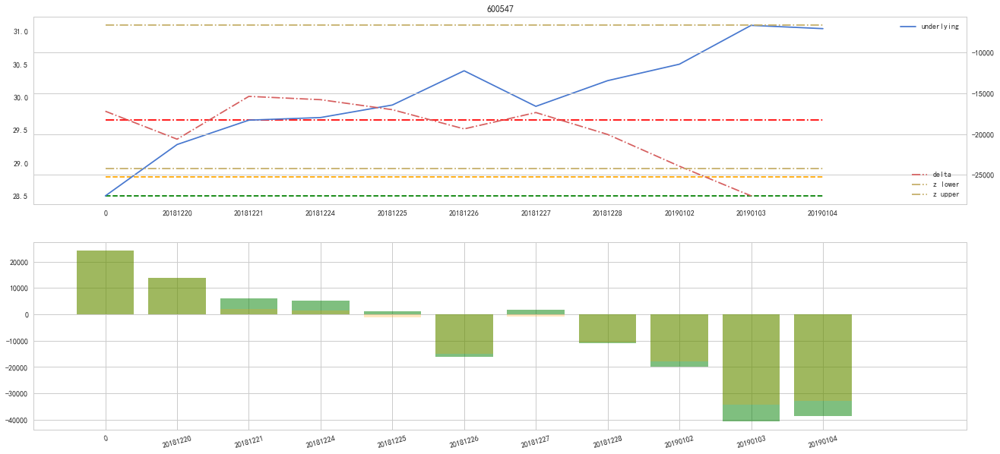

600270
20181123 high 22.38 22.5


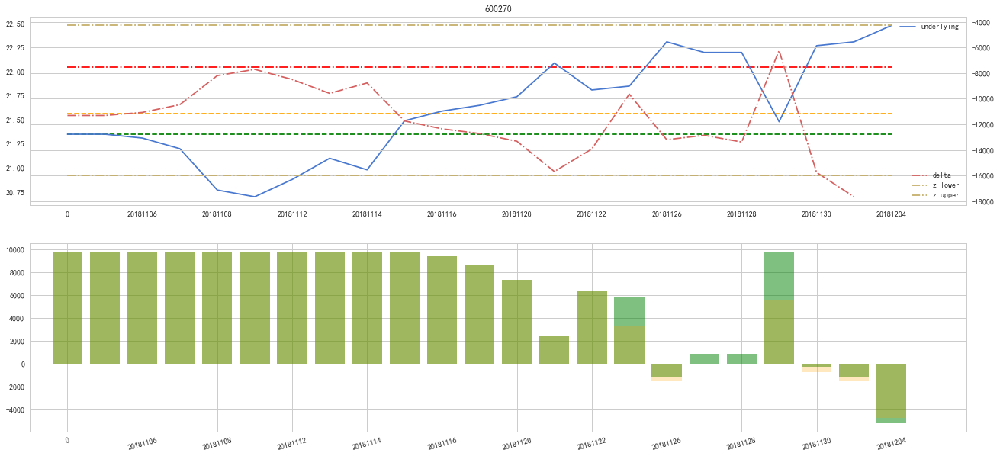

2032


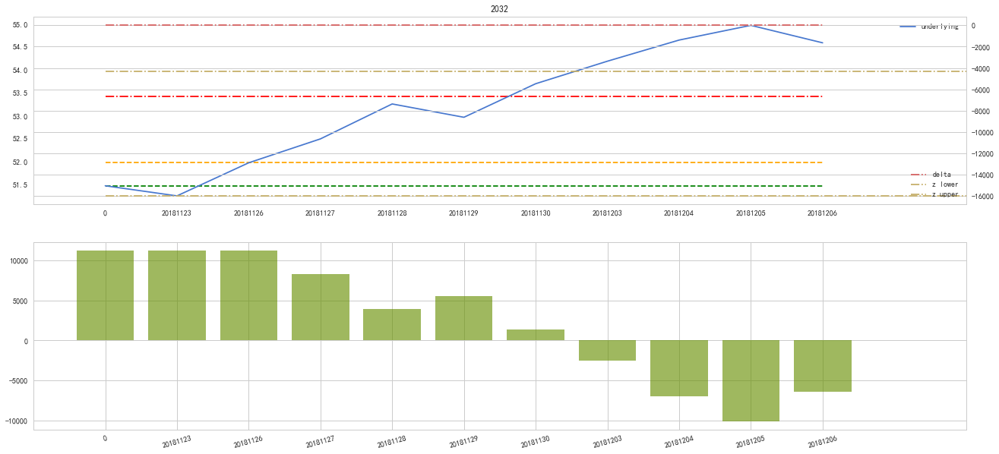

2368


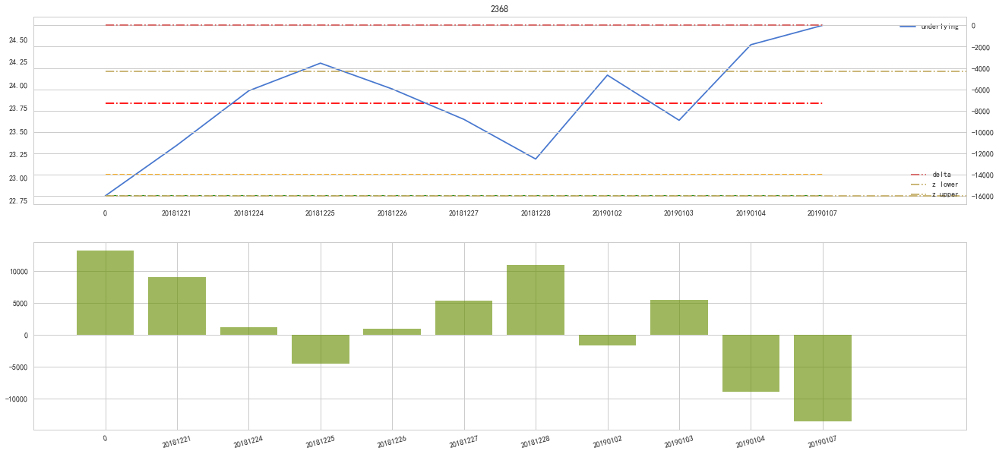

600635
20190109 high 4.98 5.06


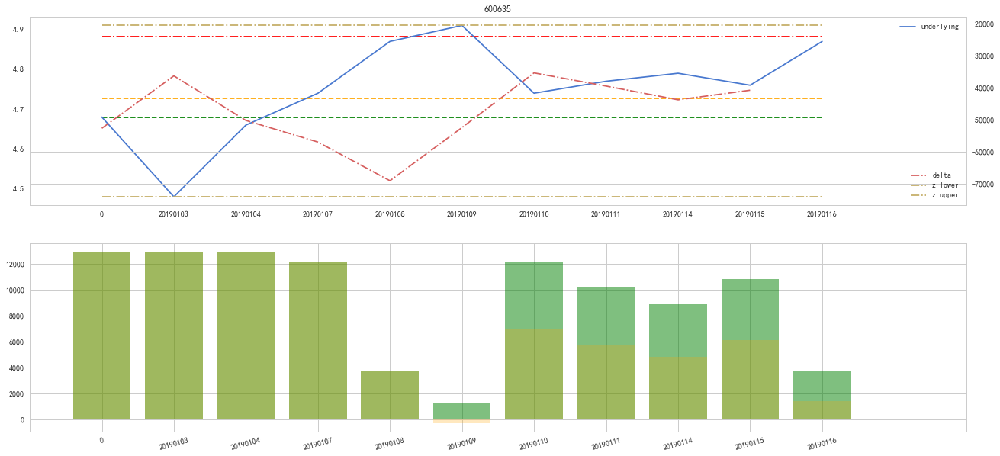

600487
20190110 high 18.78 19.3


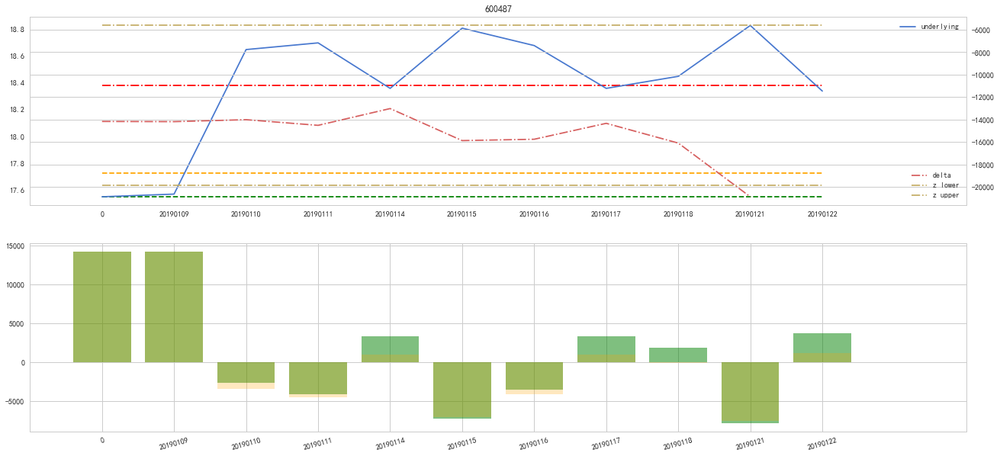

2023


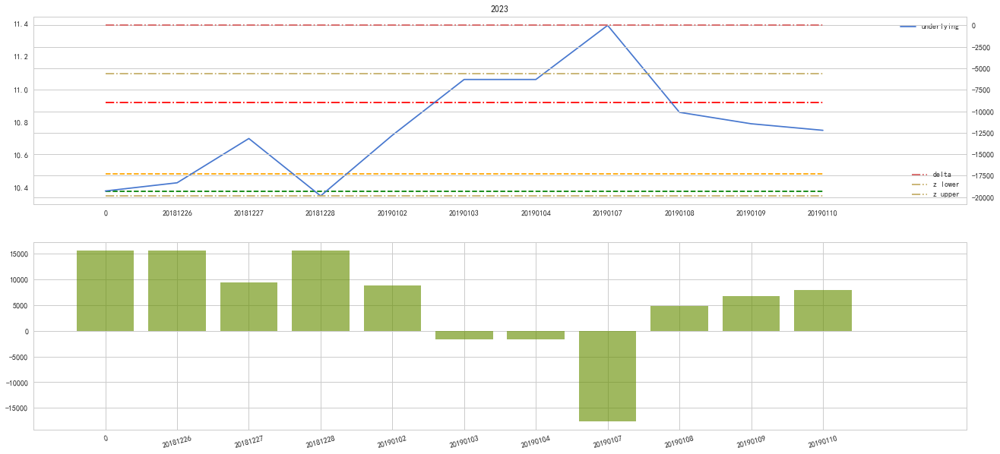

601238


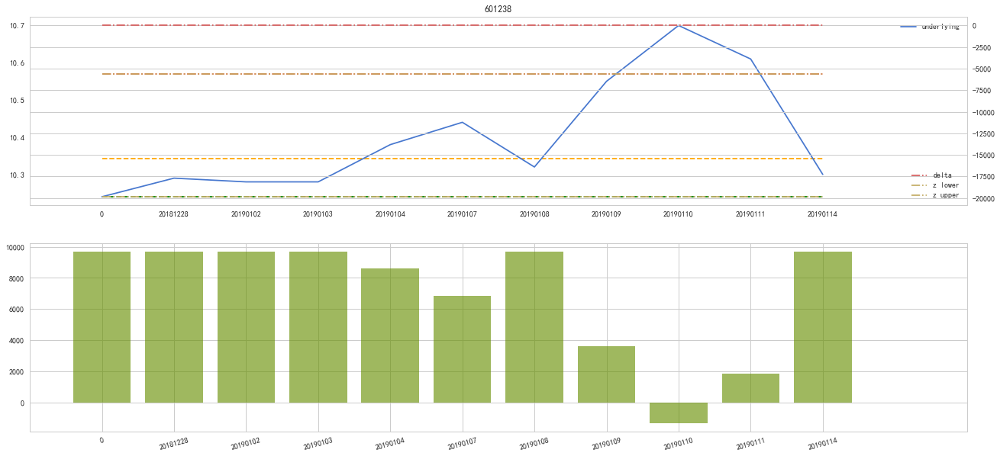

600900


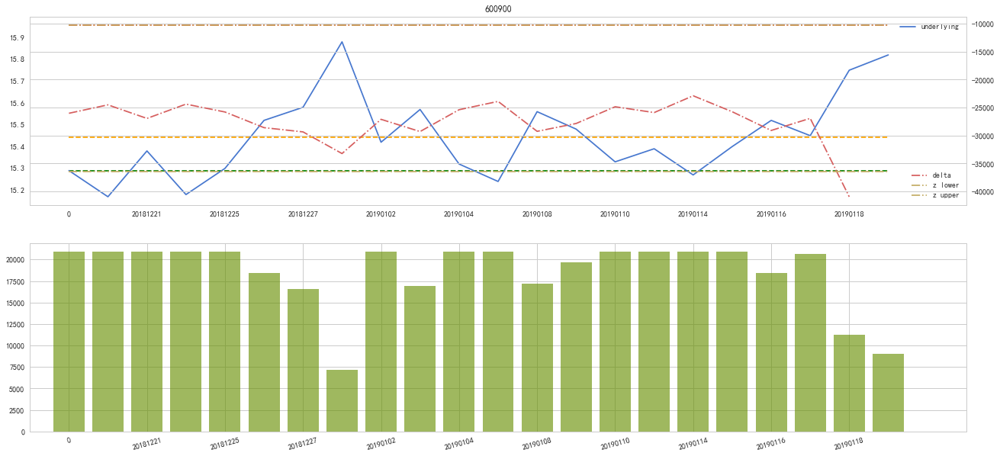

601985


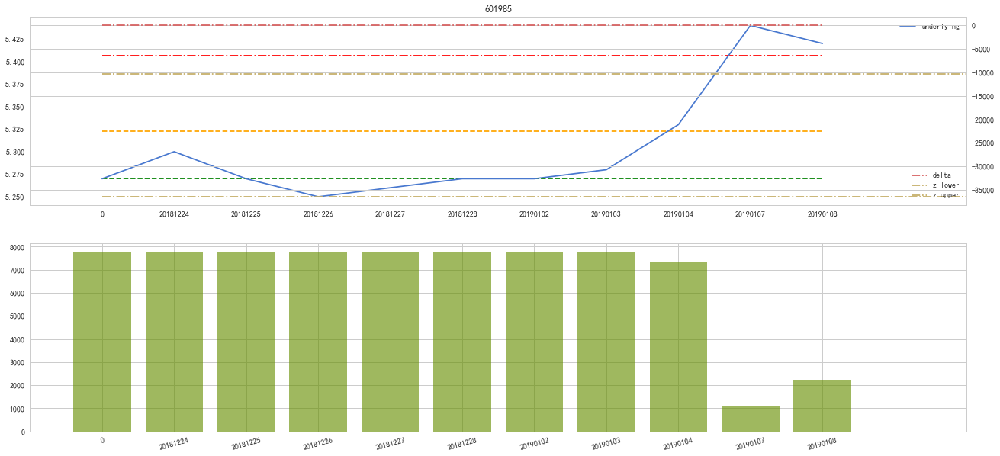

2508
20190121 high 24.33 24.6


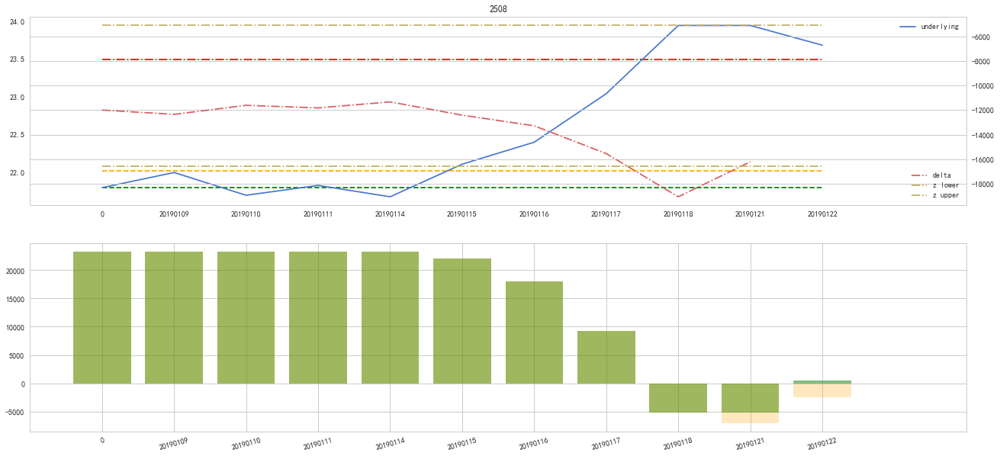

600547
20190104 high 31.93 32.0


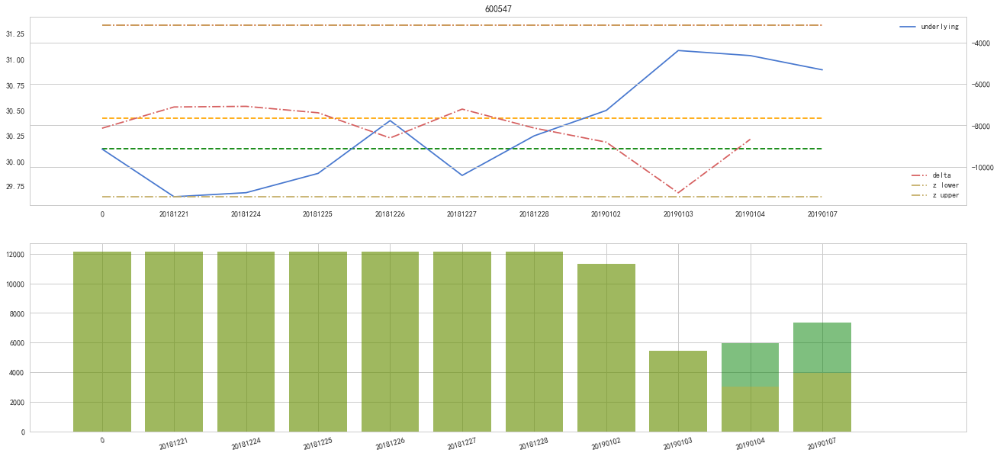

300101


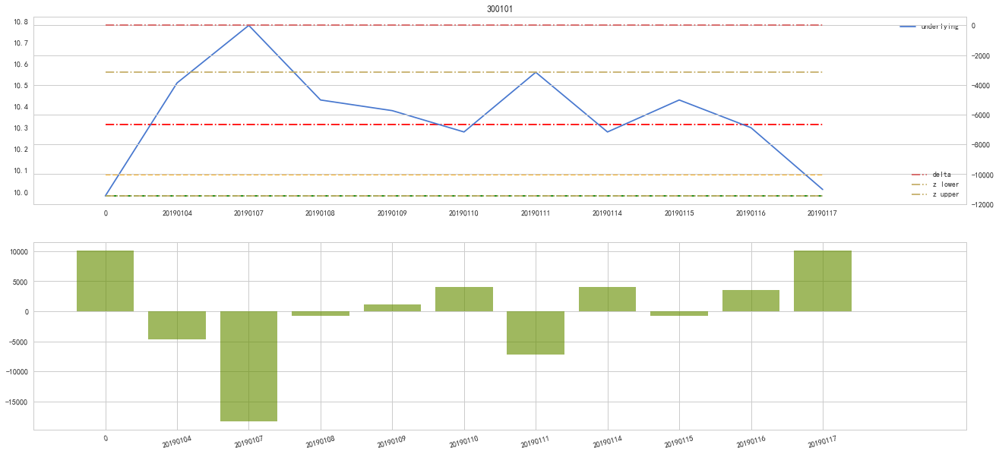

600717
20190118 high 7.8 8.08


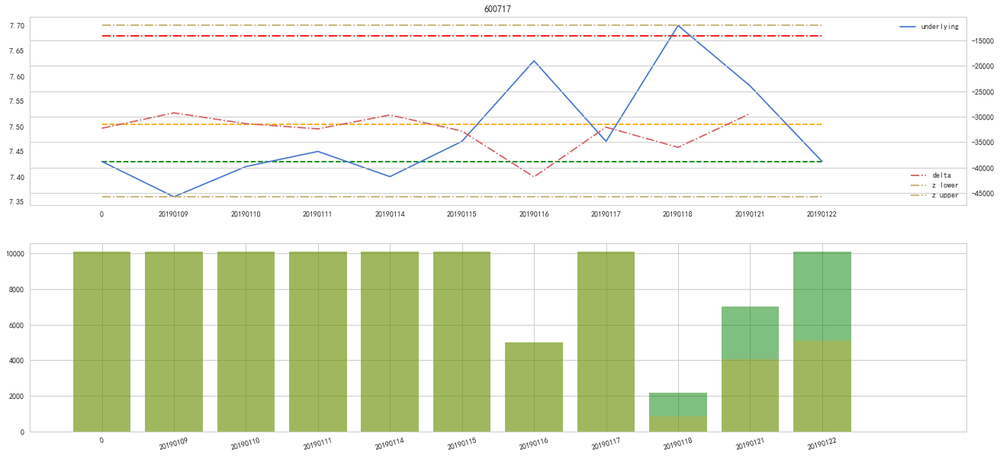

600025


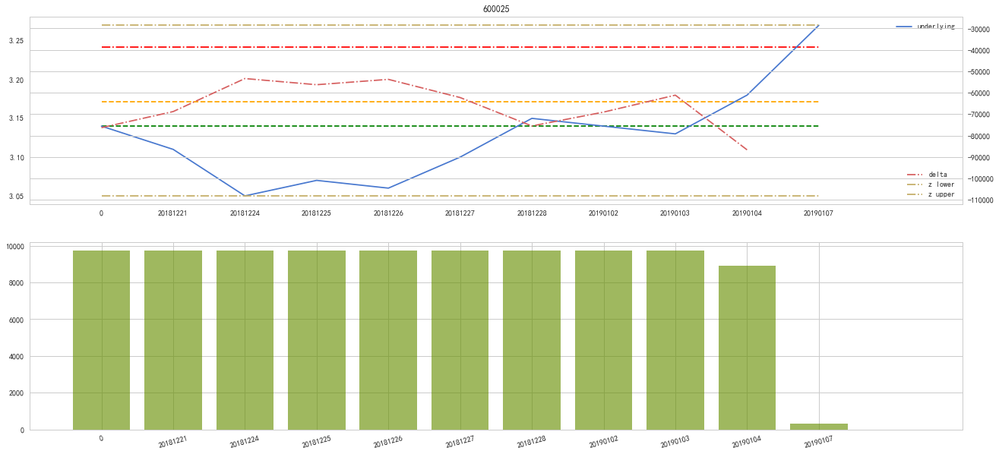

600016


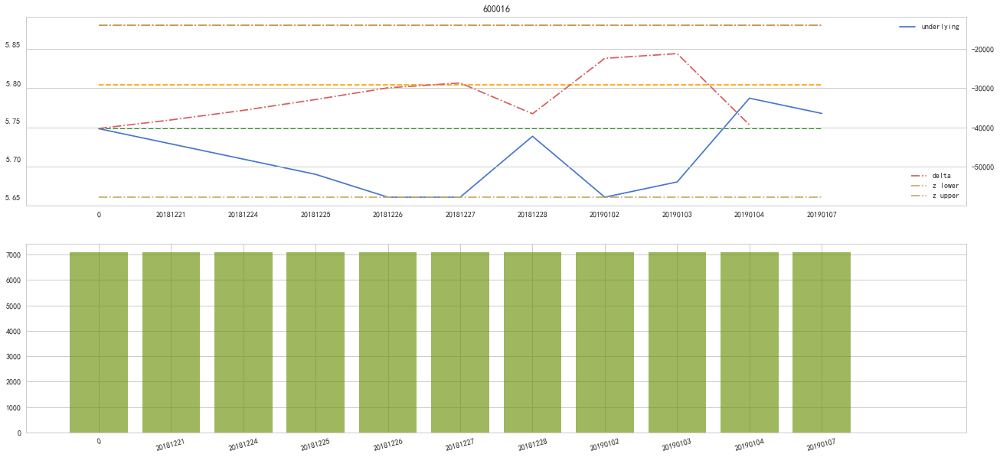

600900


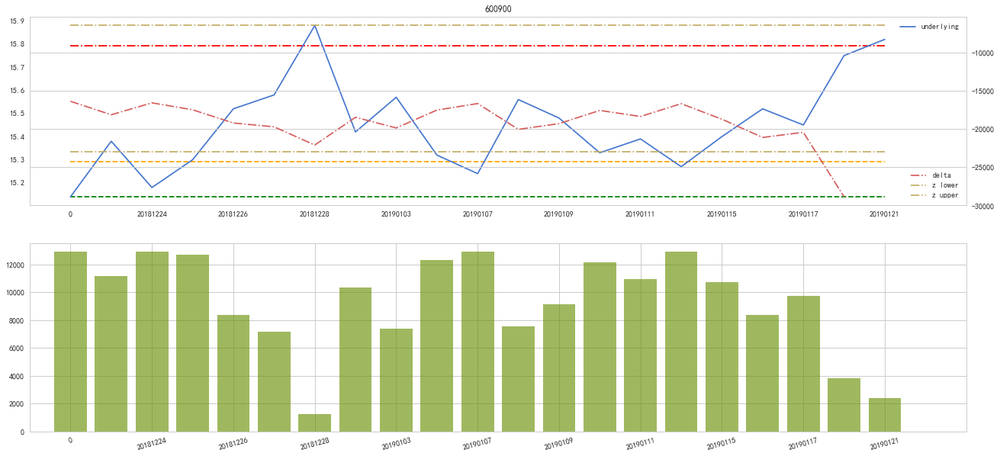

600717
20190118 high 7.8 8.08


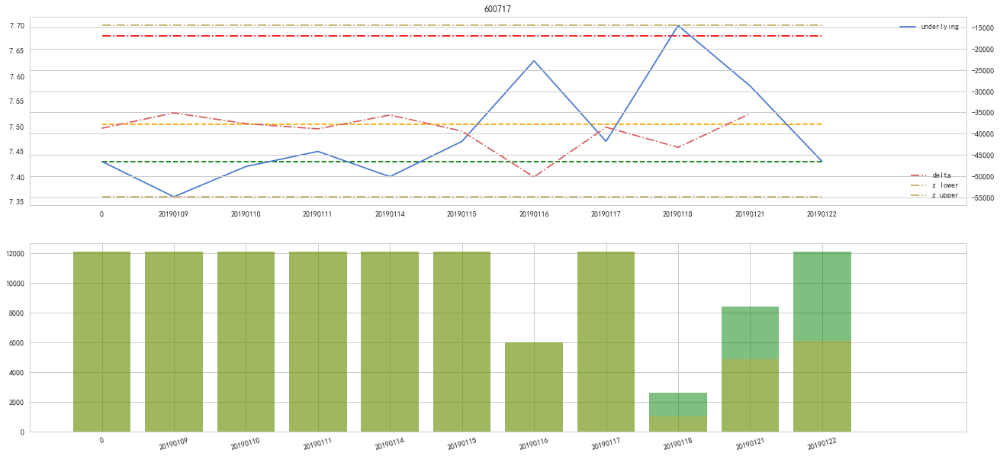

600717
20190118 high 7.8 8.08


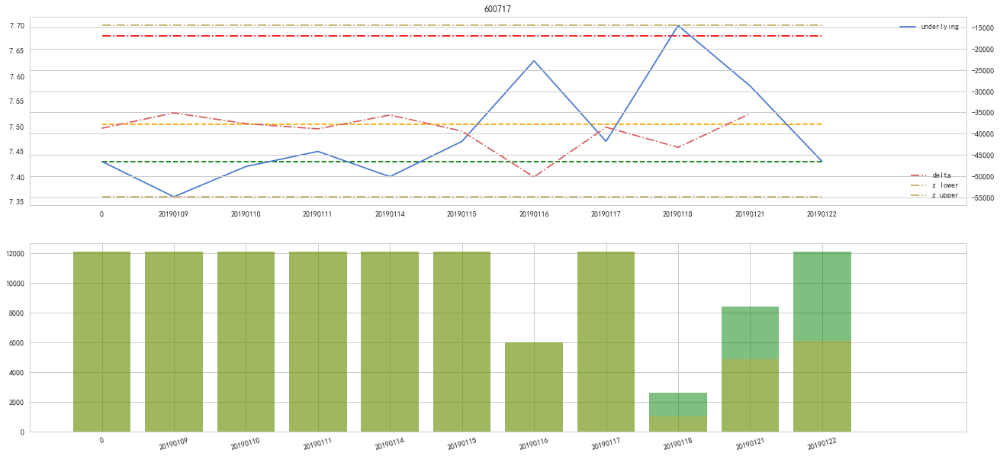

600016


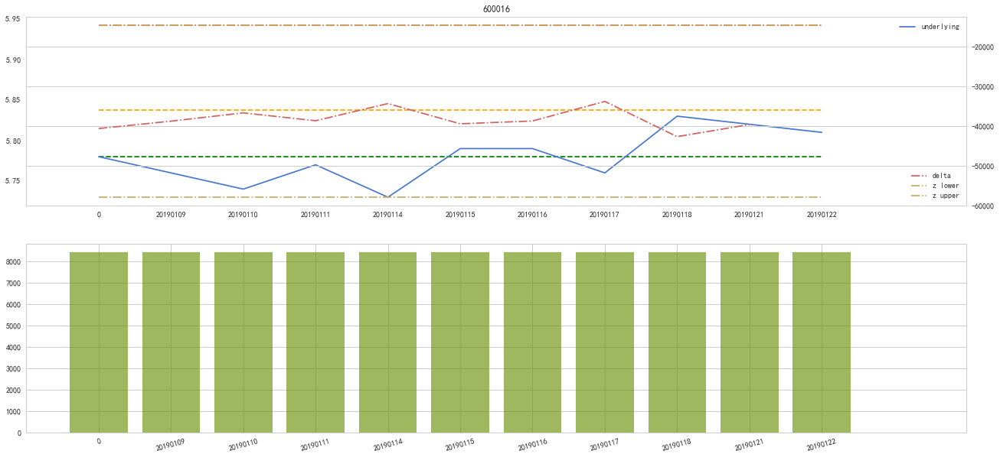

2155


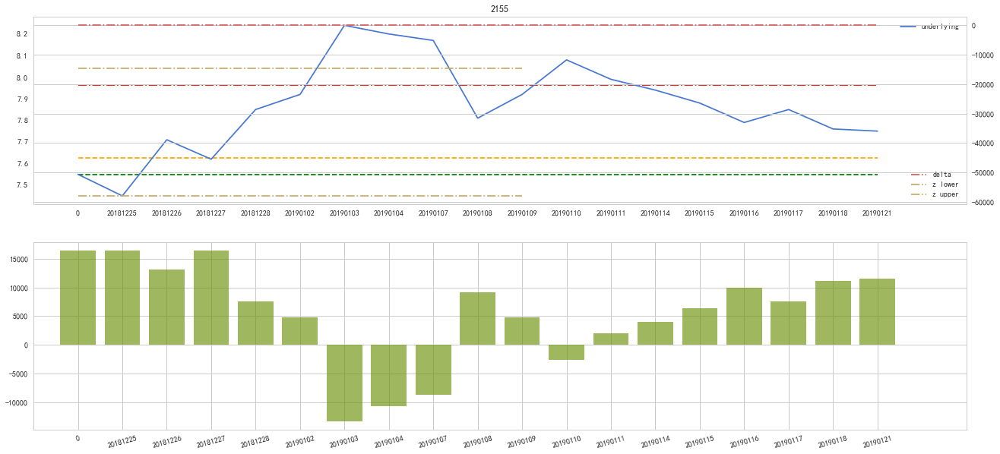

600377


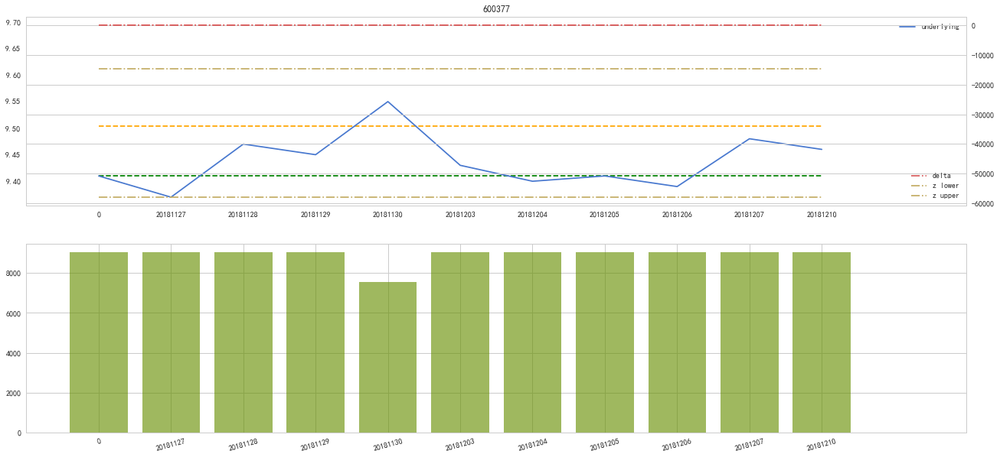

601158


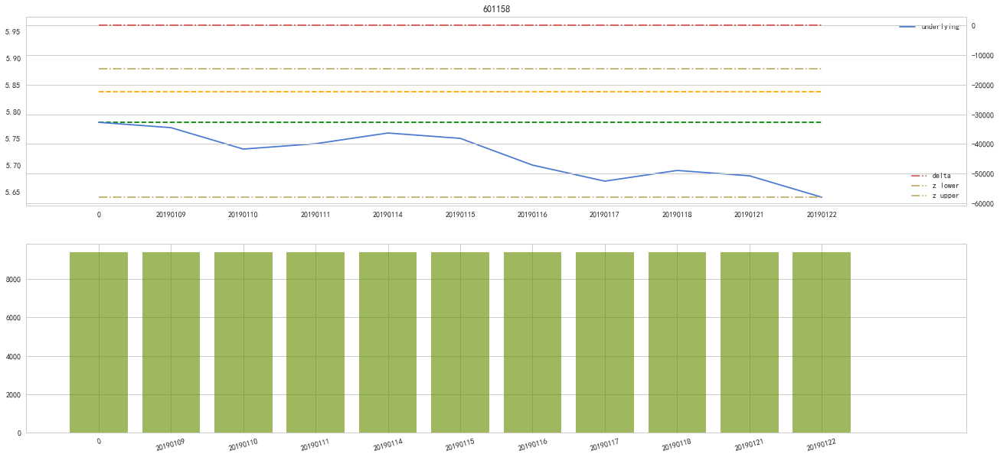

667


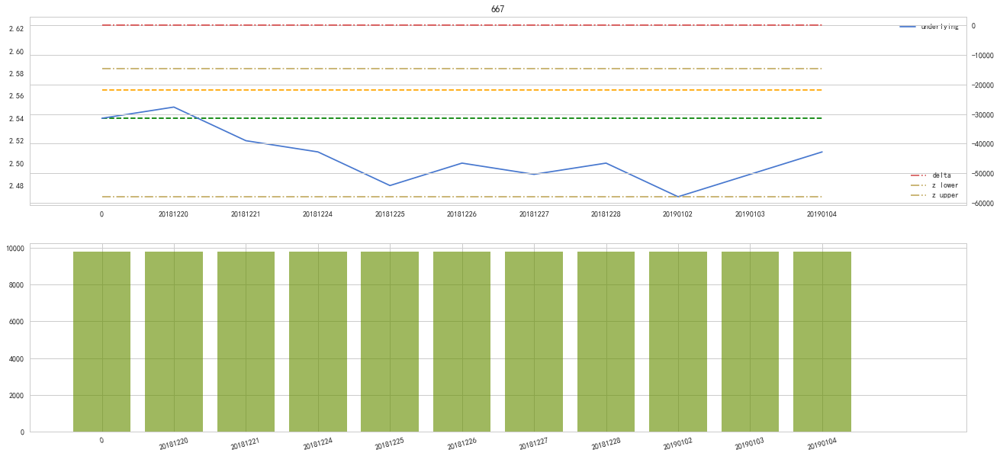

601166


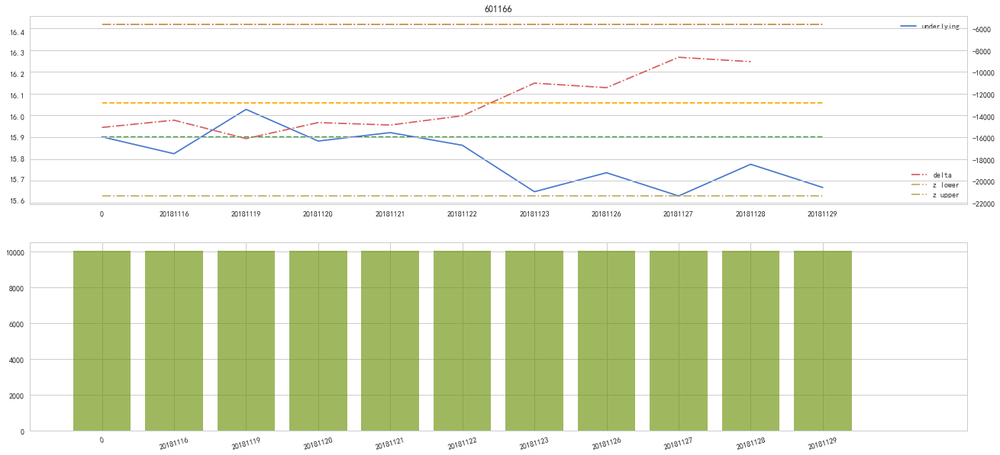

2701


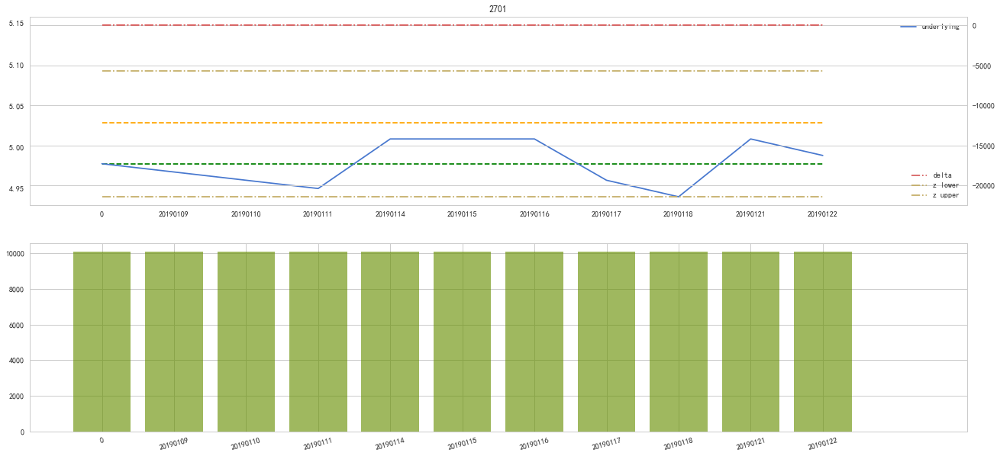

300134


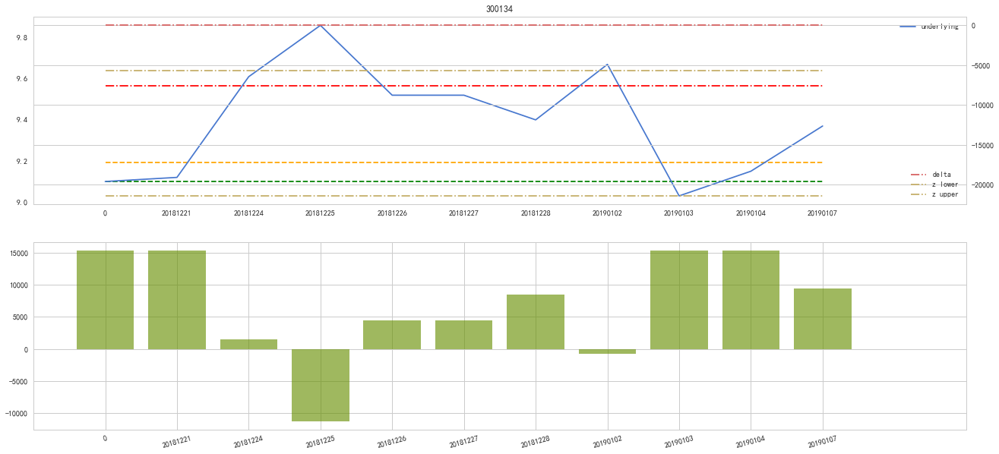

300144
20190102 low 19.63 19.31
20190103 low 19.63 18.72
20190104 low 19.63 18.58
20190107 low 19.63 18.73
20190108 low 19.63 18.78
20190109 low 19.63 19.02
20190110 low 19.63 19.13
20190111 low 19.63 19.39
20190114 low 19.63 18.74


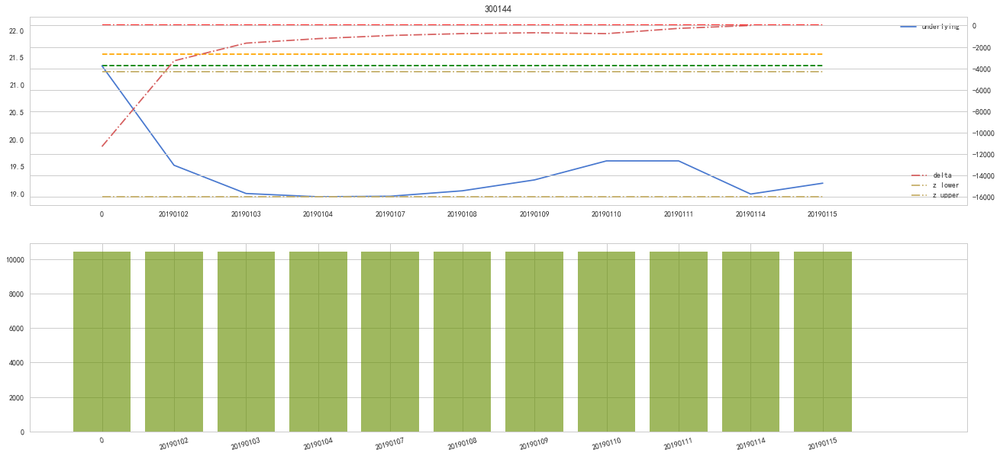

601985


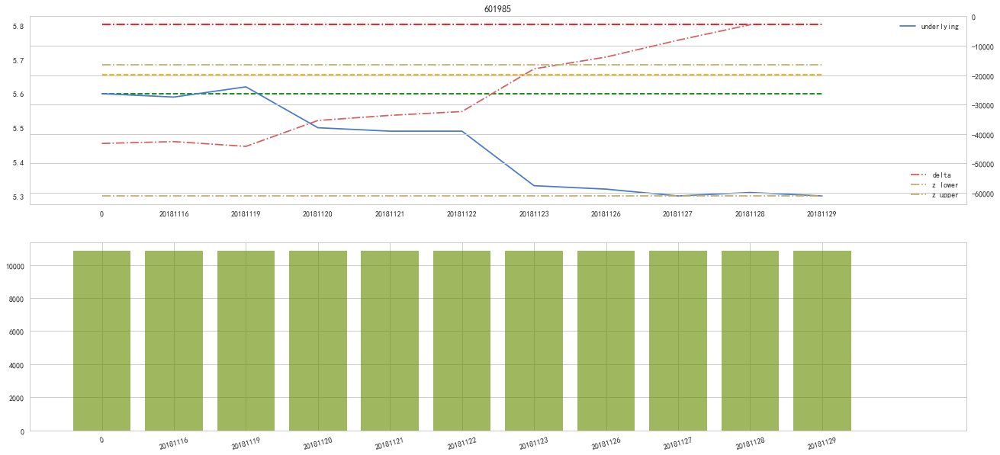

300144
20190103 low 19.01 18.72
20190104 low 19.01 18.58
20190107 low 19.01 18.73
20190108 low 19.01 18.78


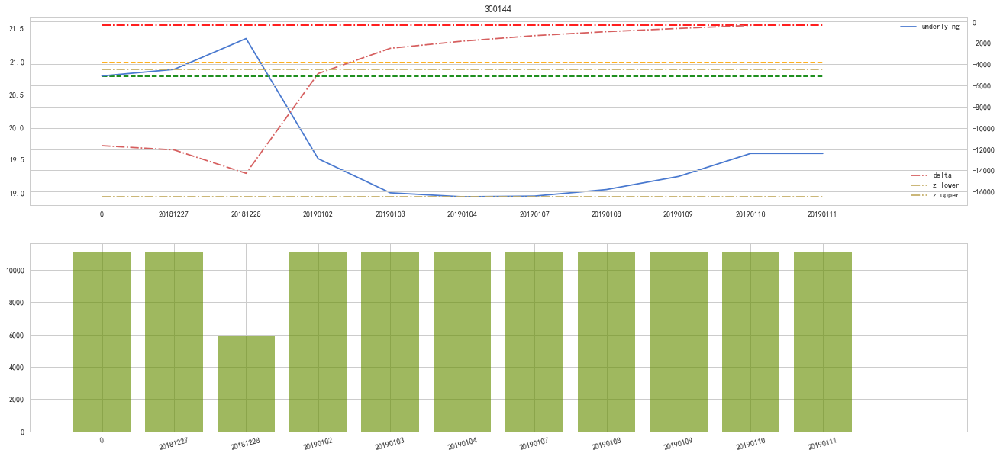

601009


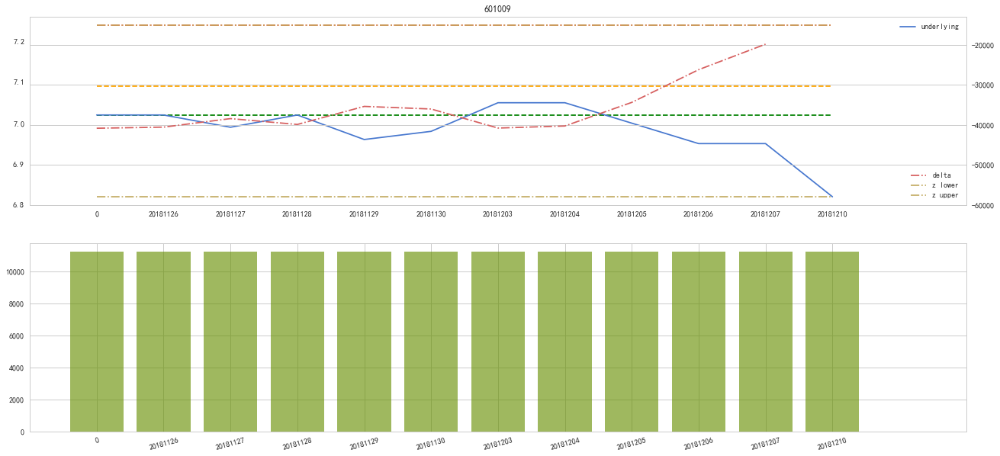

600323


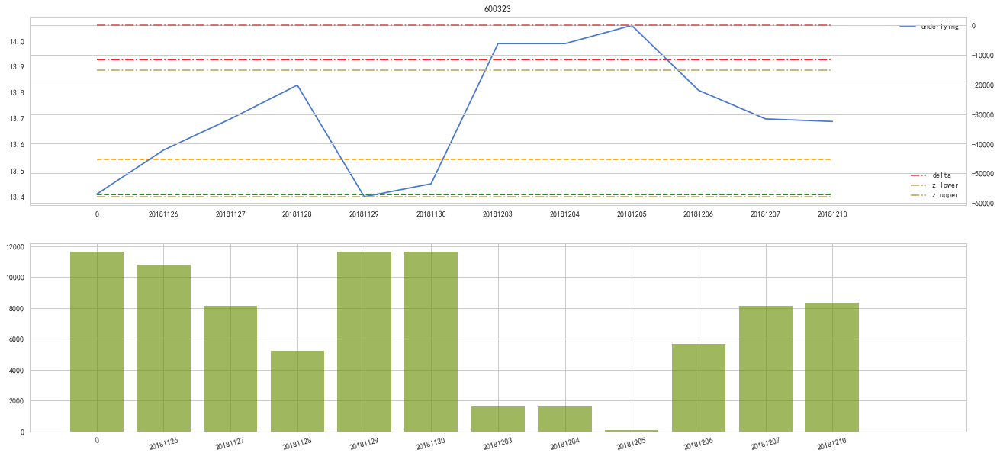

2285


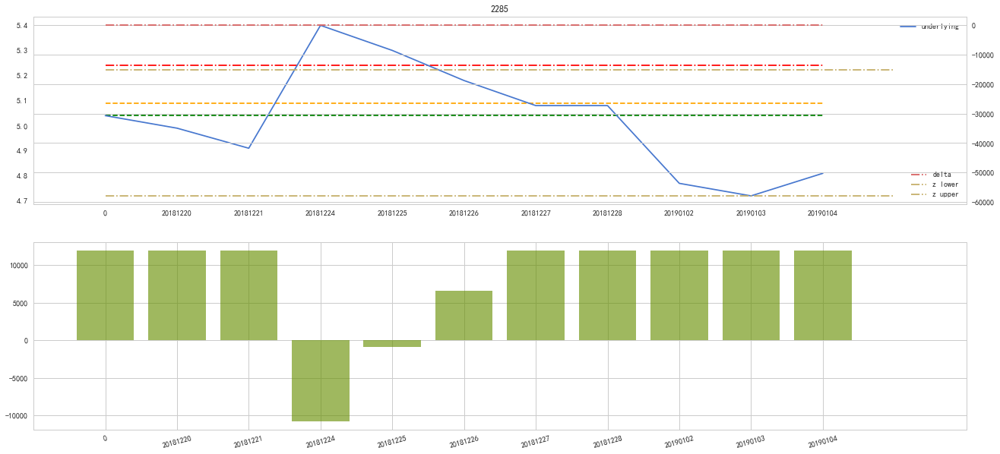

600717
20190118 high 7.8 8.08


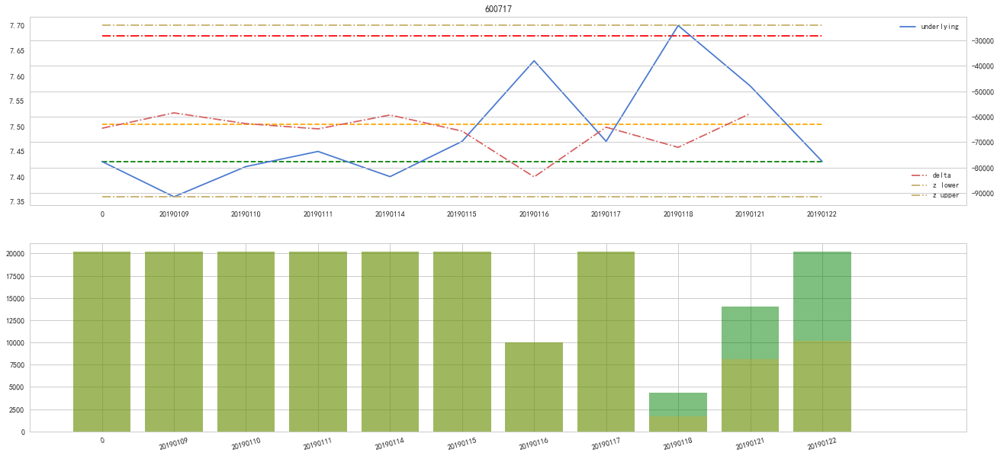

2285
20181120 high 5.62 5.64
20181123 low 5.01 4.97


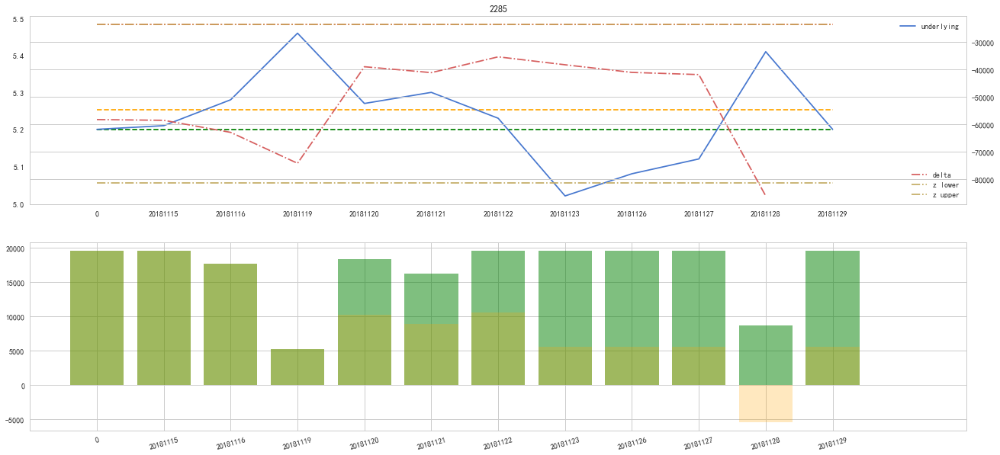

2558


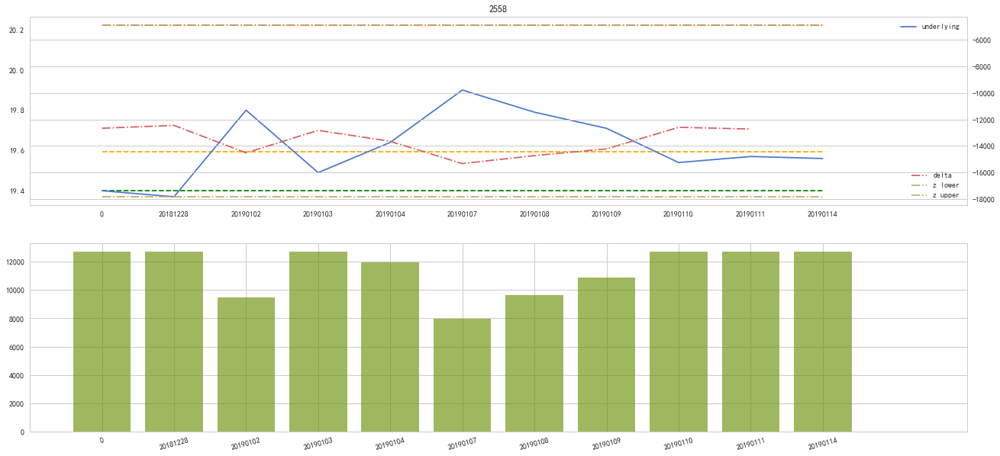

600993


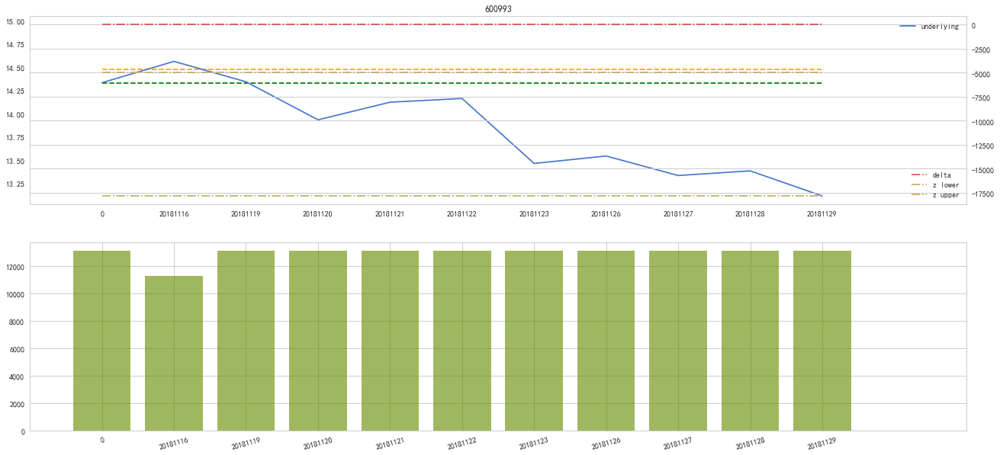

2262
20181207 low 10.71 10.09
20181210 low 10.71 9.26
20181211 low 10.71 9.53
20181212 low 10.71 9.68
20181213 low 10.71 9.6
20181214 low 10.71 9.44


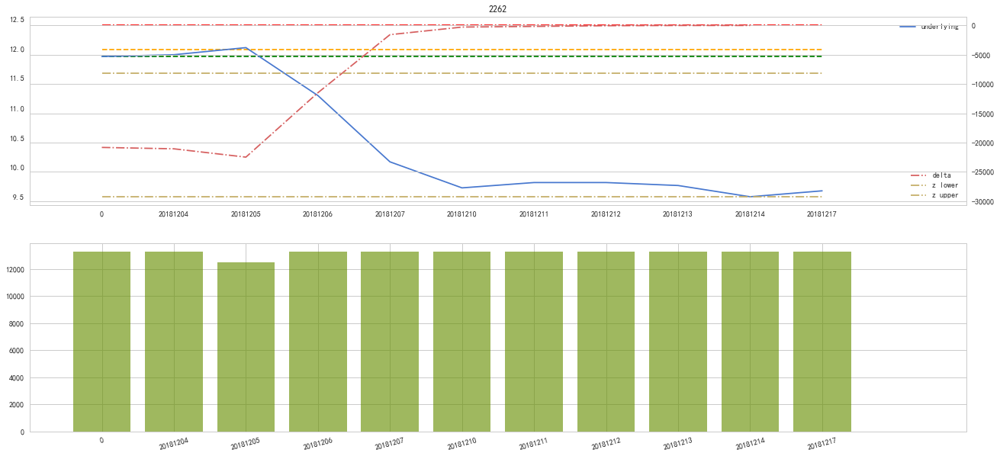

300144
20181228 high 21.22 21.35
20190103 low 19.3 18.72


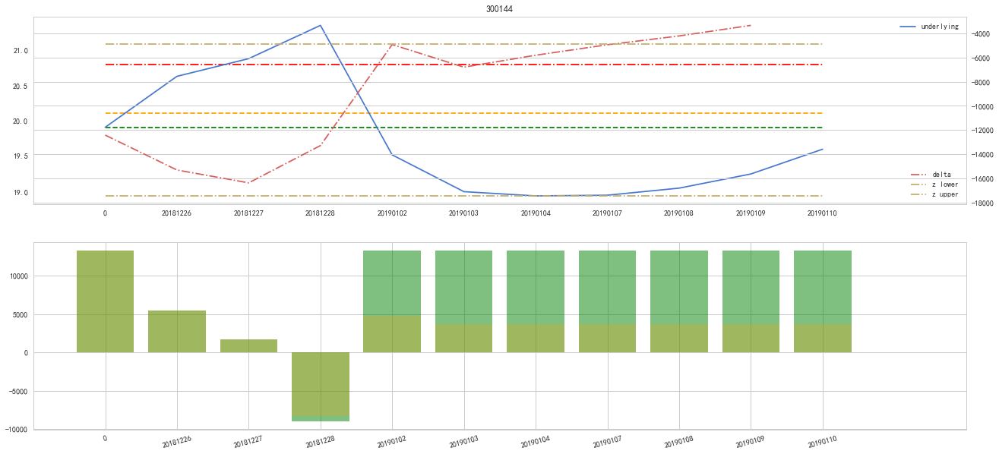

2008
20190104 low 26.84 26.72


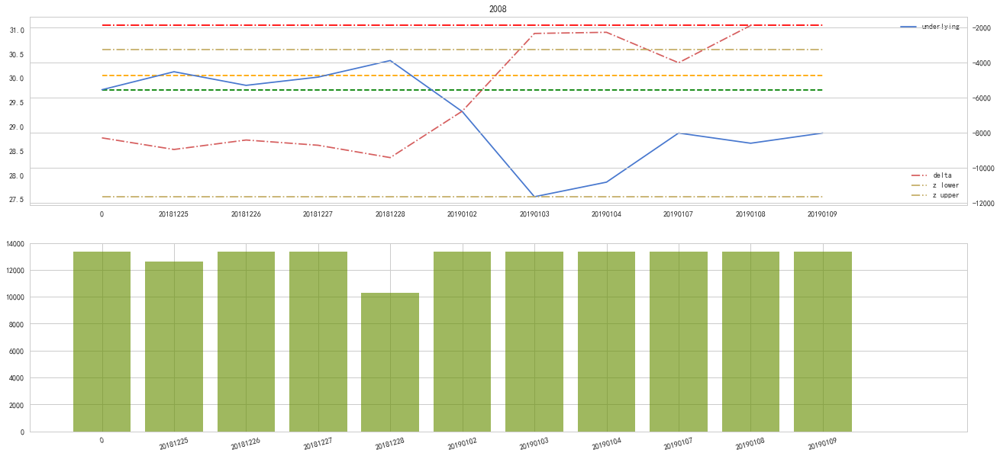

600703


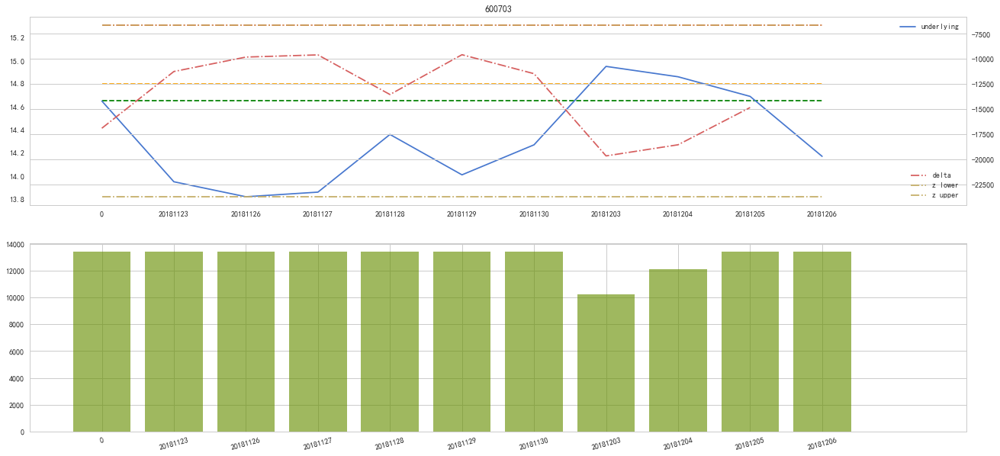

2384
20181225 high 12.0 12.16
20190103 low 10.9 10.03
20190104 low 10.13 9.05
20190107 low 10.13 9.52
20190108 low 10.13 9.91


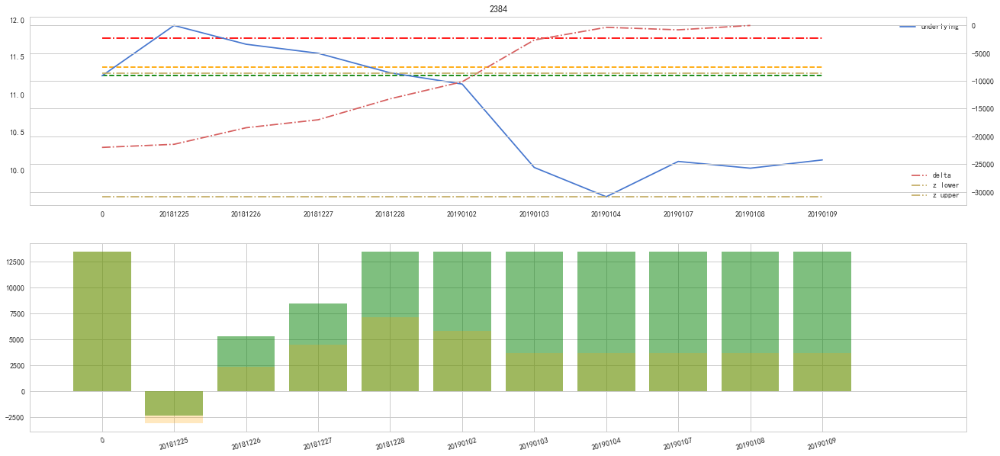

600811


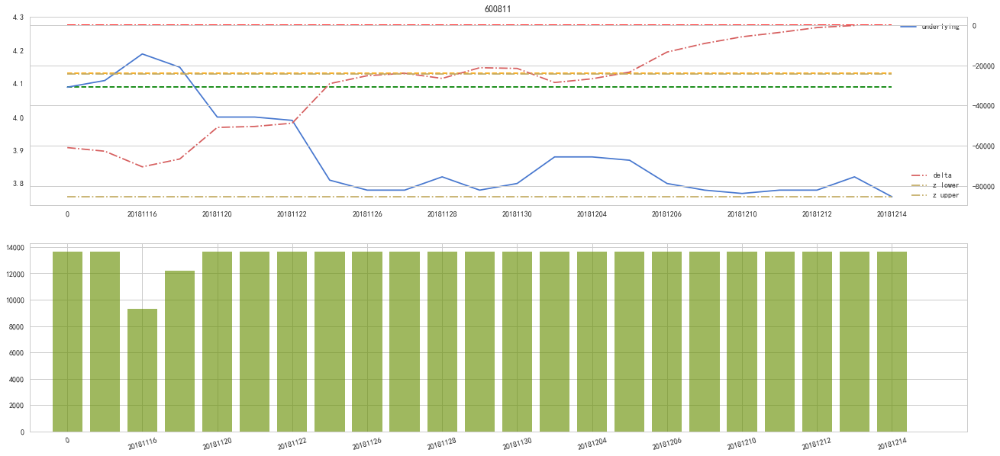

600811


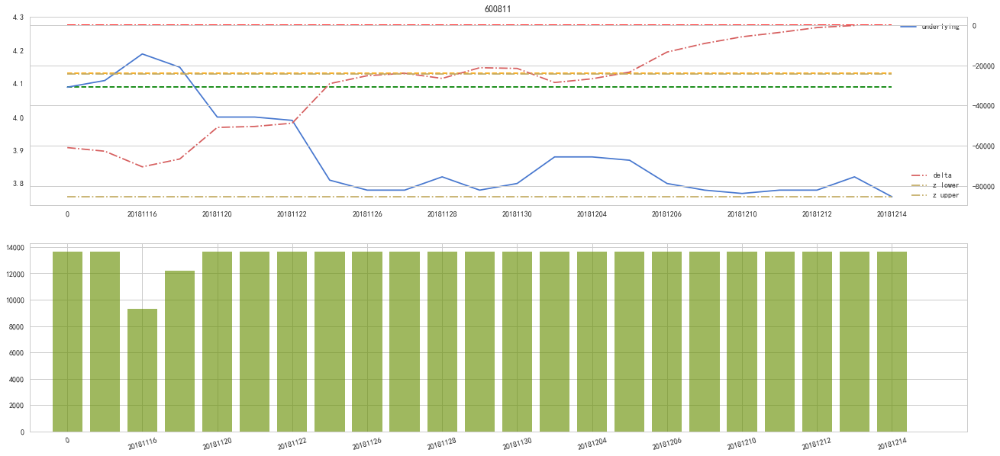

667


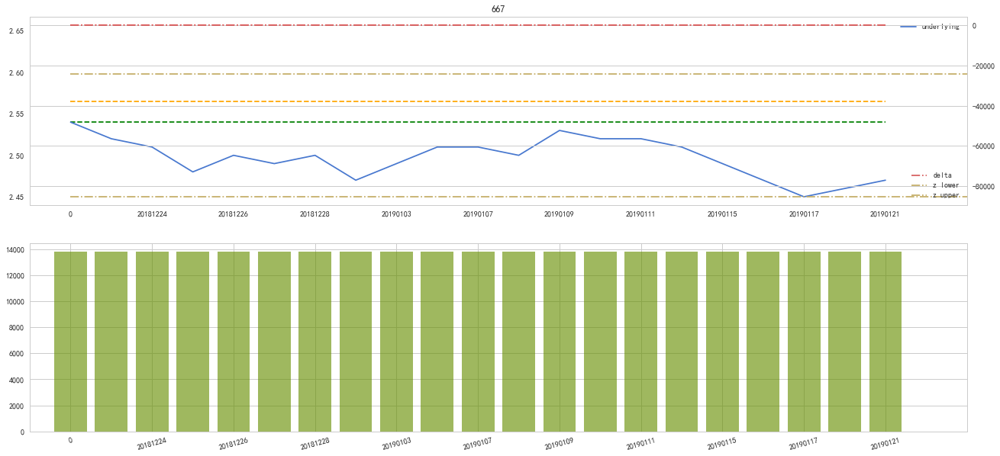

2611


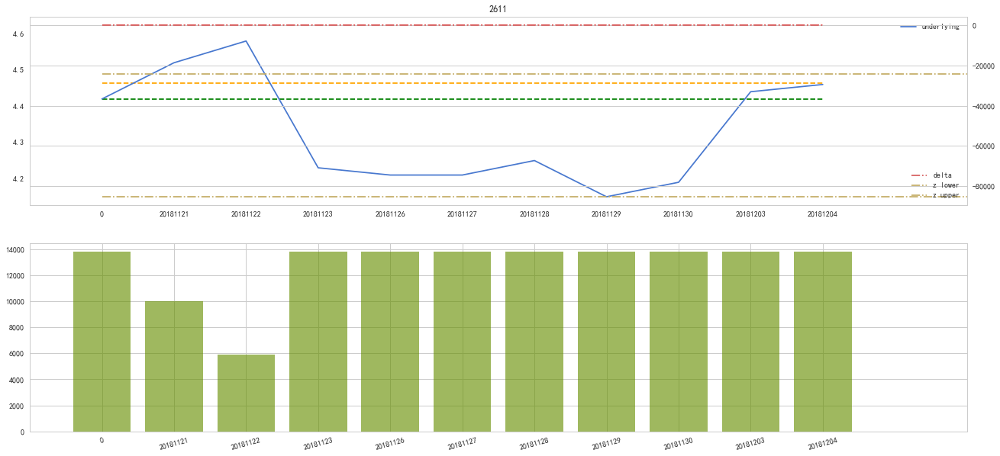

2619


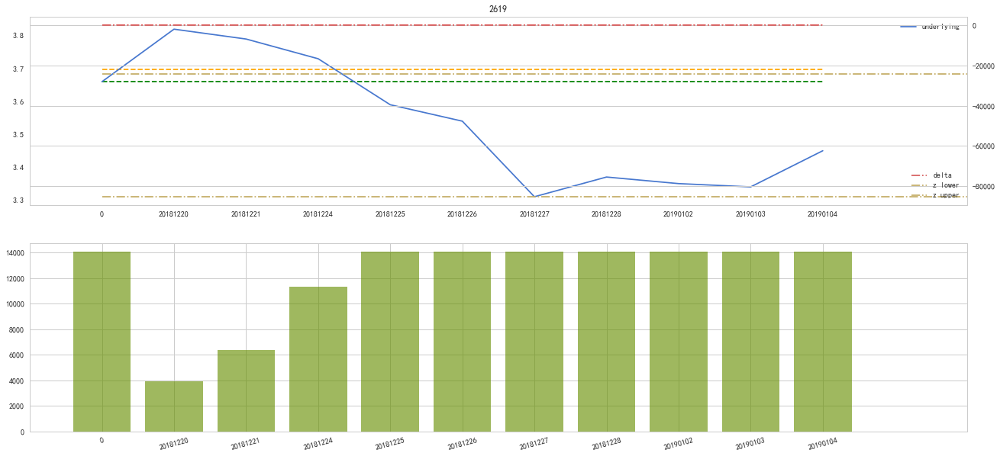

300010


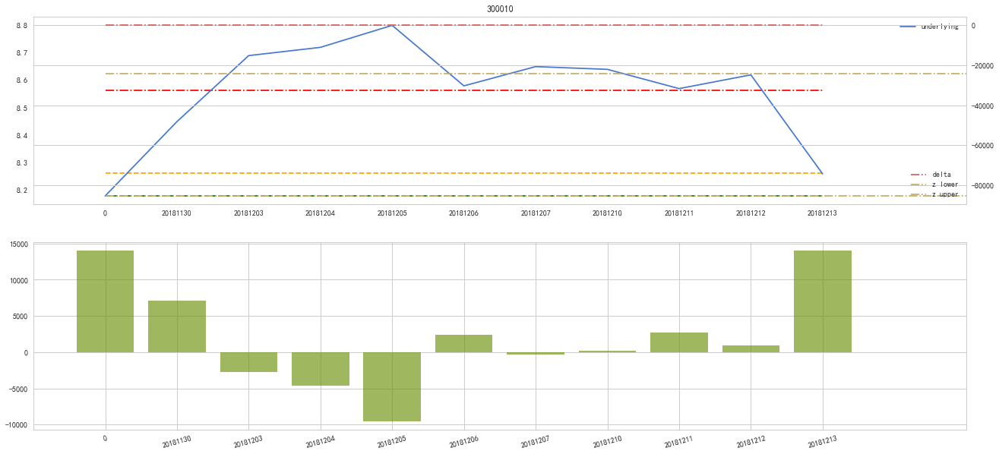

2368


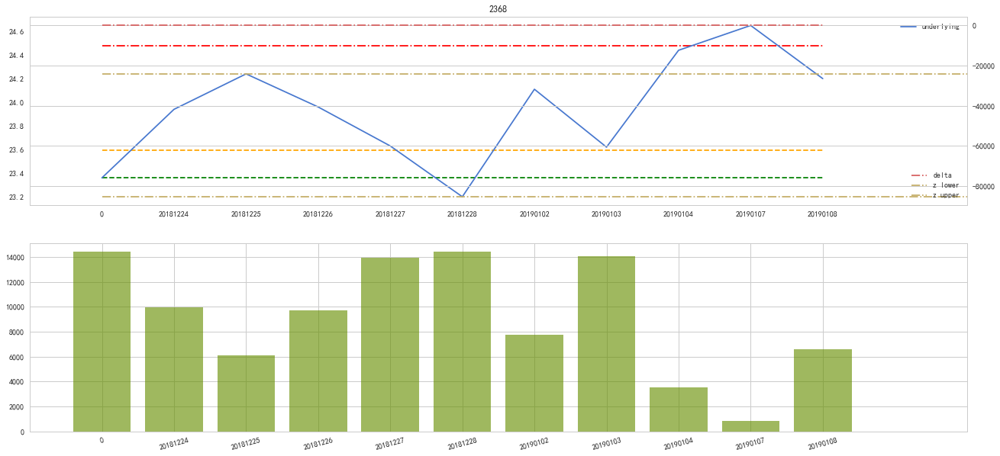

661


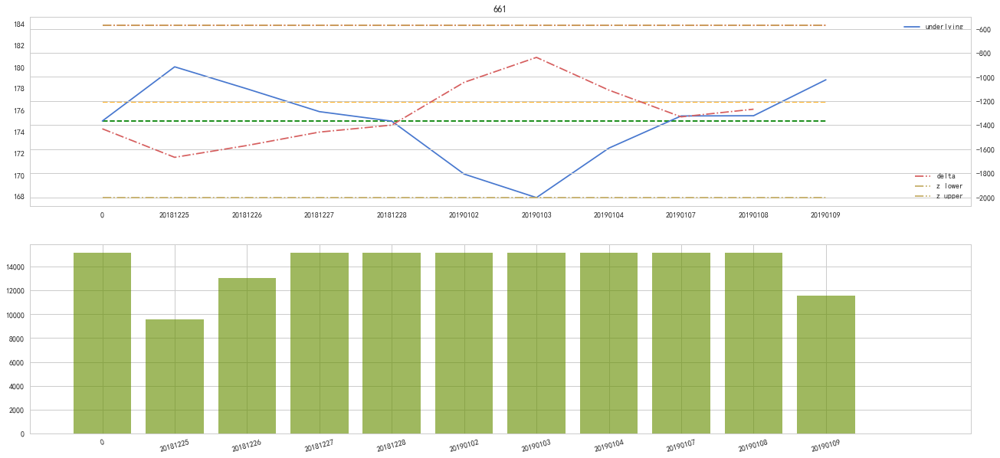

2155


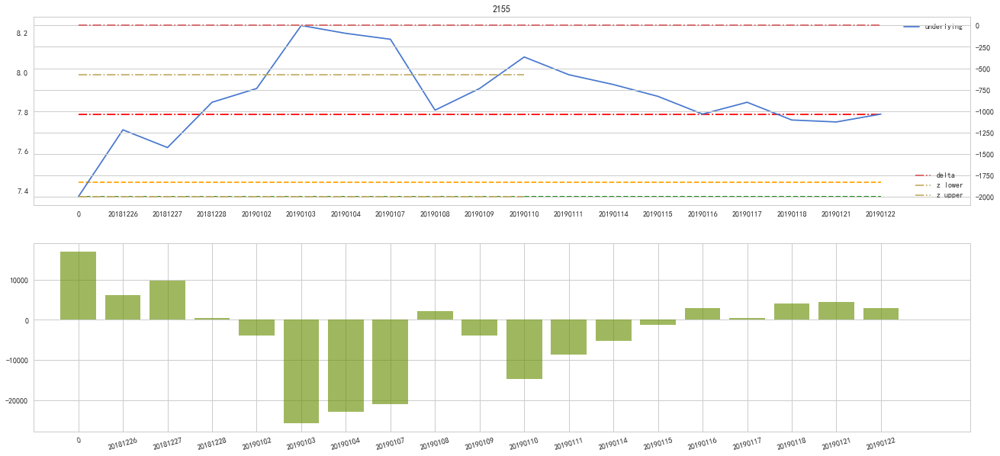

600273
20181220 low 9.1 8.9
20181221 low 9.1 8.01
20181224 low 9.1 8.3
20181225 low 9.1 8.2
20181226 low 9.1 8.26
20181227 low 9.1 8.42
20181228 low 9.1 8.79
20190102 low 9.1 8.68
20190103 low 9.1 8.62
20190104 low 9.1 8.41
20190107 low 9.1 8.68
20190108 low 9.1 8.83
20190109 low 9.1 8.86
20190111 low 9.1 9.05
20190114 low 9.1 9.09


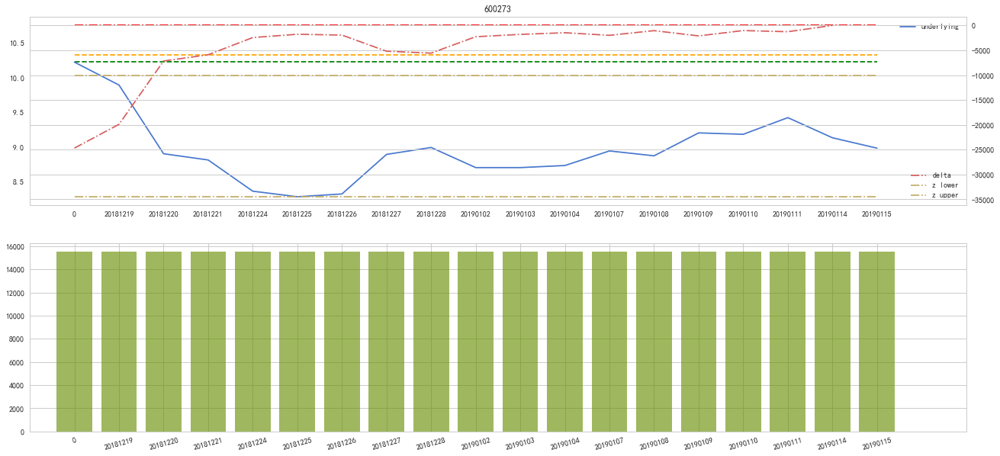

6


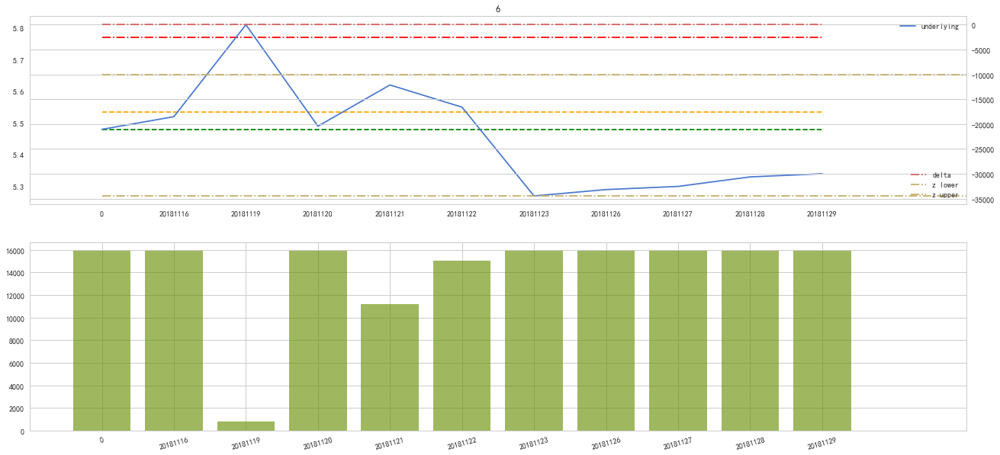

2701


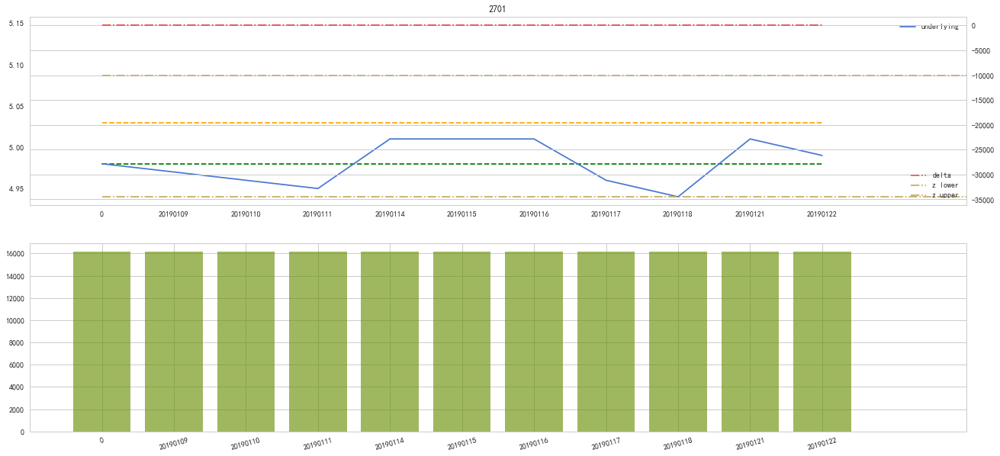

2266


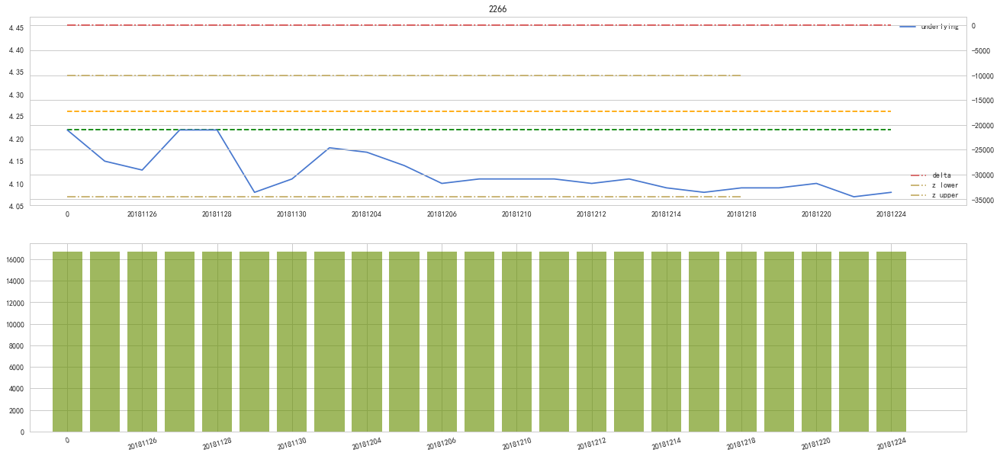

600699


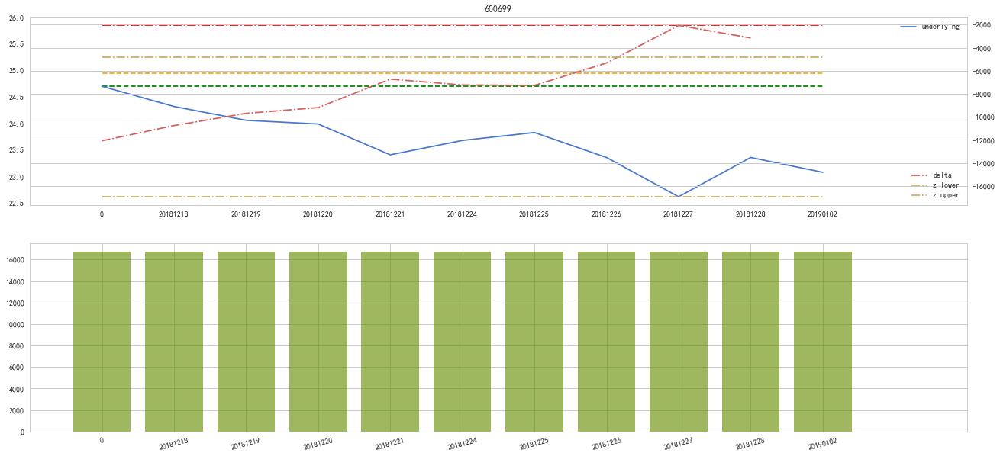

727


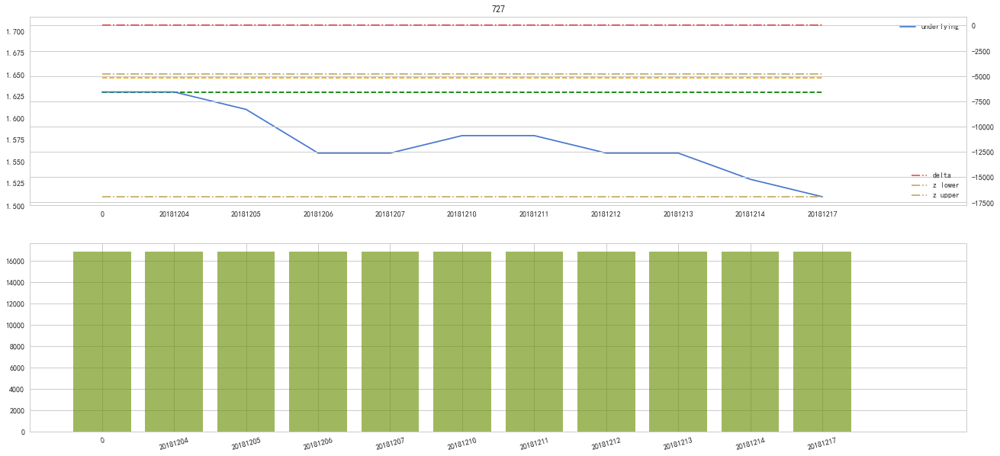

727


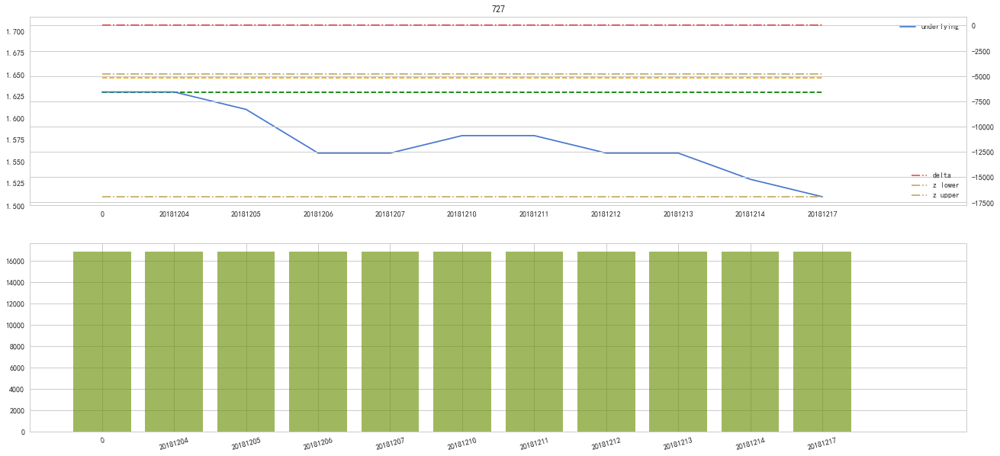

600547
20190103 high 30.93 31.15


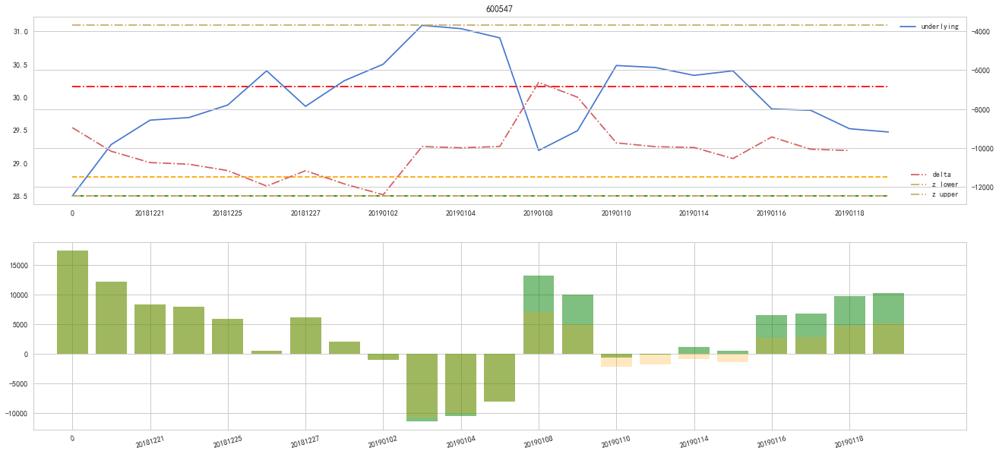

603338


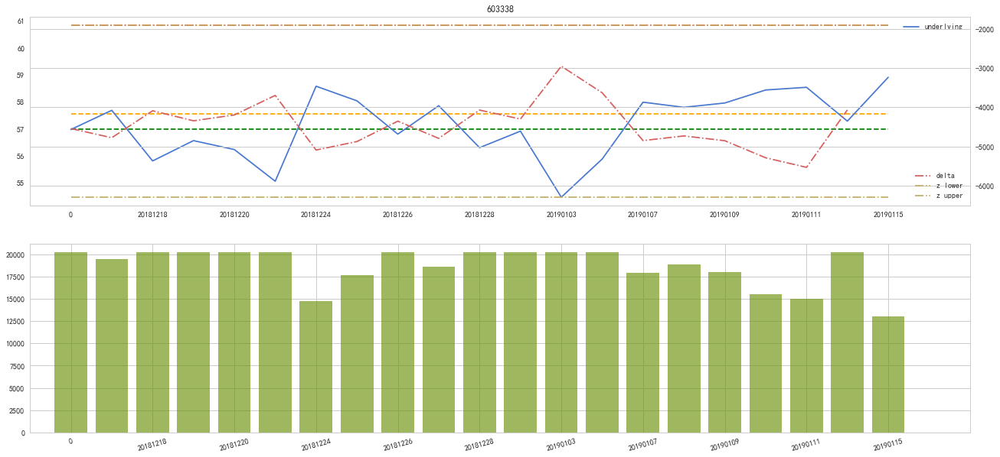

600068
20181213 high 6.99 7.15
20181225 low 6.18 6.08


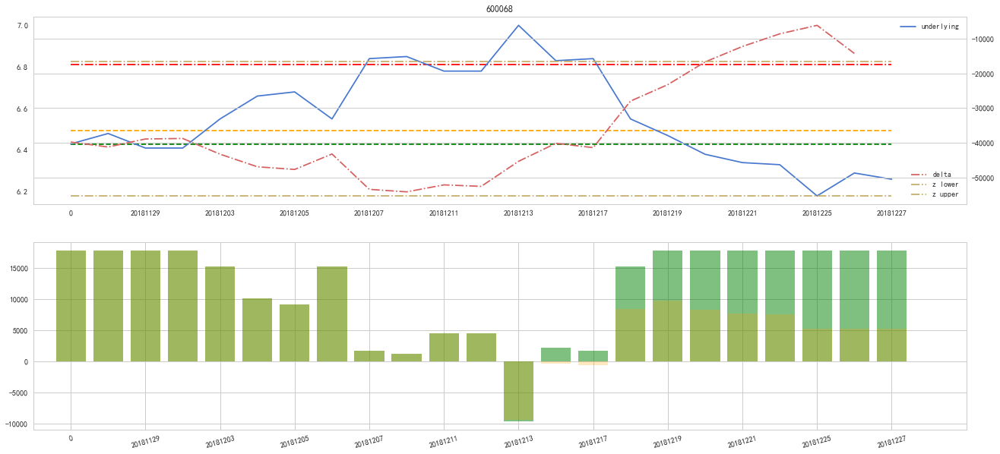

2281


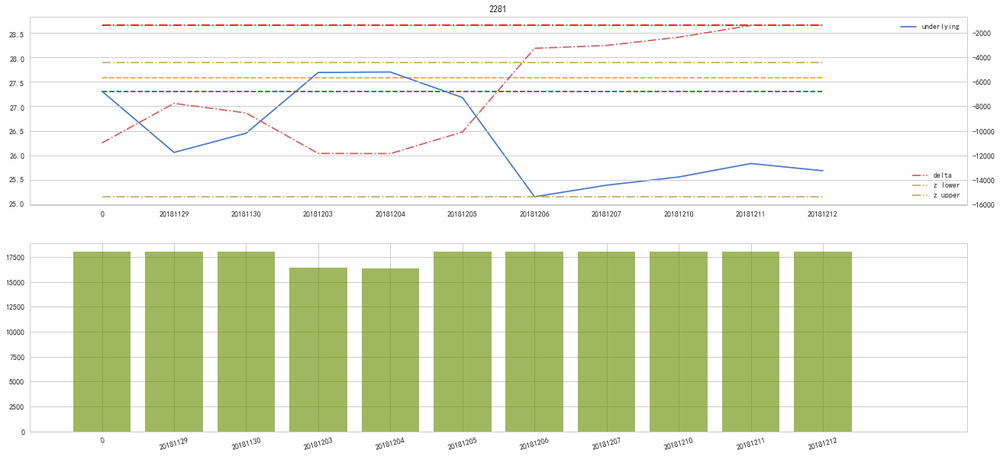

600491


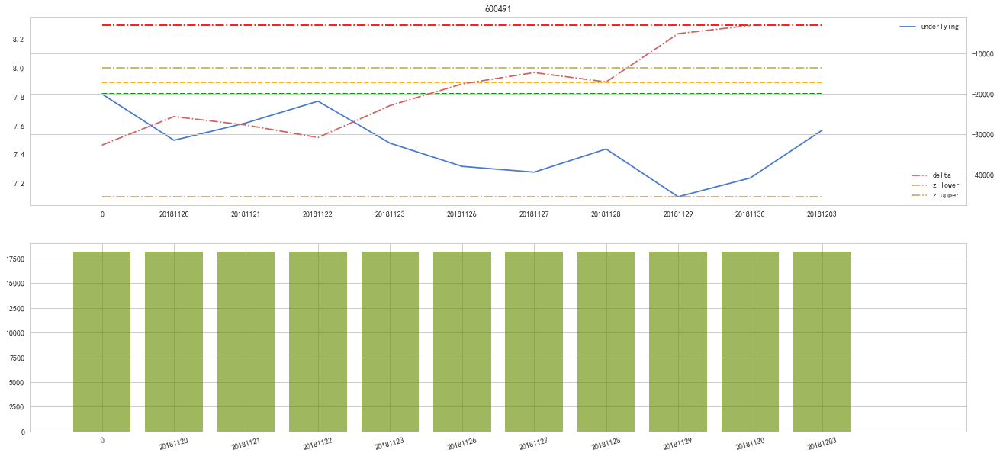

2080


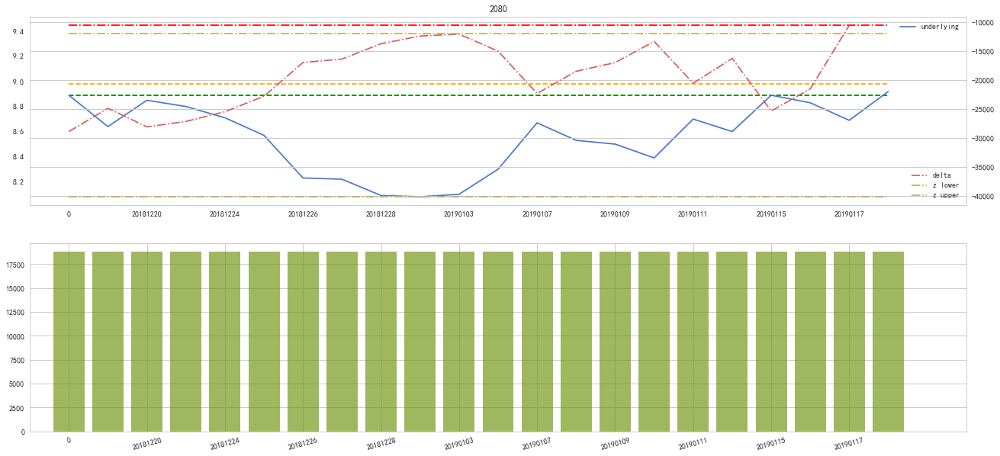

2558


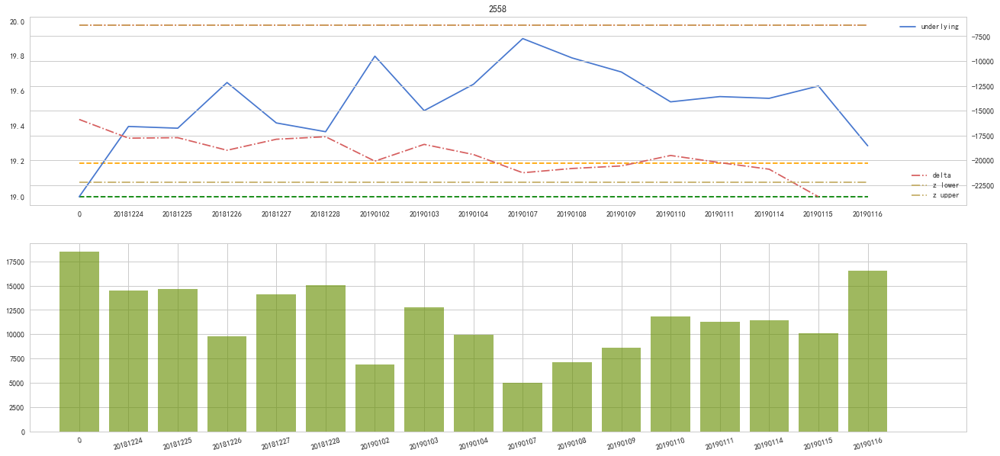

600240


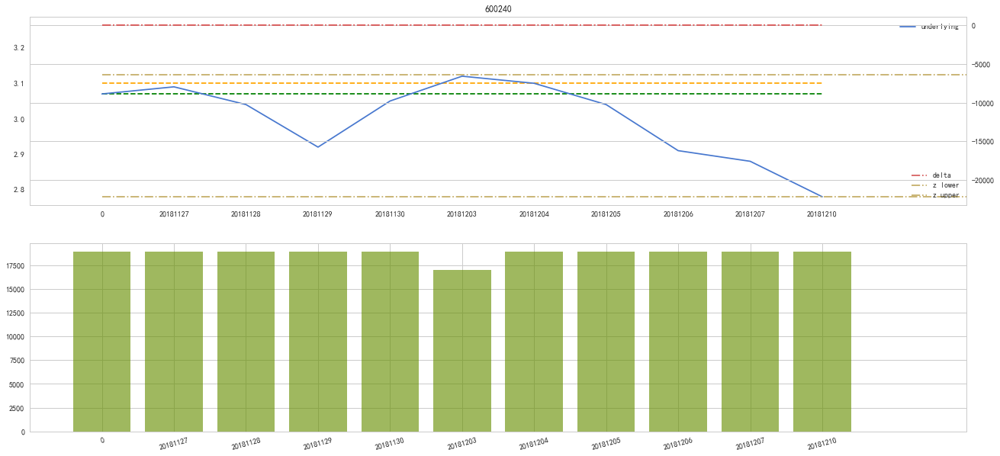

300482


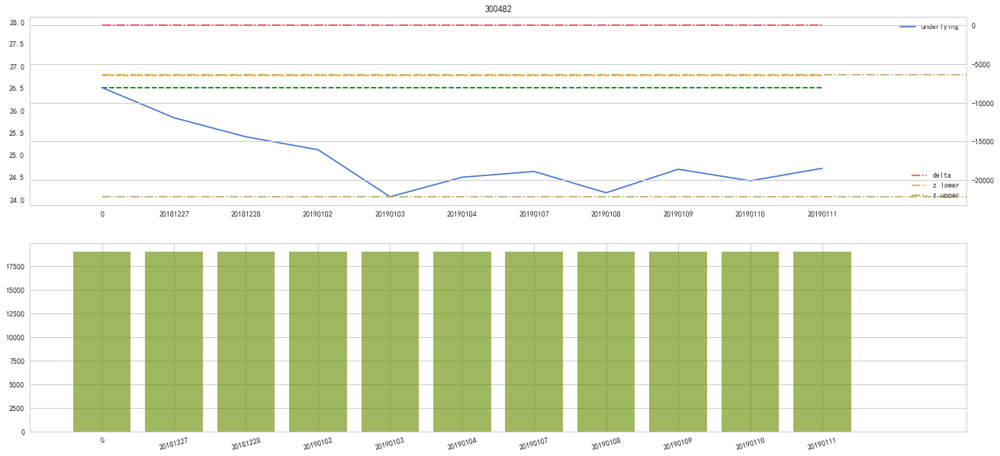

601200


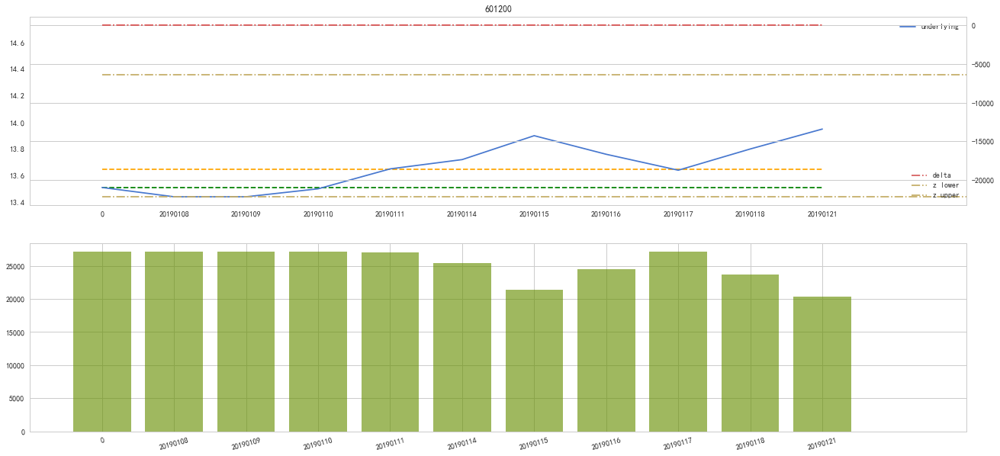

2449


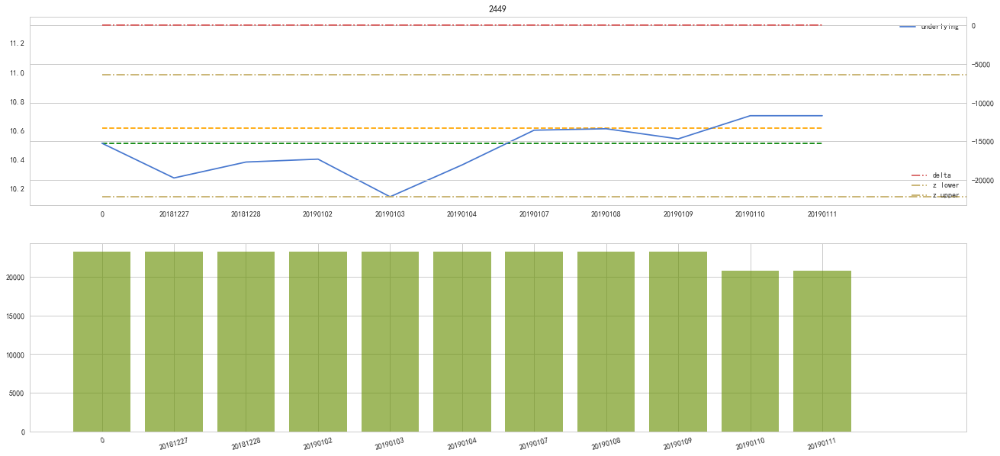

2701


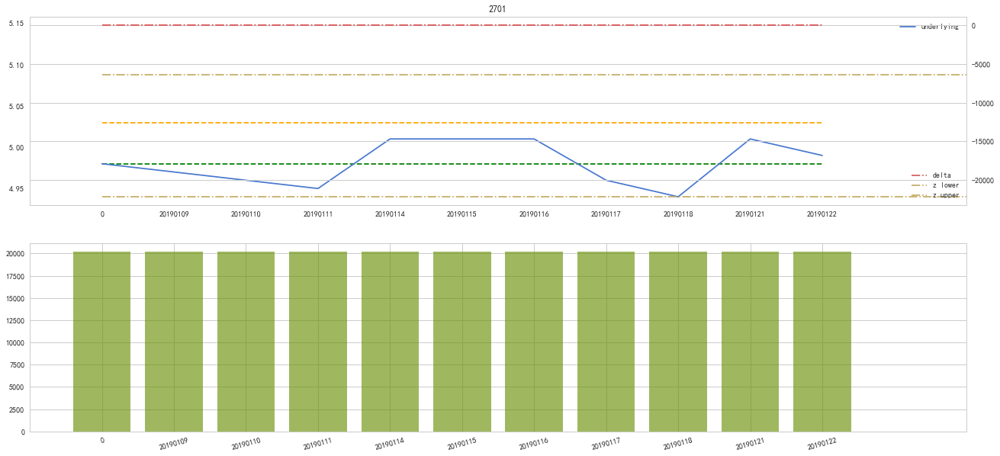

735
20181206 high 10.01 10.26


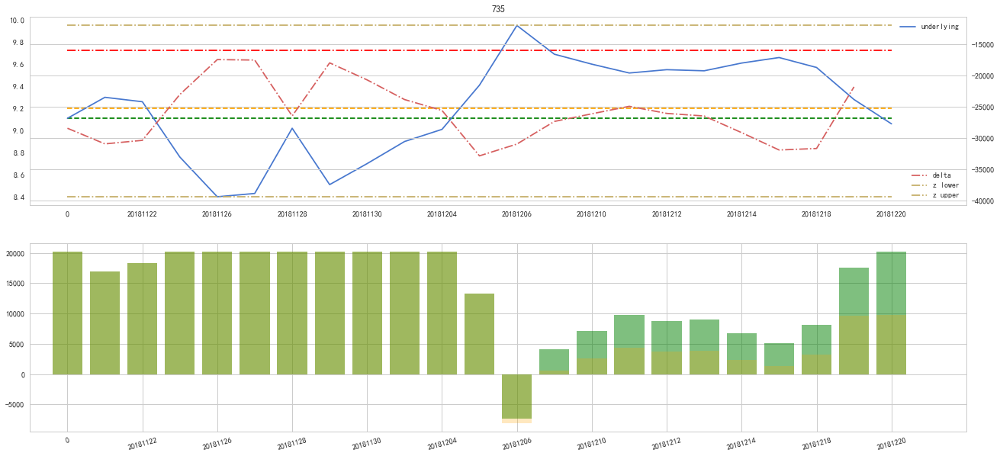

300222


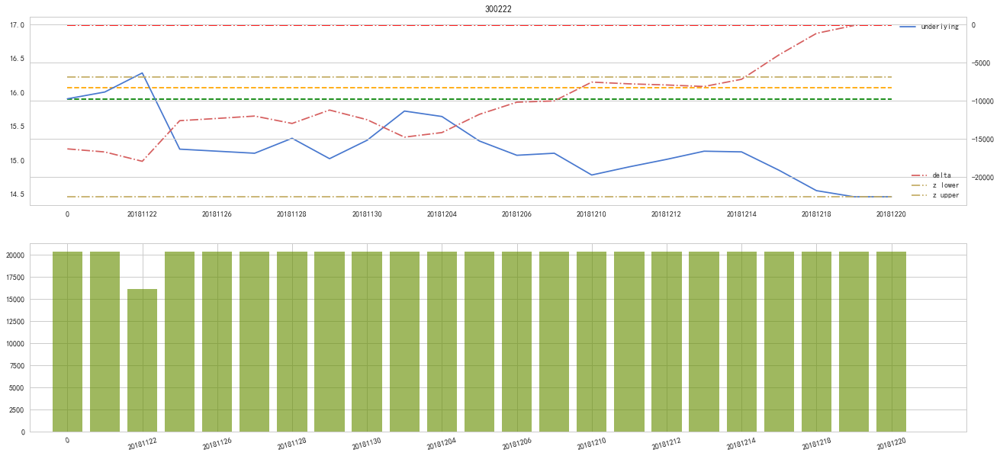

400


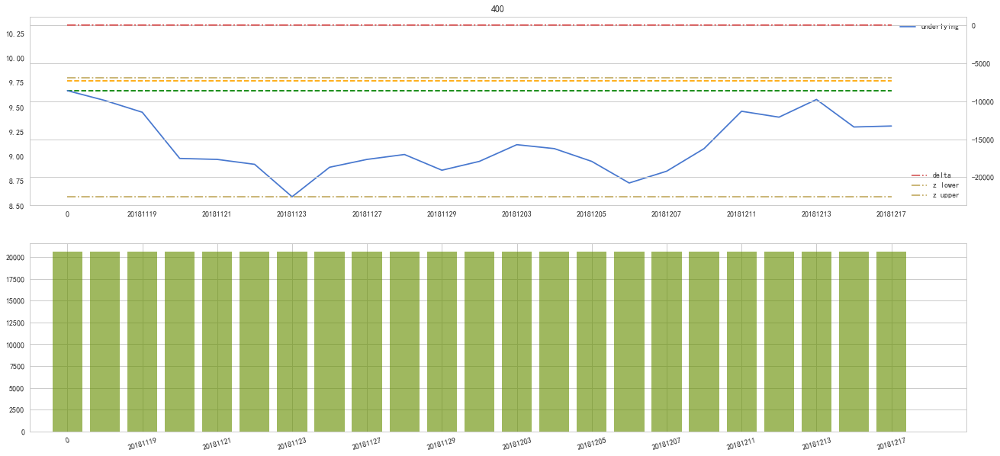

400


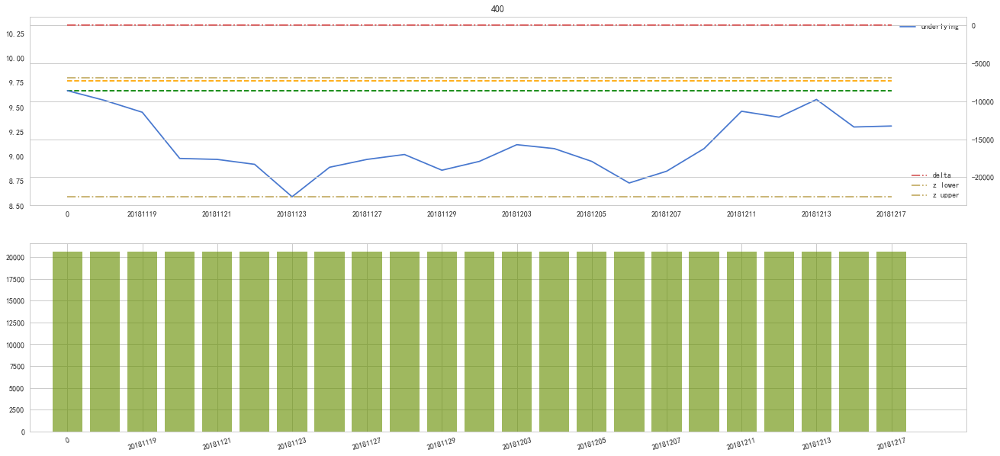

2611


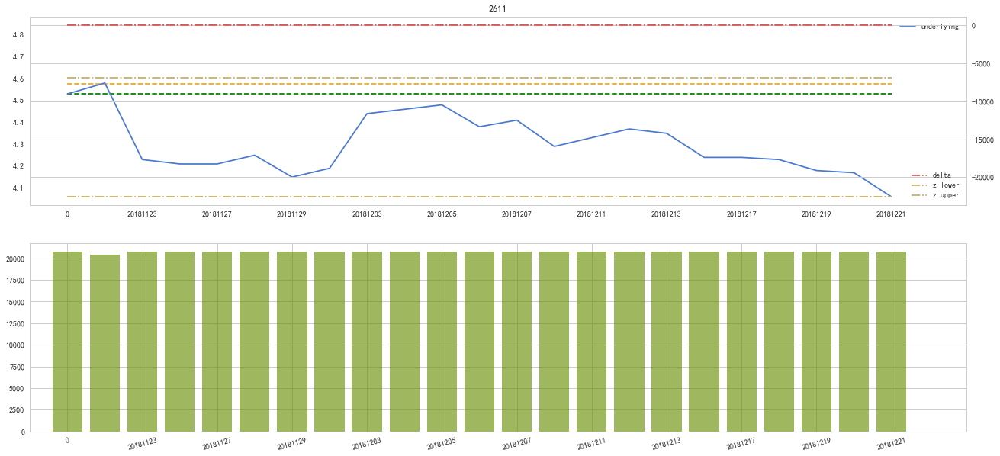

735


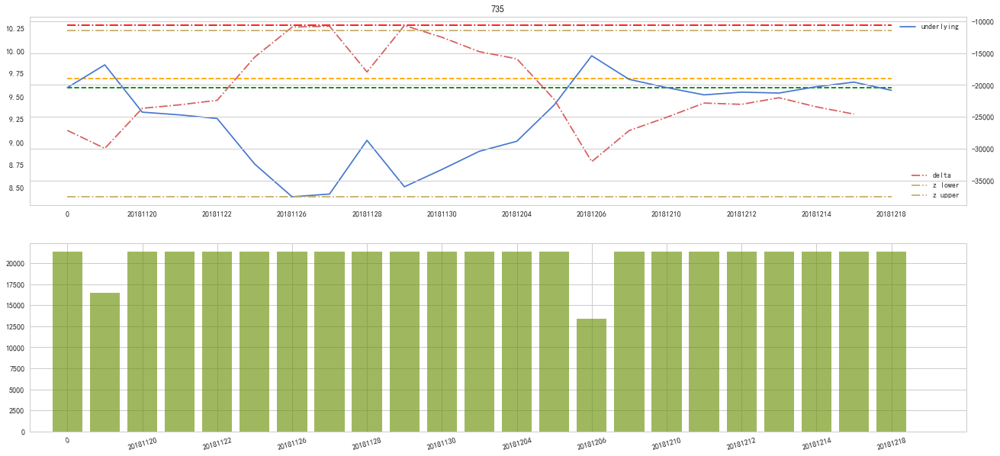

735


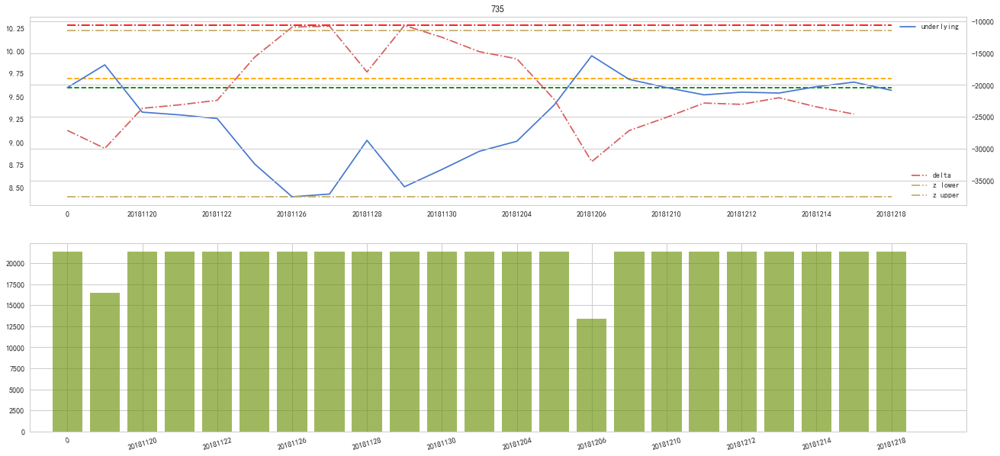

600874
20181225 low 7.72 7.68


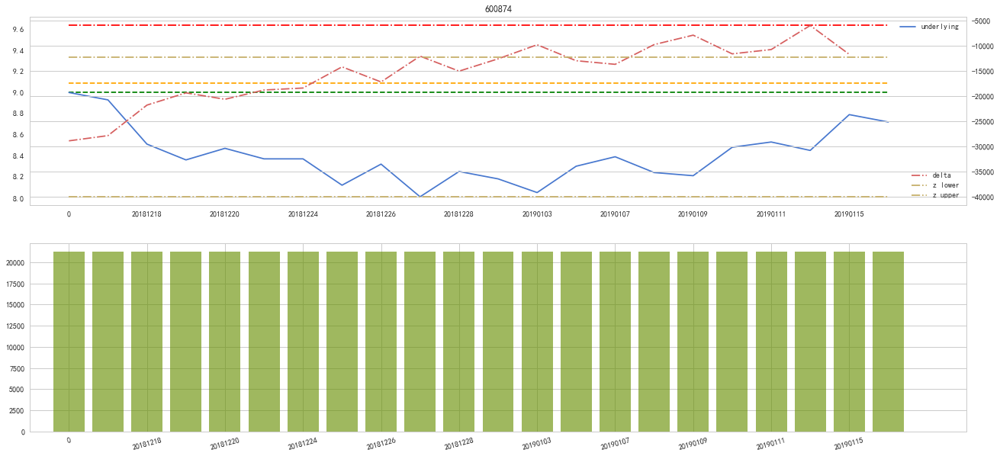

2664


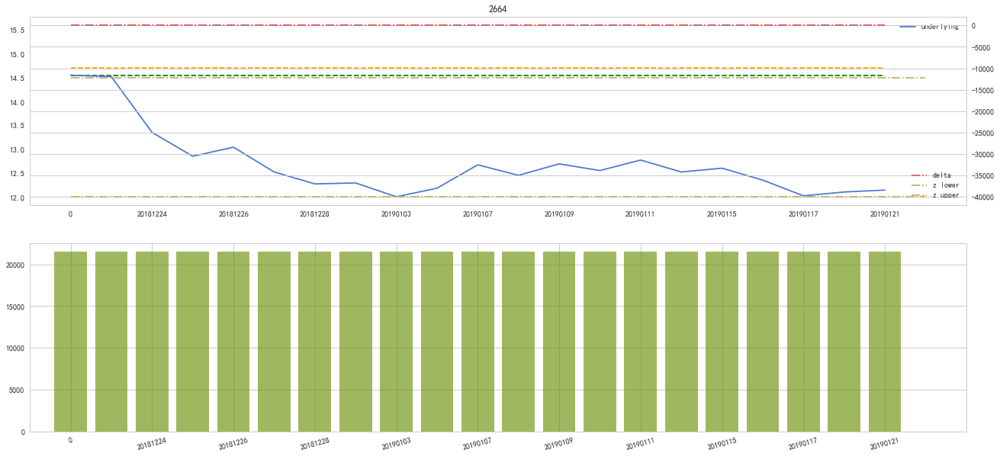

2664


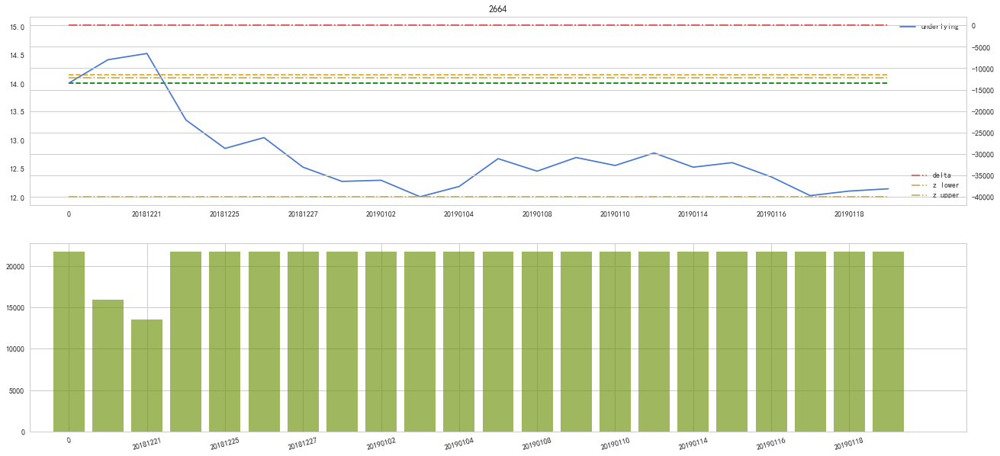

2449


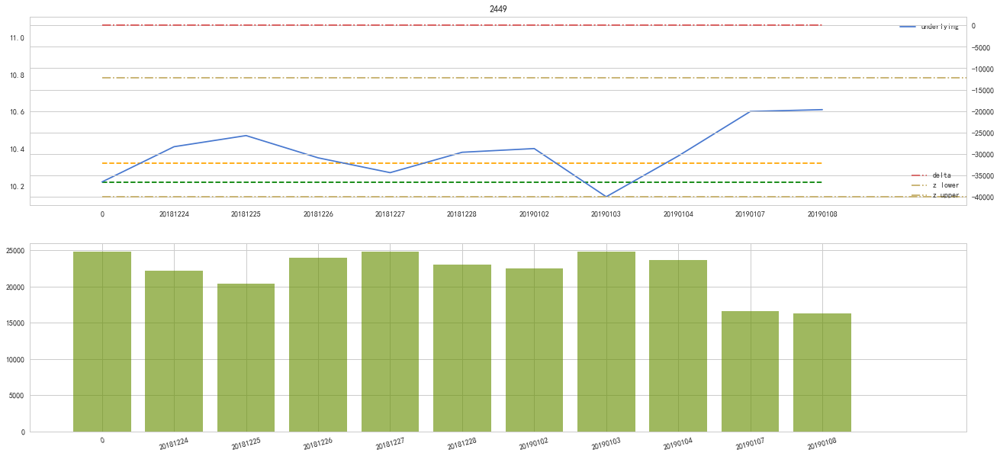

2449


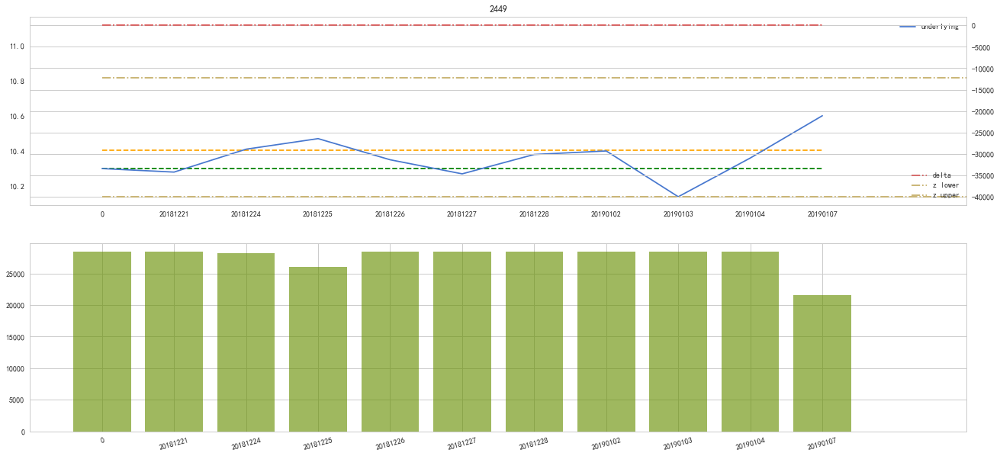

2276


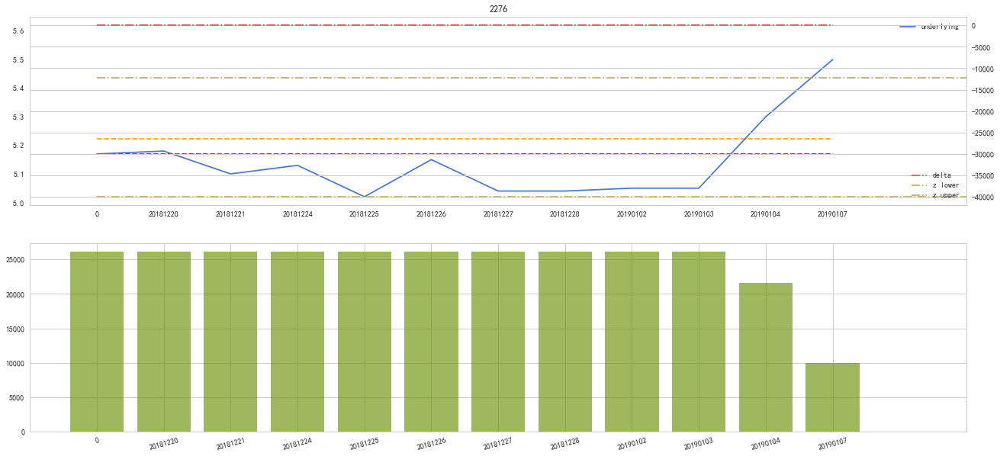

2699


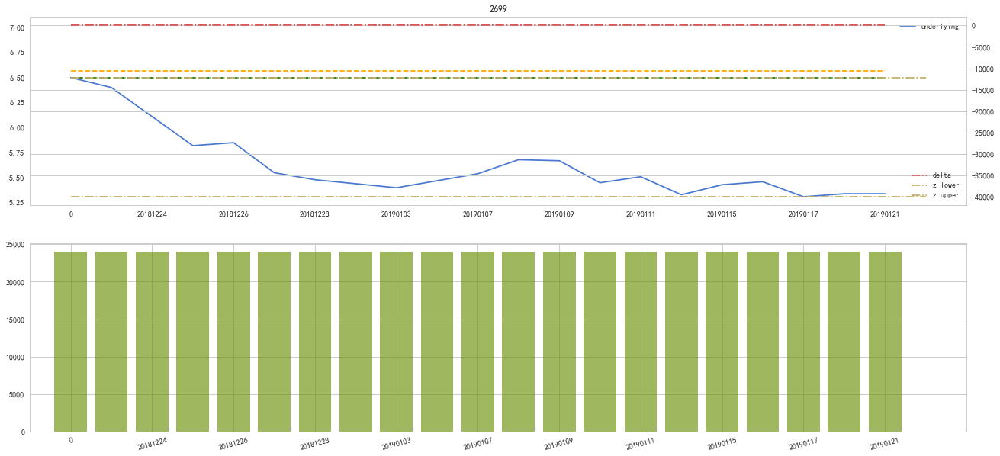

601166


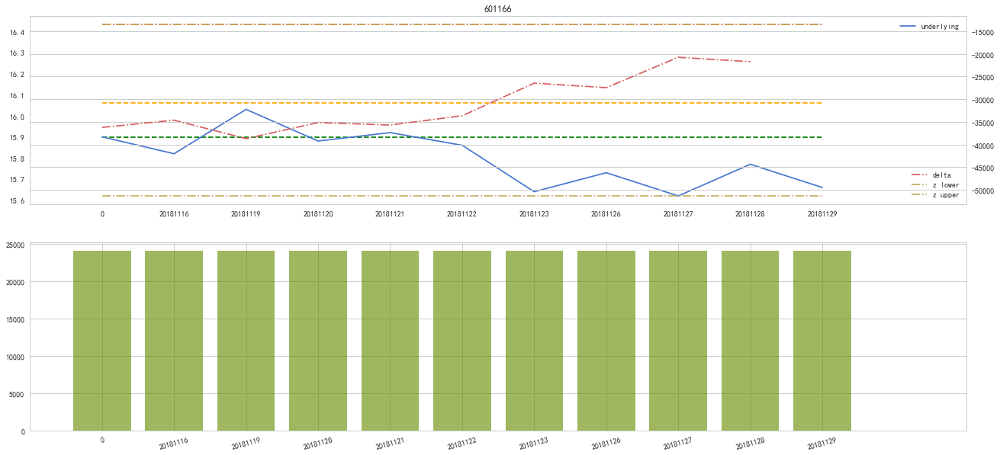

2155


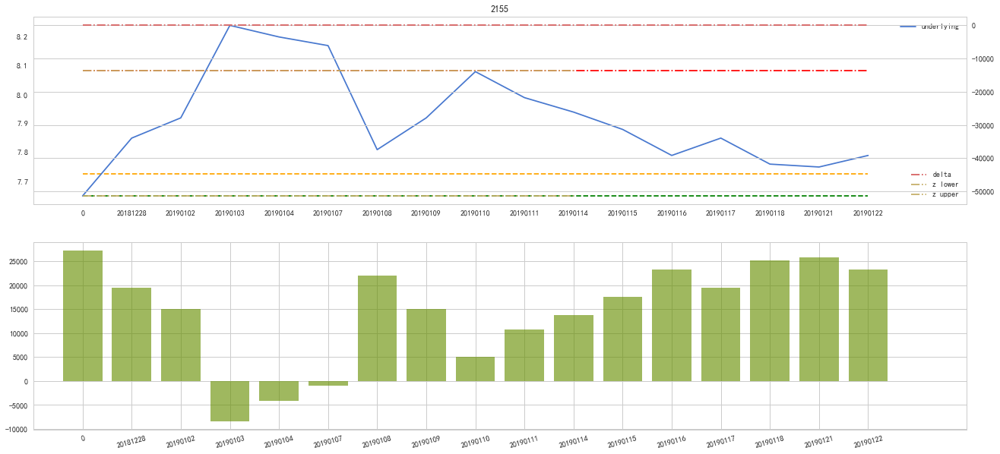

2002


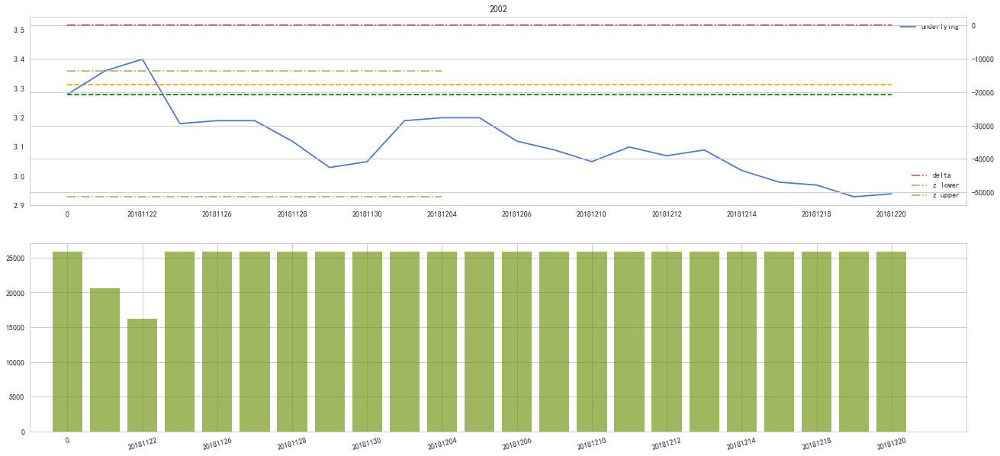

600600
20190104 low 32.39 32.19


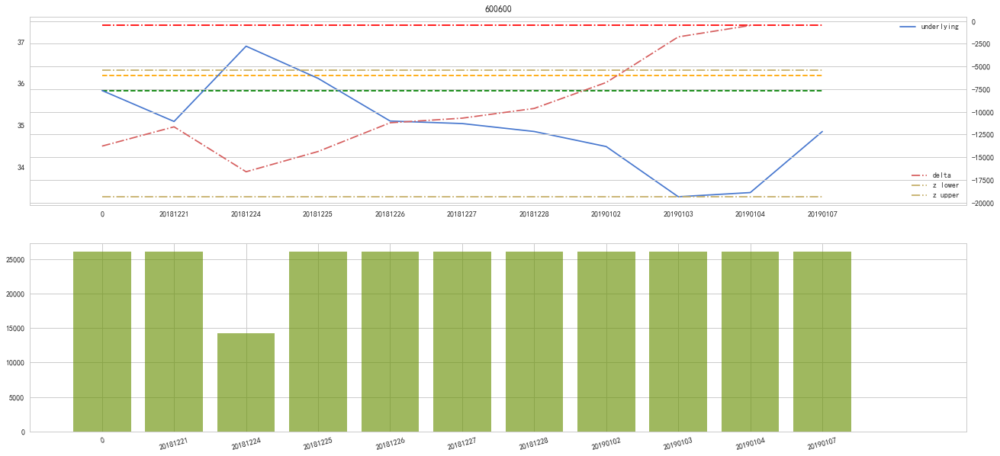

600600


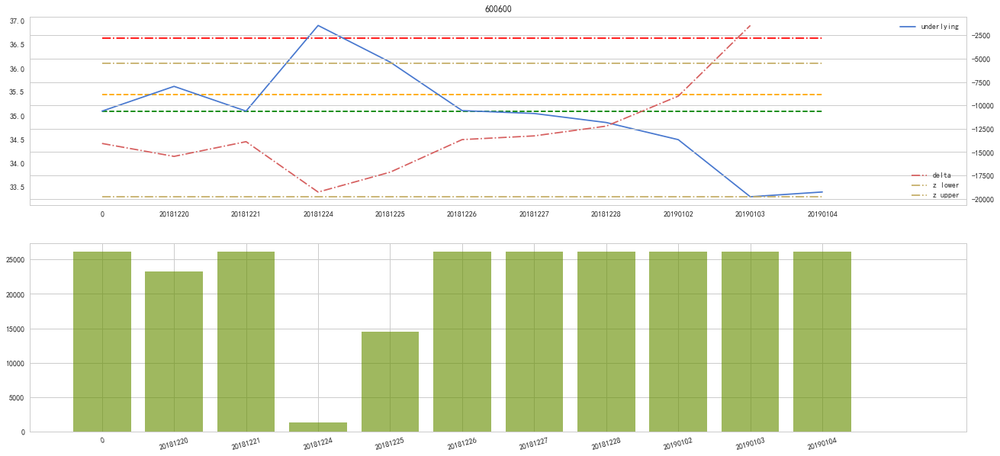

300101


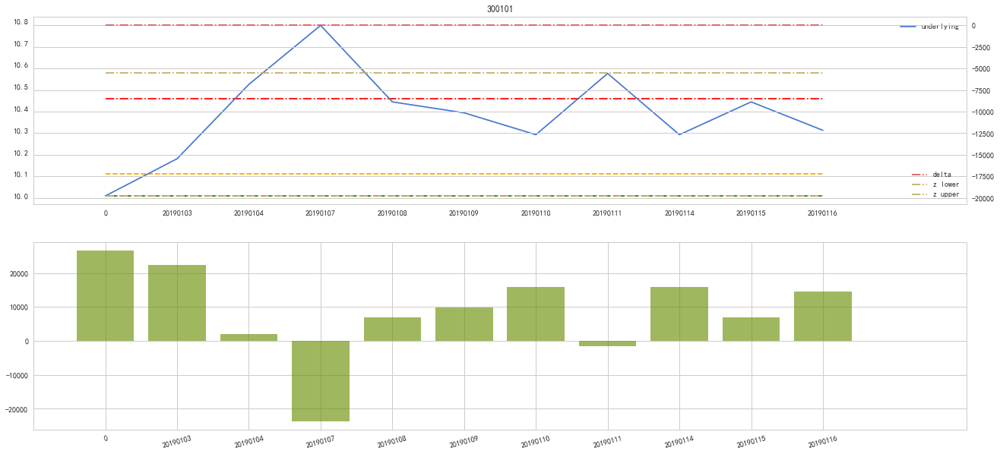

600372


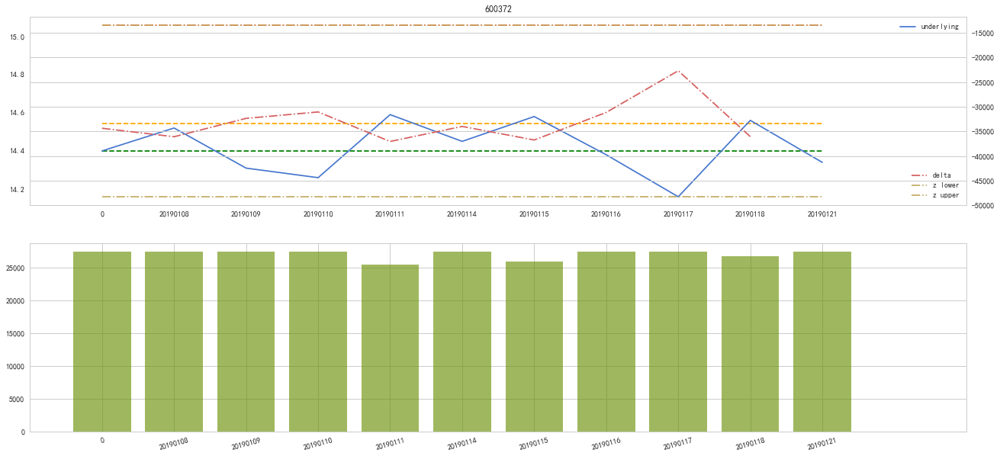

988


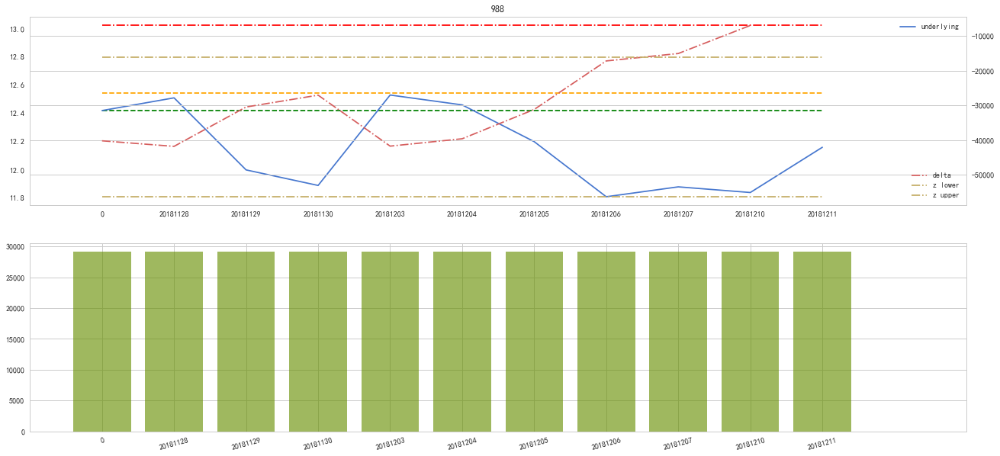

2508
20190104 low 19.57 19.38


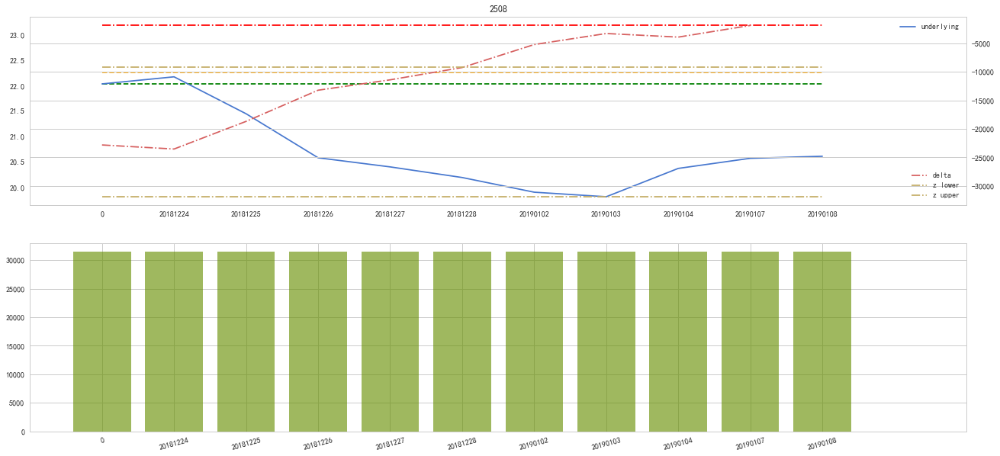

877


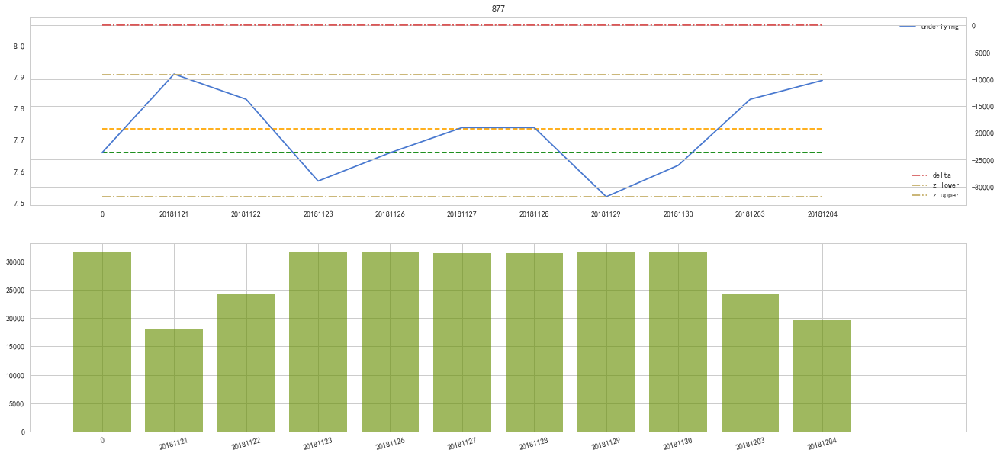

300009


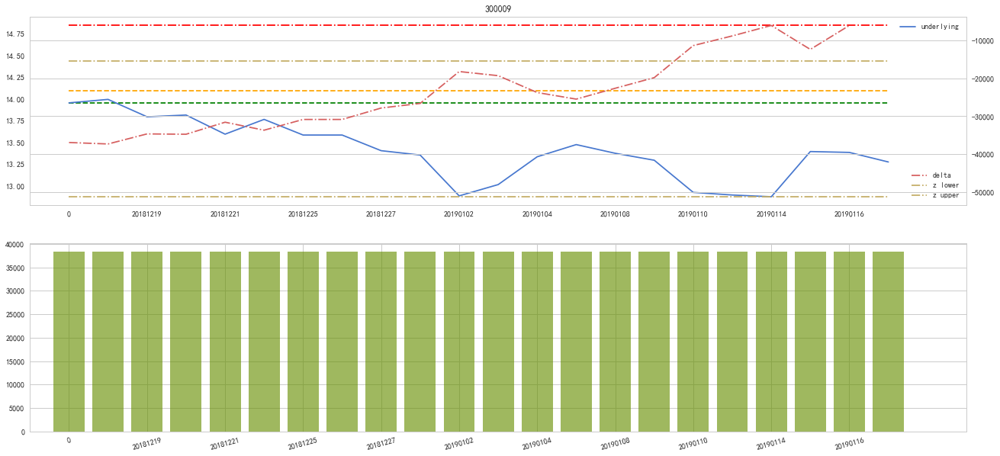

600025


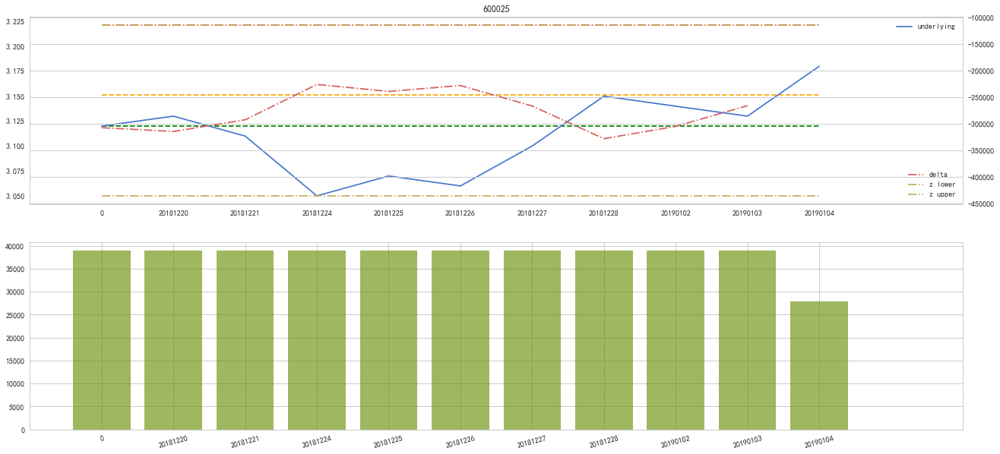

600491


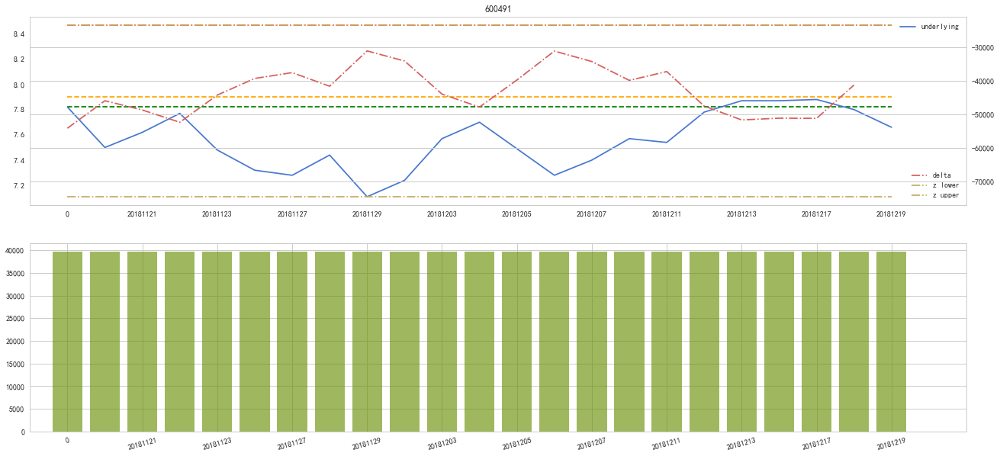

2276


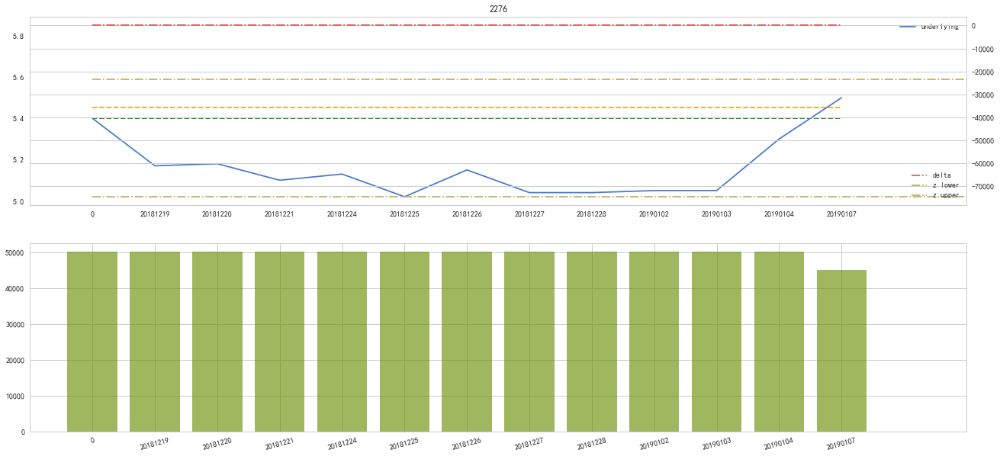

300024


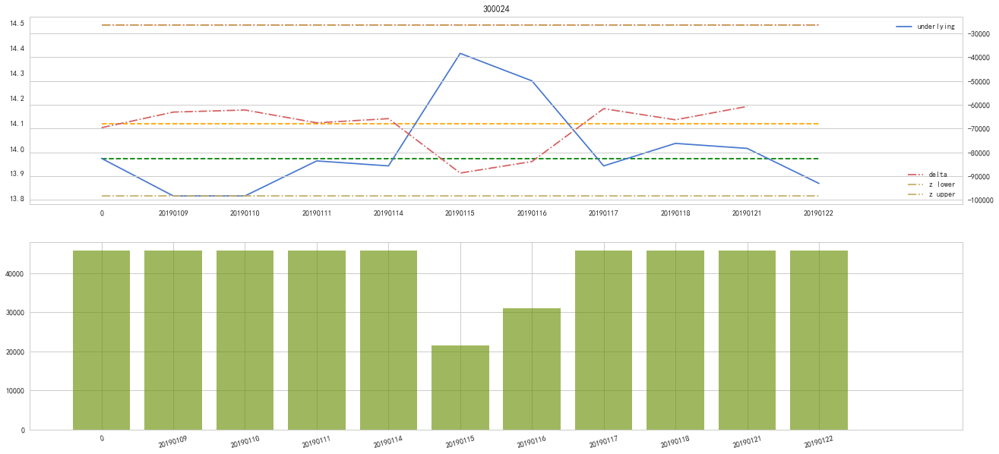

2276


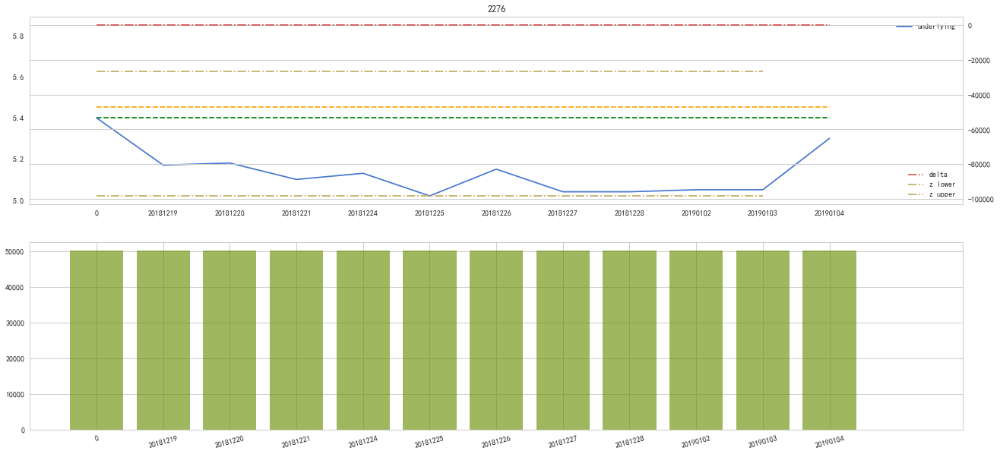

600884


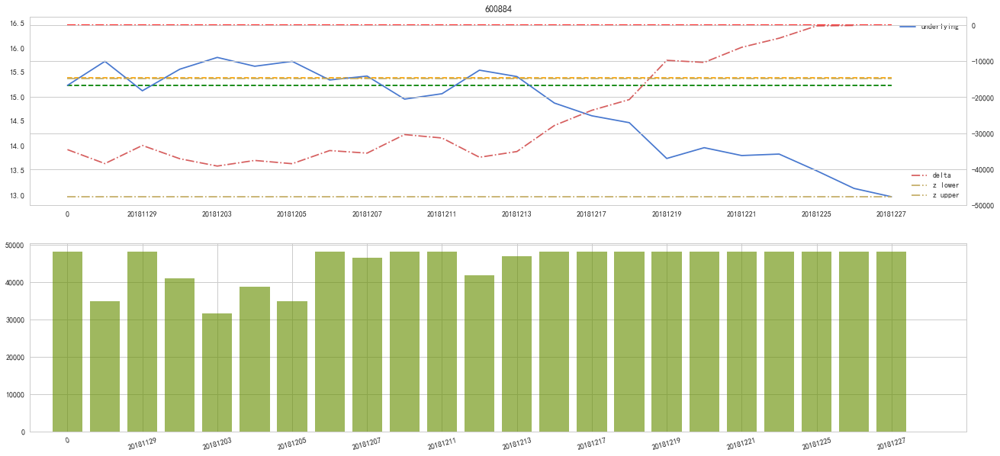

603799


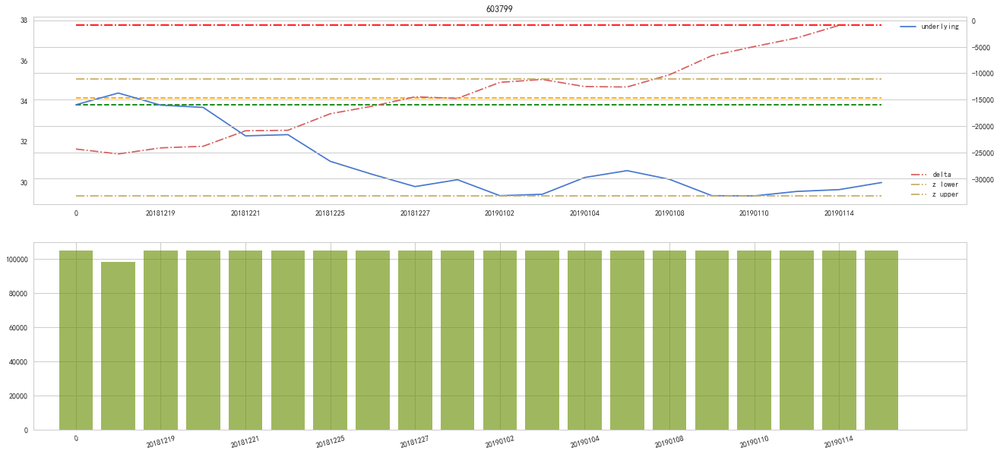

In [93]:
nohedge = []
hedge = []
baozhengjin_added = []
for i in expired.index:
#for i in [78]:
    stock = expired.xs(i).xs('股票代码'); start = int(expired.xs(i).xs('收款日期')); end = max(int(expired.xs(i).xs('出金日期')),int(get_n_week_date_after(str(start),9)))
    true_end = int(expired.xs(i).xs('出金日期'))
    option_fee = expired.xs(i).xs('南华虚值')/(expired.xs(i).xs('保证金')/0.15); capital = expired.xs(i).xs('保证金')/0.15
    S_0 = full_nonright.xs((stock,start)).xs(5)
    try:
        S_1 = full_nonright.xs((stock,end)).xs(8); K = S_0 * (1.01)
    except:
        nohedge.append(0)
        hedge.append(0)
        baozhengjin_added.append(0)
        continue
    
    print(stock)
    n_share_option = -capital/S_0
        
    r = R.xs(start)/100
    lameda = 0.02
    alpha = (5 if 0<S_0<=10 else (0.8 if 10<S_0<=20 else (0.6 if 20<S_0<=30 else (0.4 if 30<S_0<=40 else 0.2))))
        
    sub_price_info = full_nonright.xs(stock,level=0)
    sub_price_info = sub_price_info[(sub_price_info.index>=start) & (sub_price_info.index<end)][8]
    sub_zz_info = zzIcData[(zzIcData.index>=start) & (zzIcData.index<=end)][5]
    sub_zz_info.loc[0] = np.nan
    sub_zz_info.sort_index(inplace=True)
    sub_price_info.loc[0] = S_0
    sub_price_info.loc[end] = S_1
    sub_price_info.sort_index(inplace=True)
    
    #****#
    start = int(get_n_week_date_before(str(start)))
    
    needed_delta_list = []
    delta_list = []
    stock_money = []
    extra_capital = []
    n_stock_list = []
    n_stock_hold = 0
    if mkt_cap_ard.loc[start,stock] <= 10000000000 or amt.loc[start,stock] <= 50000000:
        extra_capital = pd.Series([0] * len(sub_price_info), index = sub_price_info.index)
        stock_money = pd.Series([0] * len(sub_price_info), index = sub_price_info.index).cumsum()
        delta_list = pd.Series([0] * len(sub_price_info), index = sub_price_info.index)
        needed_delta_list = pd.Series([0] * len(sub_price_info), index = sub_price_info.index)
    else:
        for holding_date in sub_price_info.index:
            needed_delta = 0
            if holding_date == 0:
                sigma = implied_volatility(S_0, K, option_fee*S_0, 0, r, start, end)
                current_delta = option_result(S_0, K, 0, r, start, end, volatility=sigma).delta()
                current_gamma = option_result(S_0, K, 0, r, start, end, origin_price_info = (option_fee*S_0, S_0, start)).gamma()

                t = how_many_week_date_between(str(start),str(end))/annualize_factor
                L = -4.76 * ((lameda**0.78)/(t**0.02)) * ((np.exp(-r*t)/sigma)**0.25) * ((alpha*(S_0**2)*np.abs(current_gamma))**0.15)
                H_0 = lameda/(alpha * S_0 * (sigma**2) * t)
                H_1 = 1.12 * (lameda**0.31) * (t**0.05) * ((np.exp(-r*t)/sigma)**0.25) * ((np.abs(current_gamma)/alpha)**0.5)
                sigma_m = sigma * np.sqrt(1 + L)

                new_center = option_result(S_0, K, 0, r, start, end, volatility=sigma_m).delta() * n_share_option
                
                H_0 = 0.2
                H_1 = 0.3
                new_center = current_delta * n_share_option
                
                #H_0 和 H_1 都是正的，n_share_option是负的，所以upper是 - ，lower是 +
                lower_bound = new_center + (H_0 + H_1) * n_share_option
                upper_bound = new_center - (H_0 + H_1) * n_share_option
                
                lower_bound = new_center + (H_0) * n_share_option
                upper_bound = new_center - (H_1) * n_share_option
                
                z_band_lower_list = pd.Series([lower_bound] * len(sub_price_info), index = sub_price_info.index)
                z_band_upper_list = pd.Series([upper_bound] * len(sub_price_info), index = sub_price_info.index)
                stock_money.append(0)
                needed_delta_list.append(0)
                extra_capital.append(0)
                delta_list.append(current_delta * n_share_option)
            elif holding_date == end:
                #最后一天不会再有操作，按收盘价结算就可以了
                stock_money.append((n_stock_hold - needed_delta)*sub_price_info.diff().xs(holding_date))
                #print(holding_date, (n_stock_hold - needed_delta)*sub_price_info.diff().xs(holding_date))
                needed_delta_list.append(0)
                extra_capital.append(-n_stock_hold * sub_price_info.xs(holding_date))
                delta_list.append(np.nan)
            else:
                backward_delta = (lower_bound - n_stock_hold)/n_share_option
                
                lower_bound_rehedge_price = round(backward_spot_price(backward_delta, K, 0, r, start, end, volatility = sigma),2)
                #print(backward_delta,lower_bound_rehedge_price)
                backward_delta = (upper_bound - n_stock_hold)/n_share_option
                
                upper_bound_rehedge_price = round(backward_spot_price(backward_delta, K, 0, r, start, end, volatility = sigma),2)
                #print(backward_delta, upper_bound_rehedge_price)
                if upper_bound_rehedge_price > low.loc[holding_date,stock] and lower_bound_rehedge_price < high.loc[holding_date,stock]:
                    print('wtf',holding_date,upper_bound_rehedge_price,lower_bound_rehedge_price)
                    while(True):
                        mid = input()
                        if mid == 'short':
                            print(holding_date, 'low', upper_bound_rehedge_price, low.loc[holding_date,stock])
                            needed_delta = max(new_center - upper_bound, -n_stock_hold)
                            n_stock_hold += needed_delta
                            extra_capital.append(needed_delta * upper_bound_rehedge_price)
                            stock_money.append(needed_delta*(sub_price_info.xs(holding_date) - upper_bound_rehedge_price) + \
                                       (n_stock_hold - needed_delta)*sub_price_info.diff().xs(holding_date))
                            break
                        elif mid == 'long':
                            print(holding_date, 'high', lower_bound_rehedge_price, high.loc[holding_date,stock])
                            needed_delta = new_center - lower_bound
                            n_stock_hold += needed_delta
                            extra_capital.append(needed_delta * lower_bound_rehedge_price)
                            stock_money.append(needed_delta*(sub_price_info.xs(holding_date) - lower_bound_rehedge_price) + \
                                       (n_stock_hold - needed_delta)*sub_price_info.diff().xs(holding_date))
                            break
                elif upper_bound_rehedge_price > low.loc[holding_date,stock]:
                    print(holding_date, 'low', upper_bound_rehedge_price, low.loc[holding_date,stock])
                    needed_delta = max(new_center - upper_bound, -n_stock_hold)
                    n_stock_hold += needed_delta
                    extra_capital.append(needed_delta * upper_bound_rehedge_price)
                    stock_money.append(needed_delta*(sub_price_info.xs(holding_date) - upper_bound_rehedge_price) + \
                                       (n_stock_hold - needed_delta)*sub_price_info.diff().xs(holding_date))
                elif lower_bound_rehedge_price < high.loc[holding_date,stock]:
                    print(holding_date, 'high', lower_bound_rehedge_price, high.loc[holding_date,stock])
                    needed_delta = new_center - lower_bound
                    n_stock_hold += needed_delta
                    extra_capital.append(needed_delta * lower_bound_rehedge_price)
                    stock_money.append(needed_delta*(sub_price_info.xs(holding_date) - lower_bound_rehedge_price) + \
                                       (n_stock_hold - needed_delta)*sub_price_info.diff().xs(holding_date))
                else:
                    extra_capital.append(0)
                    stock_money.append((n_stock_hold - needed_delta)*sub_price_info.diff().xs(holding_date))
                #stock_money.append((n_stock_hold - needed_delta)*sub_price_info.diff().xs(holding_date))
                #print(holding_date, needed_delta, n_stock_hold, (n_stock_hold - needed_delta)*sub_price_info.diff().xs(holding_date),\
                #      option_result(sub_price_info.xs(holding_date), K, 0, r, holding_date, end,volatility = sigma).delta())    
                current_delta = option_result(sub_price_info.xs(holding_date), K, 0, r, holding_date, end,volatility = sigma).delta() * n_share_option + n_stock_hold
                needed_delta_list.append(needed_delta)
                delta_list.append(current_delta)
            n_stock_list.append(n_stock_hold)
        extra_capital = pd.Series(extra_capital, index = sub_price_info.index)
        stock_money = pd.Series(stock_money, index = sub_price_info.index).cumsum()
        delta_list = pd.Series(delta_list, index = sub_price_info.index)
        needed_delta_list = pd.Series(needed_delta_list, index = sub_price_info.index)
        n_stock_list = pd.Series(n_stock_list, index = sub_price_info.index)
    
    quanlijin = option_fee * capital
    fankuan = ((sub_price_info - K)/S_0).round(5) * capital
    fankuan[fankuan<0] = 0
    lirun = quanlijin - fankuan
    lirun[lirun>0] *= 0.6

    n = len(sub_price_info)
    divide_factor = max(n//10,1)
    X = np.arange(n)
    Xlabel = [index for index,value in enumerate(sub_price_info.index) if index%divide_factor == 0]
    fig = plt.figure(figsize = (22,10))
    ax1 = fig.add_subplot(211)
    ax1.plot((sub_price_info).tolist(),label = 'underlying')
    #ax1.plot((sub_zz_info/sub_zz_info.iloc[1]).tolist(),label = 'zz500')
    ax1.grid(False)
    plt.legend(loc=0)
    ax1_ = ax1.twinx()
    ax1_.plot(delta_list.tolist(),'r-.',label = 'delta')
    ax1_.plot(z_band_lower_list.tolist(),'y-.',label = 'z lower')
    ax1_.plot(z_band_upper_list.tolist(),'y-.',label = 'z upper')
    plt.legend(loc=4)
    ax1.hlines(S_0*(1 + option_fee),0,n-1,linestyles='-.',color = 'red')
    ax1.hlines(S_0*1.01,0,n-1, linestyles='--',color = 'orange')
    ax1.hlines(S_0*1,0,n-1, linestyles='--',color = 'green')
    ax1.set_xlim(-1,n+1)
    ax1.set_xticks(Xlabel)
    ax1.set_xticklabels([value for index,value in enumerate(sub_price_info.index) if index%divide_factor == 0])
    plt.setp(plt.gca().get_xticklabels(),rotation=15)
    plt.title(stock)
    ax2 = fig.add_subplot(212)
    ax2.bar(range(len(lirun)),lirun.tolist(),color = 'green', alpha = .5)
    ax2.bar(range(len(lirun)),(lirun+stock_money).tolist(),color = 'orange', alpha = .25)
    ax2.set_xlim(-1,n+1)
    ax2.set_xticks(Xlabel)
    ax2.set_xticklabels([value for index,value in enumerate(sub_price_info.index) if index%divide_factor == 0])
    plt.setp(plt.gca().get_xticklabels(),rotation=15)
    plt.show()
    
    nohedge.append(lirun.loc[true_end])
    hedge.append((lirun+stock_money).loc[true_end])
    baozhengjin_added.append(extra_capital[extra_capital.index<=true_end].cumsum().max())

In [94]:
nohedge = pd.Series(nohedge,index= expired.index)
hedge = pd.Series(hedge,index= expired.index)
baozhengjin_added = pd.Series(baozhengjin_added,index= expired.index)

In [95]:
((expired['完成净利润']/expired['保证金'])/expired['持有时间']).mean()*250

2.055656071970897

In [96]:
(((expired['完成净利润']+hedge-nohedge)/(expired['保证金']+baozhengjin_added))/expired['持有时间']).mean()*250

2.718488585072134

In [97]:
hedge.sum()

1088147.5963095329

In [98]:
nohedge.sum()

1075358.0

In [67]:
baozhengjin_added.value_counts()[0]/len(baozhengjin_added)

0.8189655172413793

In [69]:
(baozhengjin_added*0.6).sum()

1760343.412938673

In [70]:
expired

,股票名称,股票代码,收款日期,收款账户,收款金额,付款日期,付款账户,付款金额,南华虚值,出金日期,兑付金额,净利润,保证金,合计款,完成净利润,持有时间
89,国海证券,750,20181228,宏运,48960,20181228,宏运,48060,43110,20190104,203076,-159966,135000,-24966,-159966.0,4
79,鸿达兴业,2002,20181226,宏运,52560,20181226,宏运,51760,47360,20190118,132688,-85328,120000,34672,-85328.0,16
88,第一创业,2797,20181228,宏运,26600,20181228,宏运,26100,23350,20190108,84045,-60695,75000,14305,-60695.0,6
73,华能水电,600025,20181225,宏运,19900,20181225,宏运,19400,16650,20190109,50985,-34335,75000,40665,-34335.0,10
97,台海核电,2366,20190104,宏运,51000,20190104,宏运,50000,44500,20190114,74680,-30180,150000,119820,-30180.0,7
70,老凤祥,600612,20181224,宏运,25450,20181224,宏运,24950,22100,20190108,38530,-16430,75000,58570,-16430.0,10
93,伟星新材,2372,20190102,宏运,21300,20190102,宏运,20800,18050,20190115,33030,-14980,75000,60020,-14980.0,10
92,伟星新材,2372,20190102,宏运,21300,20190102,宏运,20800,18050,20190115,33030,-14980,75000,60020,-14980.0,10
91,伟星新材,2372,20190102,宏运,21300,20190102,宏运,20800,18050,20190115,33030,-14980,75000,60020,-14980.0,10
41,罗牛山,735,20181219,宏运,28100,20181219,宏运,27600,24750,20190103,35490,-10740,75000,64260,-10740.0,10


In [73]:
135000/0.15*0.5*0.5

225000.0

In [ ]:
-0.2